# Data Description

Source: https://www.kaggle.com/c/home-credit-default-risk/data

- **application_{train|test}.csv**
    - This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET).
    - Static data for all applications. One row represents one loan in our data sample.


- **bureau.csv**
    - All client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in our sample).
    - For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.


- **bureau_balance.csv**
    - Monthly balances of previous credits in Credit Bureau.
    - This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows.


- **POS_CASH_balance.csv**
    - Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.
    - This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows.


- **credit_card_balance.csv**
    - Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.
    - This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credit cards * # of months where we have some history observable for the previous credit card) rows.


- **previous_application.csv**
    - All previous applications for Home Credit loans of clients who have loans in our sample.
    - There is one row for each previous application related to loans in our data sample.


- **installments_payments.csv**
    - Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample.
    - There is a) one row for every payment that was made plus b) one row each for missed payment.
    - One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.


- **HomeCredit_columns_description.csv**
    - This file contains descriptions for the columns in the various data files.

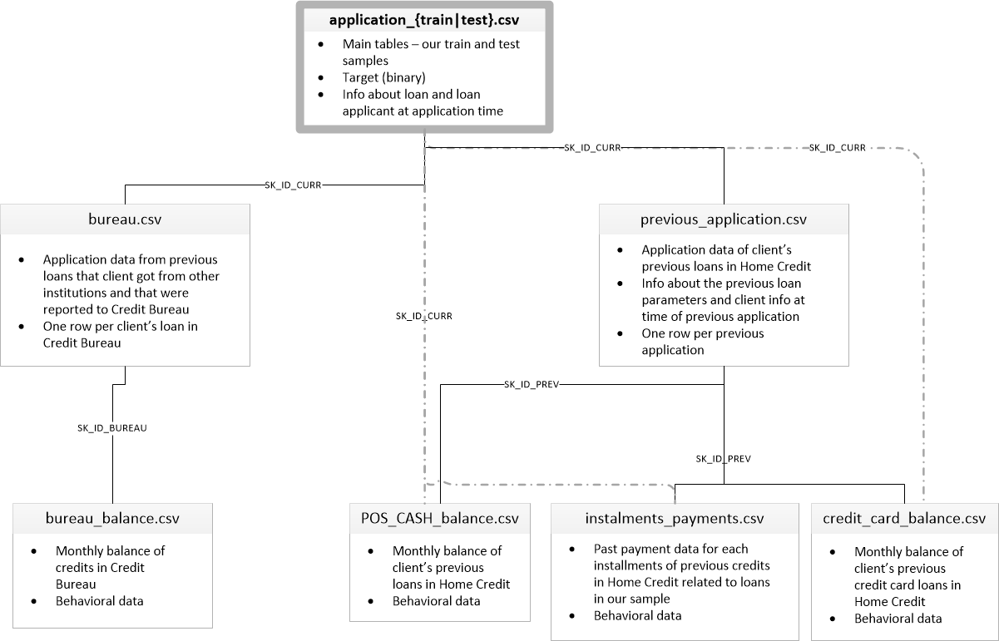

In [1]:
from IPython import display
display.Image('schema.png',
              #retina=True,
             )

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from dataprep.eda import plot, plot_correlation, plot_missing #https://github.com/sfu-db/dataprep
%matplotlib inline

import pickle

import warnings
warnings.filterwarnings('ignore')

#Visualiser le maximum possible d'information
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)

Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.


# Exploration

In [3]:
################################################################################################
def head_shape(df, df_name):
    print('{} shape: {}'.format(df_name, df.shape))
    return df.head(2) #Print shape and head of chosen dataframe
################################################################################################
def indexer_categorical_cols(df_train, df_test):
    categorical_feats = df_train.select_dtypes(include=['object', 'category']).columns.tolist()
    for f_ in categorical_feats:
        df_train[f_], indexer = pd.factorize(df_train[f_])
        df_test[f_] = indexer.get_indexer(df_test[f_])

    return df_train, df_test
################################################################################################
def agg_categorical_cols(df, sk_col, code):
    df_d = pd.get_dummies(df.select_dtypes(include=['object', 'category'])) #Select only categorical columns
    df_d[sk_col] = df[sk_col] #Add the selected SK_ID to the dataframe of categorical columns
           
    df_agg = df_d.groupby(sk_col, as_index=False).agg(['sum', 'mean']) #group columns and statistics
    
    new_cols = []
    
    for col_agg in df_agg.columns.levels[0]: #Iterate through variables
        if col_agg != sk_col: #Ignore the chosen grouping SK_ID
            for stat in df_agg.columns.levels[1]: #Statistics
                new_cols.append('{}_{}_{}'.format(col_agg, stat, code)) #Creates a new column for each statistic
    
    df_agg.columns = new_cols
    print('Aggregated categorical shape: {}'.format(df_agg.shape))
    return df_agg #Add aggregated columns based on dummies of the categorical columns

################################################################################################
def agg_numerical_cols(df, sk_col, code):
    for col in df: #drops all the SK_ID-type cols that where not selected
        if col != sk_col and 'SK_ID' in col or 'TARGET' in col: 
            df = df.drop(columns=col, axis=1)
    
    num_cols = df.select_dtypes(exclude=['object', 'category']) #select only numerical columns
    
    df_agg = num_cols.groupby(sk_col).agg(['min', 'max', 'mean', 'sum', 'var']).reset_index() #group columns and statistics
    
    new_cols = [sk_col] #new columns names

    for col_agg in df_agg.columns.levels[0]: #Iterate through variables
        if col_agg != sk_col: #Ignore the chosen grouping SK_ID
            for stat in df_agg.columns.levels[1][:-1]: #Statistics
                new_cols.append('{}_{}_{}'.format(col_agg, stat, code)) #Creates a new column for each statistic
            
    df_agg.columns = new_cols
    print('Aggregated numerical shape: {}'.format(df_agg.shape))
    return df_agg #Add aggregated columns based on dummies of the numerical columns
################################################################################################
def merge_dfs(df1, df2, sk_col, how='left'):
    df = pd.merge(df1, df2, on=sk_col, how=how)
    print('Merged shape:', df.shape)
    return df #Merge the chosen dataframes on a given column and method, then prints merged shape
################################################################################################
def kde_var_TARGET(df, var):
    corr = df['TARGET'].corr(df[var])
    target_0 = df.loc[df['TARGET'] == 0, var] #repaid
    avg_target_0 = target_0.median()
    target_1 = df.loc[df['TARGET'] == 1, var] #unpaid
    avg_target_1 = target_1.median()
    
    plt.figure(figsize=(10, 7))
    
    if 'DAYS' in var:
        sns.kdeplot(target_0/-365, label='TARGET: 0')
        sns.kdeplot(target_1/-365, label='TARGET: 1')    
    else:
        sns.kdeplot(target_0, label='TARGET: 0')
        sns.kdeplot(target_1, label='TARGET: 1')    
    
    plt.ylabel('Density')
    if 'DAYS' in var:
        plt.xlabel('{} (in years)'.format(var))
        plt.title('{} (in years) distributrion'.format(var))
    else:
        plt.xlabel(var)
        plt.title('{} distributrion'.format(var))
    plt.legend()
    
    print('Correlation between {} and TARGET: {}'.format(var, round(corr, 4)))
    print('Average value the payed (TARGET 0) credits: {}'.format(round(avg_target_0, 4)))
    print('Average value the unpayed (TARGET 1) credits: {}'.format(round(avg_target_1, 4)))
    
    plt.show()
################################################################################################
def create_bins_TARGET(df, to_bin, format_bin='YEARS', bin_size=5):
    extract = df[[to_bin, 'TARGET']]
    
    if format_bin == 'DAYS':
        extract[format_bin] = extract[to_bin]/-365
    
    else:
        extract[format_bin] = extract[to_bin]
        
    max_val = np.ceil(extract[format_bin].max()).astype(int)
    min_val = np.floor(extract[format_bin].min()).astype(int)
    n_bins = (round((max_val - min_val)/bin_size,0)+1).astype(int)
    
    extract['BINS'] = pd.cut(extract[format_bin], bins=np.linspace(min_val, max_val, num=n_bins))
    extract_bins = extract.groupby('BINS').mean().drop(to_bin, axis=1)

    return extract_bins
################################################################################################
def plt_bins_bars(df, xlabel):
    plt.figure(figsize=(5, 5))
    plt.bar(df.index.astype(str), 100*df['TARGET'])
    plt.xticks(rotation=90)
    plt.xlabel('{} (in years)'.format(xlabel))
    plt.ylabel('Unpayed percentage')
    plt.title('Unpayments percentage by {}'.format(xlabel))
    plt.show()
################################################################################################
def plt_cat_hbars(df, xlabel):
    temp = df[xlabel].value_counts()
    df_temp = pd.DataFrame({xlabel: temp.index, 'Q of contracts': temp.values})
    proportions = df[[xlabel, 'TARGET']].groupby([xlabel], as_index=False).mean()
    proportions.sort_values(by='TARGET', ascending=False, inplace=True)
    
    if len(temp) > 10:
        plt.figure(figsize=(15, 10))
    
    else:
        plt.figure(figsize=(15, 5))
    
    plt.subplot(121)
    splt1 = sns.barplot(y=xlabel, x='Q of contracts', data=df_temp)
    
    plt.subplot(122)
    splt2 = sns.barplot(y=xlabel, x='TARGET', data=proportions)
    plt.xlabel('Unpayed')
    plt.ylabel(xlabel)
    
    plt.tick_params(axis='both', which='major')
    plt.subplots_adjust(wspace=0.5)
    plt.show()
#######################################################################################################
def get_corr_to(df, to='TARGET'):
    corrs_list = []
    for col in df.columns:
        if col != to:
            corr = abs(df[to].corr(df[col]))
            corrs_list.append(corr)
    cols = df.drop(columns=to, axis=1).columns.tolist()
    output = pd.DataFrame({'variable':cols, 'Correlation':corrs_list})
    return output.sort_values('Correlation', ascending=False).reset_index(drop=True)
################################################################################################
def drop_high_corr(df, threshold=0.8, n_rows=10000):
    df_temp = df.copy()
    df_temp = df_temp[:n_rows]
    corr_matrix = df_temp.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
    to_drop = [col for col in upper.columns if any(upper[col] > threshold)]
    print('Using {} rows, {} columns out of {} where dropped since their correlation is over {}'.format(n_rows, len(to_drop), df.shape[1], threshold))
    df = df.drop(labels=to_drop, axis=1)
    del df_temp
    return df
################################################################################################
def nan_table(df):
    colsFilled = df.count()
    colsFilled.sort_values(ascending=False,inplace=True)
    n_filled = len(colsFilled.where(colsFilled == colsFilled.max()).dropna())
    colsFilled.where(colsFilled < colsFilled.max(), inplace=True)
    colsFilled.dropna(inplace=True)

    print('Columns without missing values: {}'.format(n_filled))
    print('Columns with missing values: {}'.format(len(colsFilled)))
    
    colsFilled = colsFilled.to_frame('Present values')
    colsFilled['Missing values'] = colsFilled['Present values'].apply(lambda x: df.shape[0] - x)
    colsFilled['% of completeness'] = colsFilled['Present values'].apply(lambda x: round(x * 100 / df.shape[0], 4))

    return colsFilled
################################################################################################
def delete_nan(df, maxNan): #maxNan: ratio of completeness
    og_shape = df.shape
    df = df.replace(to_replace='^nan$', value=np.nan, regex=True)
    notdf = df.copy()
    notNanQ = (df.notna().sum())/df.shape[0]
    nCol = df.shape[1]
    df = df[notNanQ[notNanQ>=maxNan].index.tolist()]
    notdf = notdf[notNanQ[notNanQ<maxNan].index.tolist()]
    nCol = nCol-df.shape[1]
    print('Original shape: {}'.format(og_shape))
    print('Deleted columns: {}'.format(nCol))
    print('Final shape: {}'.format(df.shape))
    #print(notdf.columns.values.tolist())
    return df
################################################################################################
def reduce_mem_usage(df):
    #Reduce memory usage by iterating through the columns)
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns: #The reduction will be based on the type of each column
        col_type = df[col].dtype 
        
        if col_type != object: #If the column isn't an object or category
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum()/1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100*(start_mem-end_mem)/start_mem))
    
    return df
################################################################################################

### Application Train & Test

In [4]:
app_train = pd.read_csv('files/application_train.csv')
app_test = pd.read_csv('files/application_test.csv')
total_applications = app_train.append(app_test).reset_index()

target = app_train.filter(['SK_ID_CURR', 'TARGET'])

In [5]:
head_shape(app_train, 'app_train')

app_train shape: (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
head_shape(app_test, 'app_test')

app_test shape: (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.066,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0


<AxesSubplot:ylabel='Frequency'>

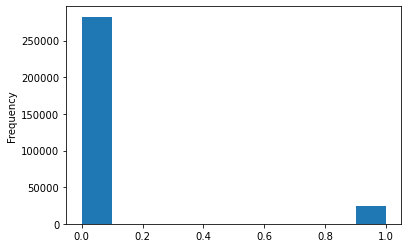

In [7]:
app_train['TARGET'].astype(int).plot.hist()

Class Imbalance Problem

From **HomeCredit_columns_description.csv** we get that:
>TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)"

Therefore TARGET=1 means that the loan wasn't repaid.

#### Outliers

In [8]:
app_train[['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH']].head()

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH
0,-9461,-637,-3648.0,-2120
1,-16765,-1188,-1186.0,-291
2,-19046,-225,-4260.0,-2531
3,-19005,-3039,-9833.0,-2437
4,-19932,-3038,-4311.0,-3458


In [9]:
(app_train[['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH']]/-365).describe() #bring the data from days to years

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH
count,307511.000000,307511.000000,307511.000000,307511.000000
mean,43.936973,-174.835742,13.660604,8.203294
std,11.956133,387.056895,9.651743,4.135481
min,20.517808,-1000.665753,-0.000000,-0.000000
25%,34.008219,0.791781,5.506849,4.712329
50%,43.150685,3.323288,12.339726,8.915068
75%,53.923288,7.561644,20.491781,11.778082
max,69.120548,49.073973,67.594521,19.717808


Analysis:

- DAYS_BIRTH: the values seem to be fairly reasonable with a minimum of 20 years and a maximum of 69 years.
- DAYS_EMPLOYED: As far as we can asume, no real person worked for more than 1000 years. Furthermore, the value is negative because it's a positive value in the dataframe which in itself is already an outlier.
- DAYS_REGISTRATION and DAYS_ID_PUBLISH: Seem to have reasonable values.

In [10]:
outlier_employed = app_train[app_train['DAYS_EMPLOYED'] == app_train['DAYS_EMPLOYED'].max()]
non_outlier_employed = app_train[app_train['DAYS_EMPLOYED'] != app_train['DAYS_EMPLOYED'].max()]

print('Train set - Outliers in DAYS_EMPLOYED: {} ({}% of values)'.format(len(outlier_employed), 
                                                                                  round(len(outlier_employed)*100/len(app_train), 
                                                                                        2)))

Train set - Outliers in DAYS_EMPLOYED: 55374 (18.01% of values)


In [11]:
(non_outlier_employed['DAYS_EMPLOYED']/-365).describe()

count    252137.000000
mean     6.531971     
std      6.406466     
min     -0.000000     
25%      2.101370     
50%      4.515068     
75%      8.698630     
max      49.073973    
Name: DAYS_EMPLOYED, dtype: float64

The non outliers values look reasonable so we will replace the outliers by NaN.

In [12]:
outlier_employed = app_test[app_test['DAYS_EMPLOYED'] == app_train['DAYS_EMPLOYED'].max()]
print('Test set - {} outlier values will be replaced in DAYS_EMPLOYED ({}% of values)'.format(len(outlier_employed), 
                                                                                                      round(len(outlier_employed)*100/len(app_test), 
                                                                                                            2)))

Test set - 9274 outlier values will be replaced in DAYS_EMPLOYED (19.03% of values)


In [13]:
del outlier_employed, non_outlier_employed

In [14]:
#Loan type unpayment ratio
cols = ['TARGET', 'NAME_CONTRACT_TYPE']
revolving = (app_train['NAME_CONTRACT_TYPE'] == 'Revolving loans')
cash = (app_train['NAME_CONTRACT_TYPE'] == 'Cash loans')
revolving_fail = (app_train['TARGET'] == 1) & (app_train['NAME_CONTRACT_TYPE'] == 'Revolving loans')
cash_fail = (app_train['TARGET'] == 1) & (app_train['NAME_CONTRACT_TYPE'] == 'Cash loans')
print('Cash loans unpayment ratio: {}%'.format(str(round(100*app_train[cols][cash_fail].shape[0]/app_train[cols][cash].shape[0], 2))))
print('Revolving loans unpayment ratio: {}%'.format(str(round(100*app_train[cols][revolving_fail].shape[0]/app_train[cols][revolving].shape[0], 2))))

# stats for target / contract_type cases
applications_by_type = app_train.groupby(['NAME_CONTRACT_TYPE', 'TARGET'], as_index=False).agg({'SK_ID_CURR':['count']})
applications_by_type.columns = ['NAME_CONTRACT_TYPE', 'TARGET', 'count']
applications_by_type['TARGET'] = applications_by_type['TARGET'].replace([0, 1], ['Payed', 'Failed'])
applications_by_type['NAME_CONTRACT_TYPE'] = applications_by_type['NAME_CONTRACT_TYPE'].replace(['Cash loans', 'Revolving loans'], 
                                                                                                ['Cash', 'Revolving'])
applications_by_type['case'] =  applications_by_type['TARGET'] + '_' + applications_by_type['NAME_CONTRACT_TYPE']
applications_by_type

Cash loans unpayment ratio: 8.35%
Revolving loans unpayment ratio: 5.48%


,NAME_CONTRACT_TYPE,TARGET,count,case
0,Cash,Payed,255011,Payed_Cash
1,Cash,Failed,23221,Failed_Cash
2,Revolving,Payed,27675,Payed_Revolving
3,Revolving,Failed,1604,Failed_Revolving


<AxesSubplot:xlabel='case'>

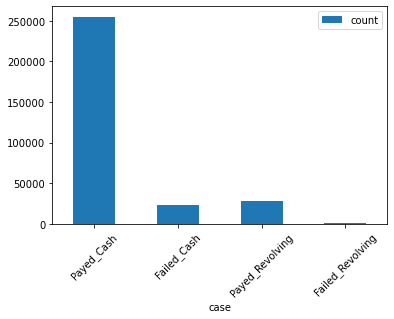

In [15]:
applications_by_type.plot.bar(x='case', y='count', rot=45)

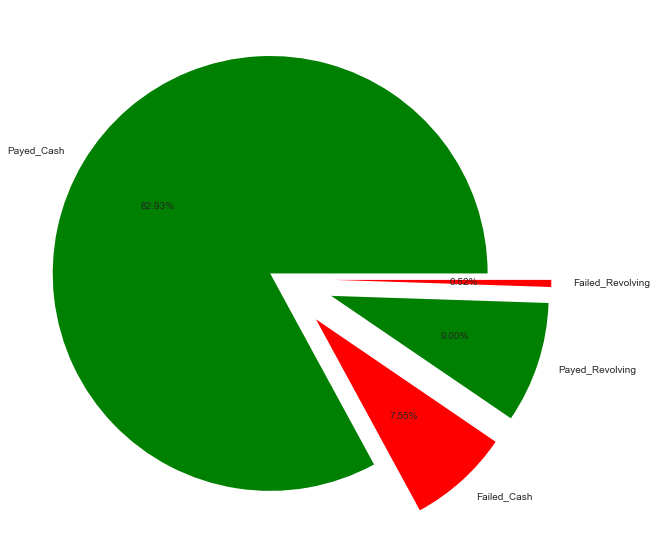

In [16]:
plt.figure(figsize=(10, 10))
plt.style.use('seaborn-white')
plt.pie(applications_by_type['count'],
        explode=(0.05, 0.25, 0.25, 0.25),
        colors=('green', 'red', 'green', 'red'),
        labels=applications_by_type['case'],
        autopct='%1.2f%%',)
plt.show()

<AxesSubplot:xlabel='NAME_CONTRACT_TYPE'>

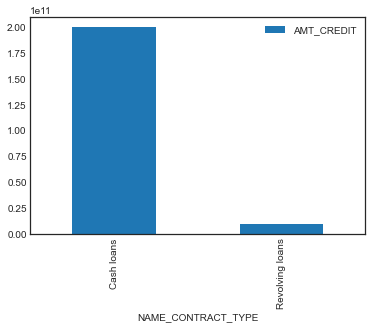

In [17]:
amt_credit_contract_by_type = total_applications.groupby(['NAME_CONTRACT_TYPE'])['AMT_CREDIT'].sum().reset_index()
amt_credit_contract_by_type.plot.bar(x='NAME_CONTRACT_TYPE', y='AMT_CREDIT')

  0%|                                                                                          | 0/114 [00:00<…


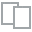
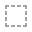
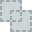
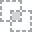
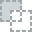
...
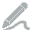
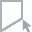
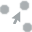
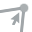
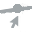

In [18]:
plot(total_applications, "AMT_CREDIT", "NAME_CONTRACT_TYPE")

**Cash loans**, in average, are higher than the **Revolving loans**.

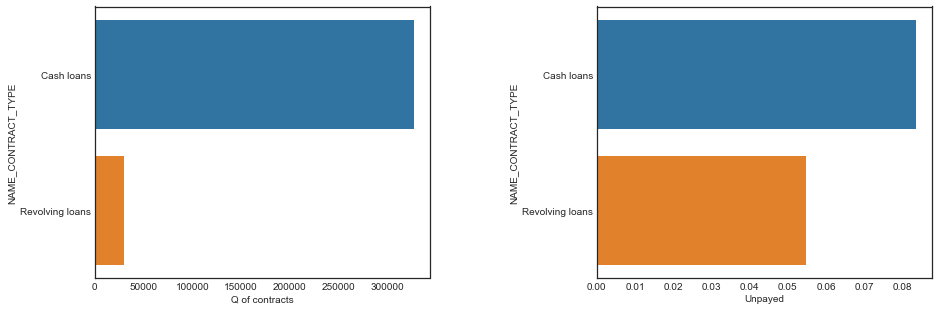

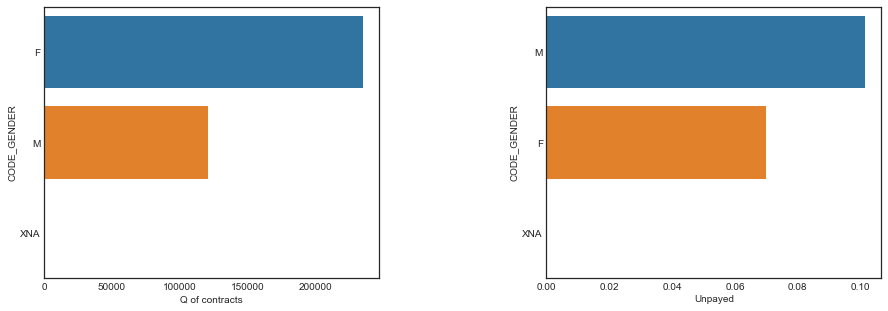

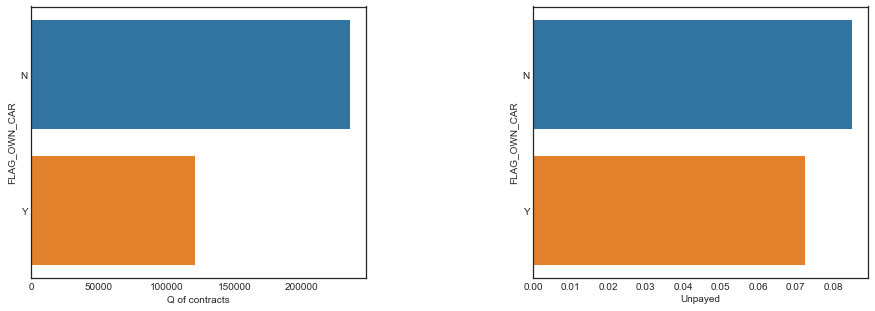

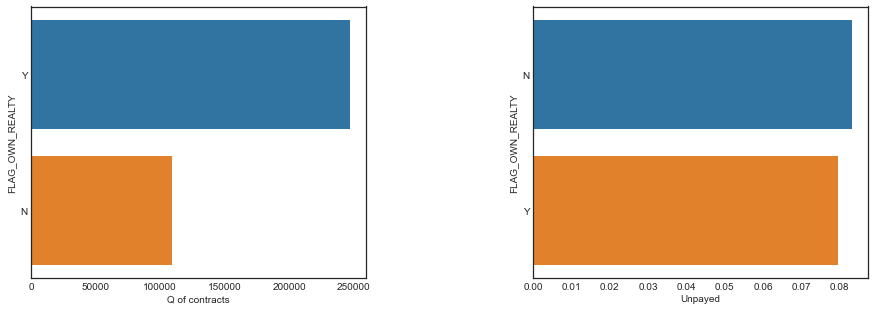

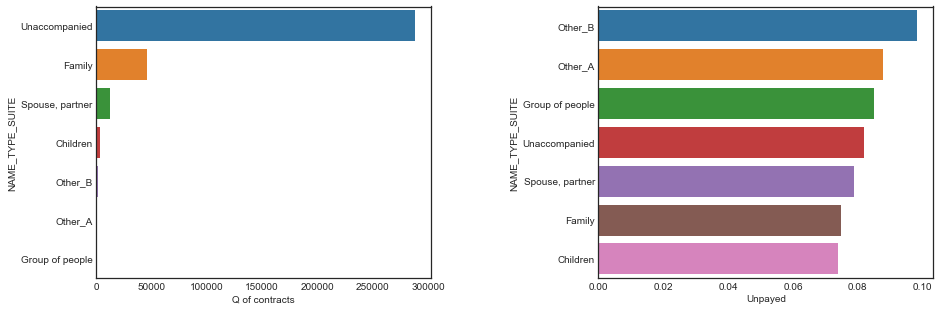

...

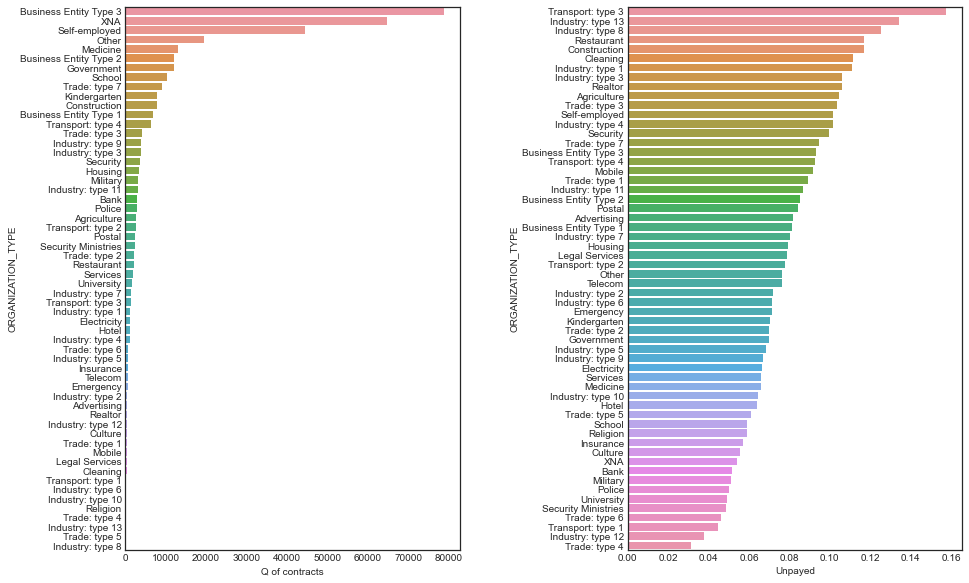

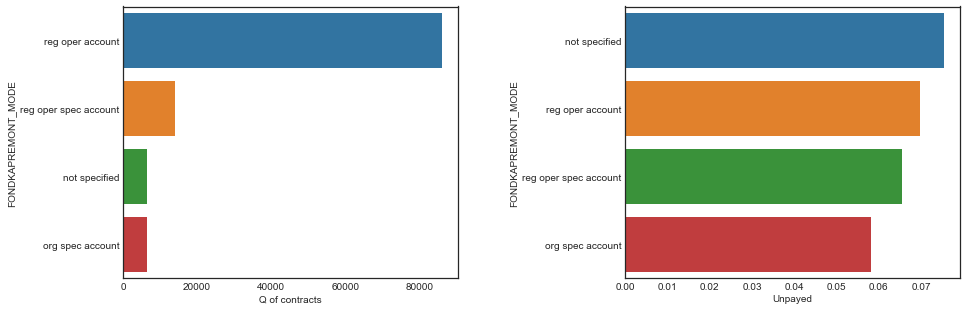

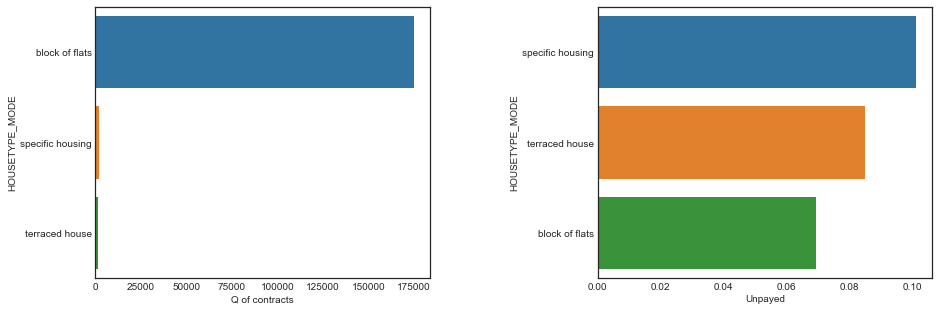

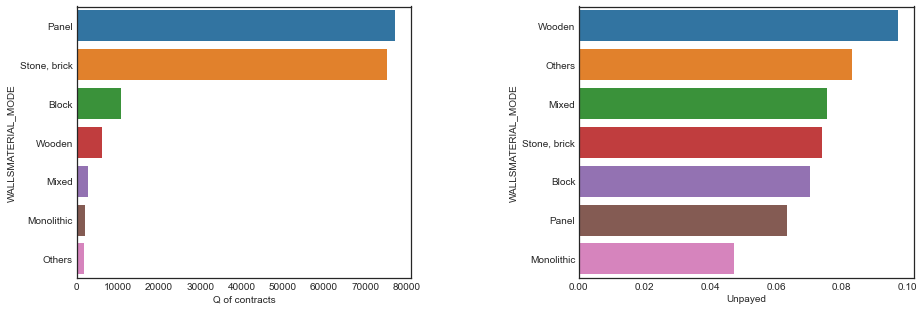

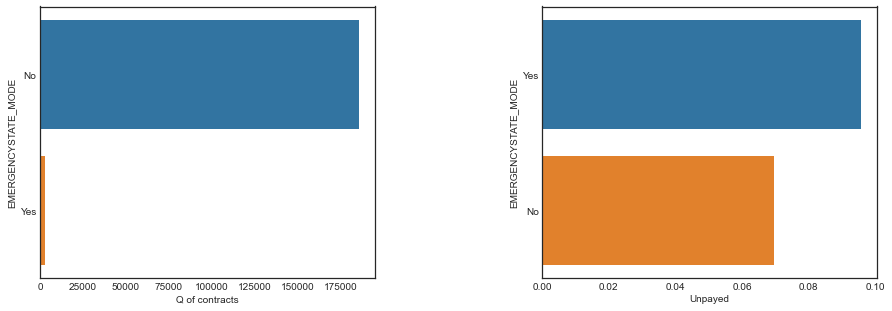

In [19]:
cat_cols = total_applications.select_dtypes(include='object').columns.tolist()
for col in cat_cols:
    plt_cat_hbars(total_applications, col)

By looking at the graphics we can see that **CODE_GENDER** has the **XNA** value. Since we don't know what does **XNA** gender stands for, we will drop the lines containing it.

Furthermore, as stated before, the **DAYS_BIRTH** and other **DAYS** related features are days-wise. It would be easier to work with them in a years-wise format. We need to detail that **DAYS_EMPLOYED** contains a really clear outlier: we deeply hope that no real person worked for more than 1000.

For the **OCCUPATION_TYPE** feature we comple its NAN values with the ones in **NAME_INCOME_TYPE**

In [20]:
total_applications = total_applications[total_applications['CODE_GENDER'] != 'XNA']
app_train = app_train[app_train['CODE_GENDER'] != 'XNA']
app_test = app_test[app_test['CODE_GENDER'] != 'XNA']

total_applications['DAYS_EMPLOYED'].replace(total_applications['DAYS_EMPLOYED'].max(), np.nan, inplace=True) #we replace the 1000 years values for NAN
app_train['DAYS_EMPLOYED'].replace(app_train['DAYS_EMPLOYED'].max(), np.nan, inplace=True) #we replace the 1000 years values for NAN
app_test['DAYS_EMPLOYED'].replace(app_test['DAYS_EMPLOYED'].max(), np.nan, inplace=True) #we replace the 1000 years values for NAN

total_applications['YEARS_BIRTH'] = - total_applications['DAYS_BIRTH'] / 365
total_applications['YEARS_EMPLOYED'] = - total_applications['DAYS_EMPLOYED'] / 365
total_applications['YEARS_REGISTRATION'] = - total_applications['DAYS_REGISTRATION'] / 365
total_applications['YEARS_ID_PUBLISH'] = - total_applications['DAYS_ID_PUBLISH'] / 365

app_train['YEARS_BIRTH'] = - app_train['DAYS_BIRTH'] / 365
app_train['YEARS_EMPLOYED'] = - app_train['DAYS_EMPLOYED'] / 365
app_train['YEARS_REGISTRATION'] = - app_train['DAYS_REGISTRATION'] / 365
app_train['YEARS_ID_PUBLISH'] = - app_train['DAYS_ID_PUBLISH'] / 365

app_test['YEARS_BIRTH'] = - app_test['DAYS_BIRTH'] / 365
app_test['YEARS_EMPLOYED'] = - app_test['DAYS_EMPLOYED'] / 365
app_test['YEARS_REGISTRATION'] = - app_test['DAYS_REGISTRATION'] / 365
app_test['YEARS_ID_PUBLISH'] = - app_test['DAYS_ID_PUBLISH'] / 365

total_applications['OCCUPATION_TYPE'] = total_applications['OCCUPATION_TYPE'].fillna(total_applications['NAME_INCOME_TYPE'])
app_train['OCCUPATION_TYPE'] = app_train['OCCUPATION_TYPE'].fillna(app_train['NAME_INCOME_TYPE'])
app_test['OCCUPATION_TYPE'] = app_test['OCCUPATION_TYPE'].fillna(app_test['NAME_INCOME_TYPE'])

#Some ratio features
total_applications['EMPLOYED_AGE_RATIO'] = total_applications['YEARS_EMPLOYED'] / total_applications['YEARS_BIRTH']
total_applications['CREDIT_INCOME_RATIO'] = total_applications['AMT_CREDIT'] / total_applications['AMT_INCOME_TOTAL']
total_applications['INCOME_PER_PERSON'] = total_applications['AMT_INCOME_TOTAL'] / total_applications['CNT_FAM_MEMBERS']
total_applications['ANNUITY_INCOME_RATIO'] = total_applications['AMT_ANNUITY'] / total_applications['AMT_INCOME_TOTAL']
total_applications['CREDIT_TERM'] = total_applications['AMT_ANNUITY'] / total_applications['AMT_CREDIT']
total_applications.drop(columns=['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH'], inplace=True)

app_train['EMPLOYED_AGE_RATIO'] = app_train['YEARS_EMPLOYED'] / app_train['YEARS_BIRTH']
app_train['CREDIT_INCOME_RATIO'] = app_train['AMT_CREDIT'] / app_train['AMT_INCOME_TOTAL']
app_train['INCOME_PER_PERSON'] = app_train['AMT_INCOME_TOTAL'] / app_train['CNT_FAM_MEMBERS']
app_train['ANNUITY_INCOME_RATIO'] = app_train['AMT_ANNUITY'] / app_train['AMT_INCOME_TOTAL']
app_train['CREDIT_TERM'] = app_train['AMT_ANNUITY'] / app_train['AMT_CREDIT']
app_train.drop(columns=['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH'], inplace=True)

app_test['EMPLOYED_AGE_RATIO'] = app_test['YEARS_EMPLOYED'] / app_test['YEARS_BIRTH']
app_test['CREDIT_INCOME_RATIO'] = app_test['AMT_CREDIT'] / app_test['AMT_INCOME_TOTAL']
app_test['INCOME_PER_PERSON'] = app_test['AMT_INCOME_TOTAL'] / app_test['CNT_FAM_MEMBERS']
app_test['ANNUITY_INCOME_RATIO'] = app_test['AMT_ANNUITY'] / app_test['AMT_INCOME_TOTAL']
app_test['CREDIT_TERM'] = app_test['AMT_ANNUITY'] / app_test['AMT_CREDIT']
app_test.drop(columns=['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH'], inplace=True)

Correlation between YEARS_BIRTH and TARGET: -0.0782
Average value the payed (TARGET 0) credits: 43.4986
Average value the unpayed (TARGET 1) credits: 39.1288


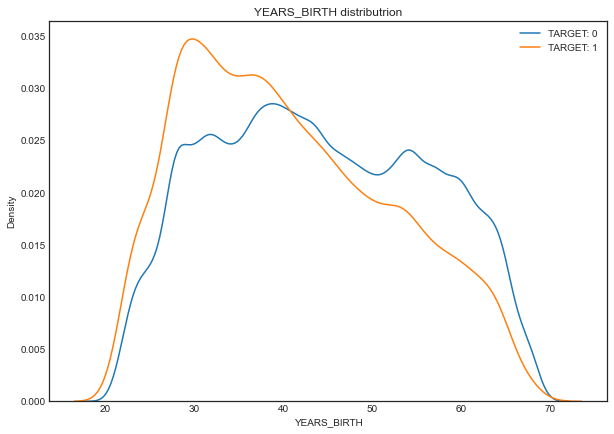

In [21]:
kde_var_TARGET(app_train, 'YEARS_BIRTH')

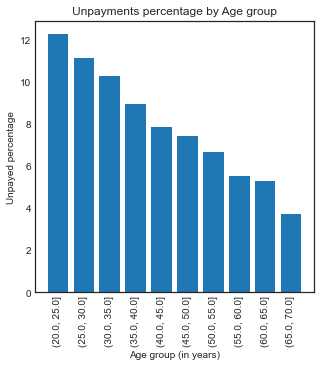

In [22]:
age_bins = create_bins_TARGET(app_train, 'YEARS_BIRTH', 'YEARS', 5)
plt_bins_bars(age_bins, 'Age group')

We can see that the unpayed curve is skewed towards the younger clients. This situation is most likely going to be useful in a machine learning model because it does affect **TARGET**. In the 5 years age brackets we can see a clear trend between youth and unpayment.

According to the documentation there are 3 columns containing **EXT_SOURCE_1**, **EXT_SOURCE_2** and **EXT_SOURCE_3** that represent a "normalized score from external data source". We can assume each columns contains a cumulative value or score of some sort calculated using multiple sources.

Correlation between EXT_SOURCE_1 and TARGET: -0.1553
Average value the payed (TARGET 0) credits: 0.5175
Average value the unpayed (TARGET 1) credits: 0.3617


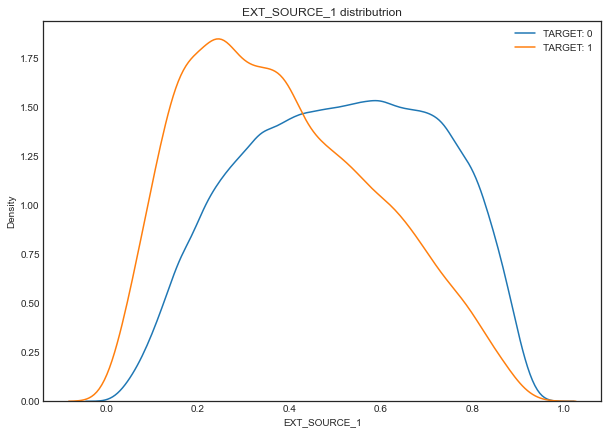

Correlation between EXT_SOURCE_2 and TARGET: -0.1605
Average value the payed (TARGET 0) credits: 0.5739
Average value the unpayed (TARGET 1) credits: 0.4404


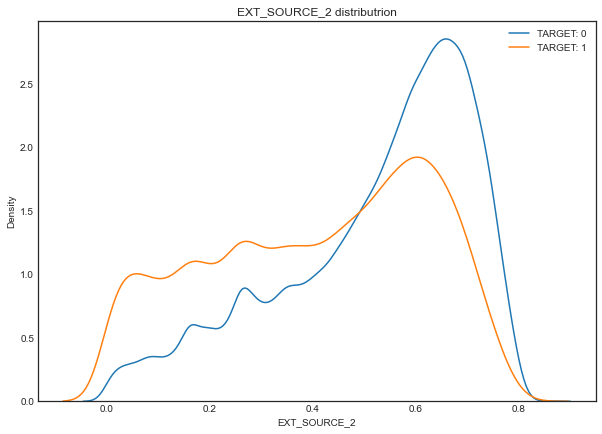

Correlation between EXT_SOURCE_3 and TARGET: -0.1789
Average value the payed (TARGET 0) credits: 0.546
Average value the unpayed (TARGET 1) credits: 0.3791


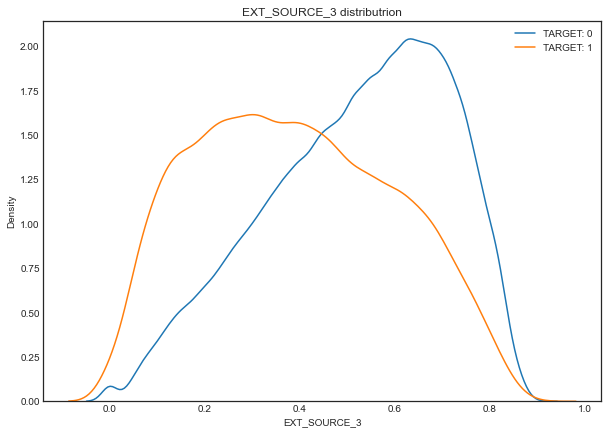

In [23]:
for i in app_train.columns[app_train.columns.str.contains('EXT_')]:
    kde_var_TARGET(app_train, i)

**EXT_SOURCE_3** show the biggest difference between the payed and unpayed **TARGET** values.

Let's see the othher categorical columns:

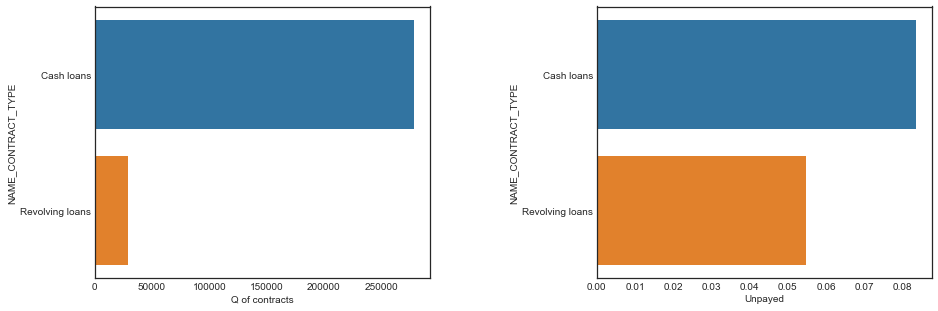

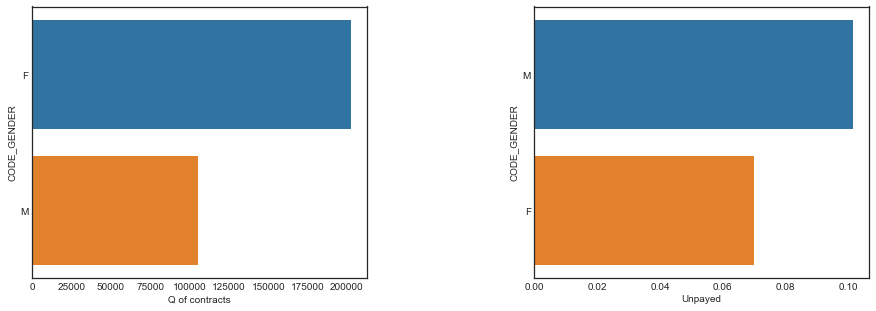

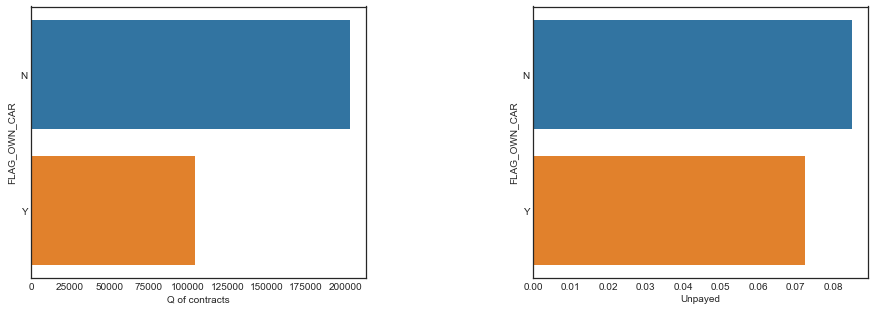

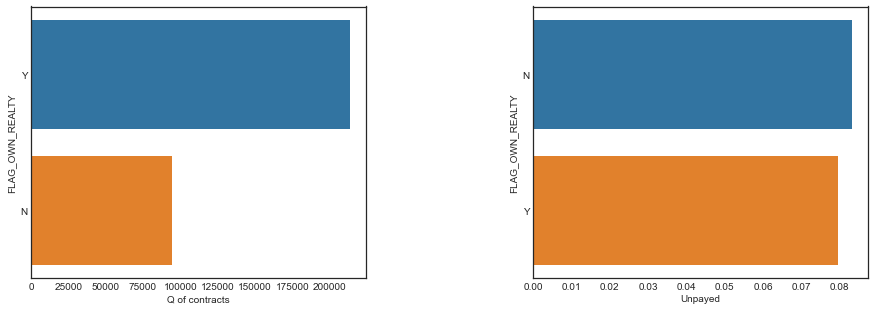

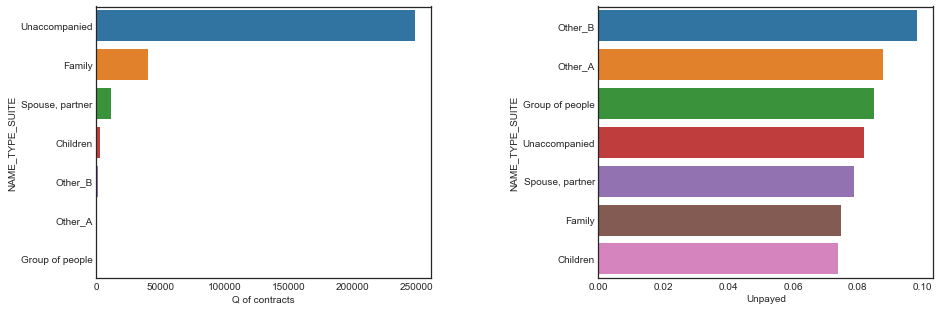

...

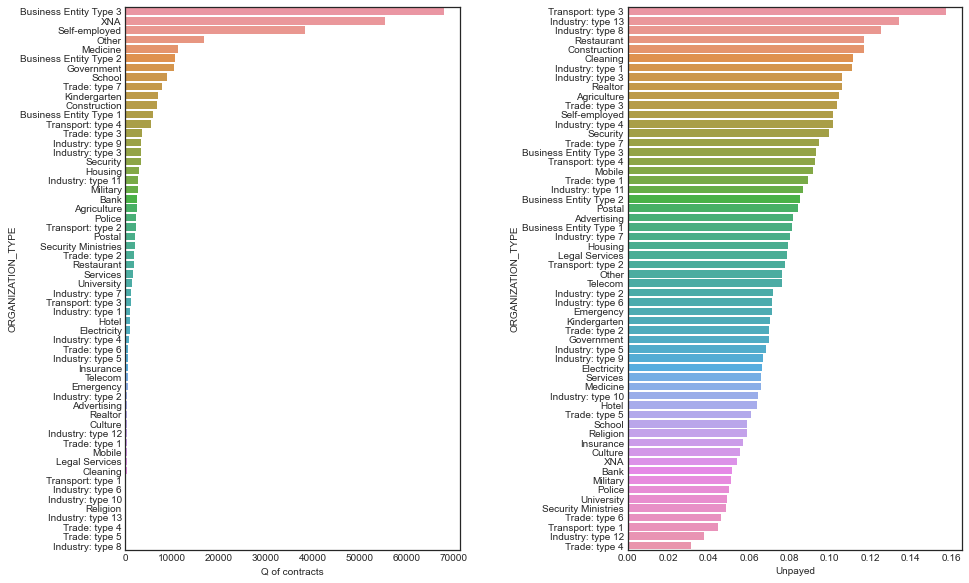

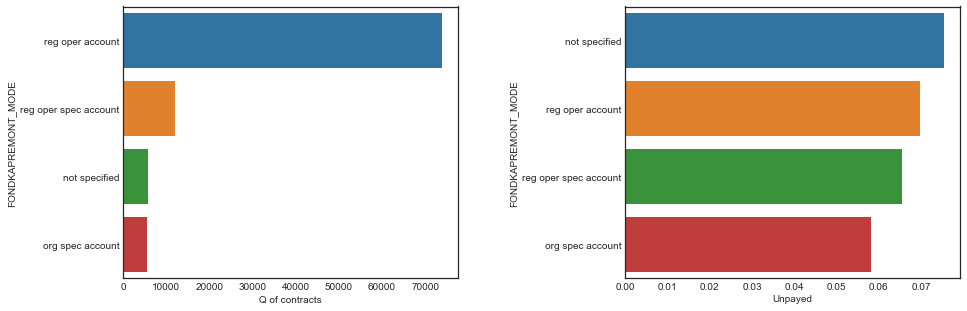

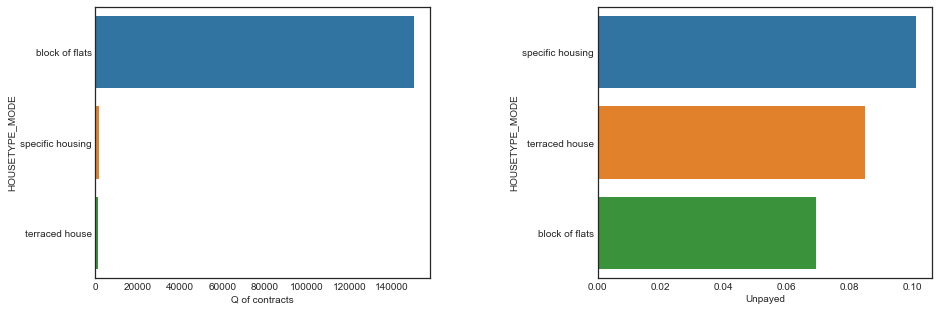

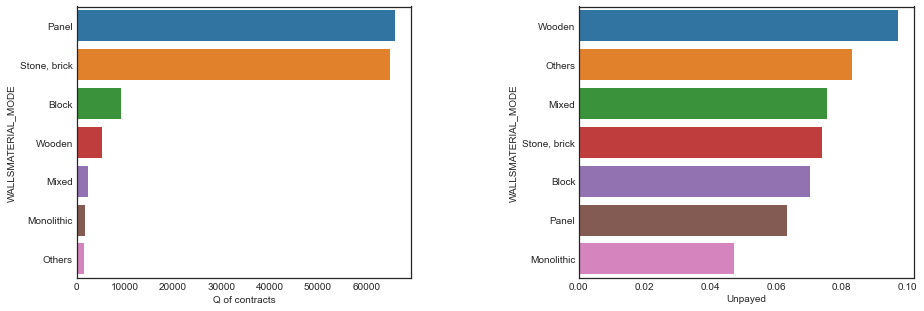

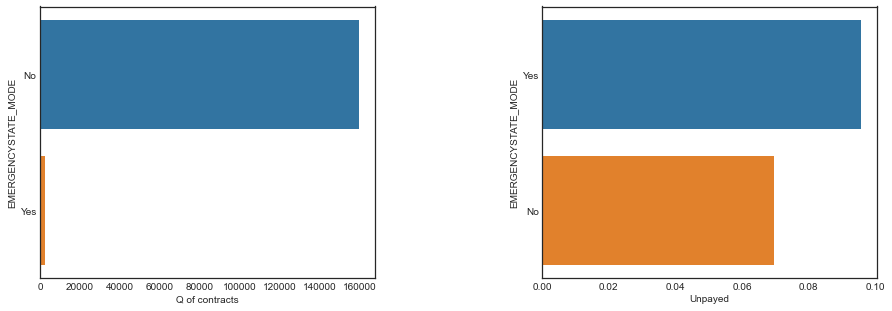

In [24]:
cat_cols = app_train.select_dtypes(include='object').columns.tolist()
for col in cat_cols:
    plt_cat_hbars(app_train, col)

Much graphics, such info.

Can we get more info from the amount of children and car age if we transform them into categories?

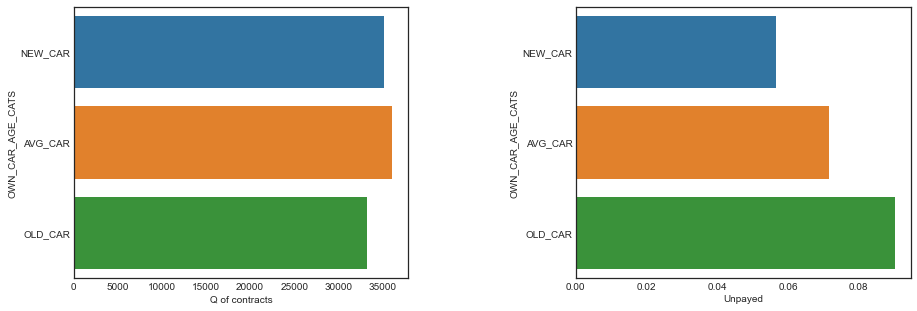

In [25]:
app_train['OWN_CAR_AGE_CATS'] = pd.qcut(app_train['OWN_CAR_AGE'], 3, labels=['NEW_CAR', 'AVG_CAR', 'OLD_CAR'])
app_test['OWN_CAR_AGE_CATS'] = pd.qcut(app_test['OWN_CAR_AGE'], 3, labels=['NEW_CAR', 'AVG_CAR', 'OLD_CAR'])
total_applications['OWN_CAR_AGE_CATS'] = pd.qcut(total_applications['OWN_CAR_AGE'], 3, labels=['NEW_CAR', 'AVG_CAR', 'OLD_CAR'])
plt_cat_hbars(app_train, 'OWN_CAR_AGE_CATS')

Somehow a bit classit but... the older the car, less are the available resources a client might have. On the other hand, the ratios aren't that much appart.

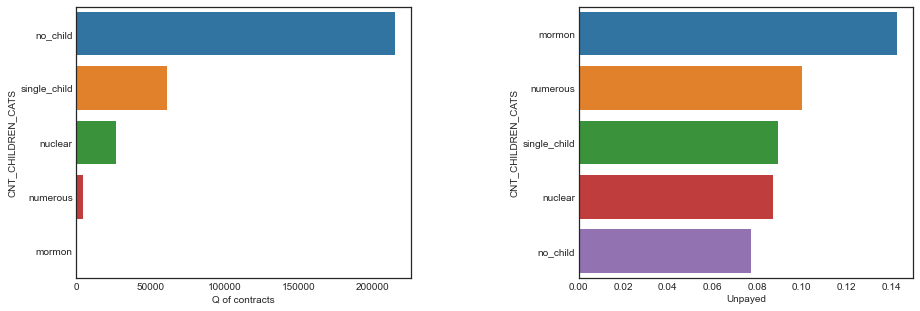

In [26]:
conditions = [
    (app_train['CNT_CHILDREN'] == 0),
    (app_train['CNT_CHILDREN'] == 1),
    (app_train['CNT_CHILDREN'] > 1) & (app_train['CNT_CHILDREN'] < 3),
    (app_train['CNT_CHILDREN'] >= 3) & (app_train['CNT_CHILDREN'] < 7),
    (app_train['CNT_CHILDREN'] >= 7)
    ]

test_cond = [
    (app_test['CNT_CHILDREN'] == 0),
    (app_test['CNT_CHILDREN'] == 1),
    (app_test['CNT_CHILDREN'] > 1) & (app_test['CNT_CHILDREN'] < 3),
    (app_test['CNT_CHILDREN'] >= 3) & (app_test['CNT_CHILDREN'] < 7),
    (app_test['CNT_CHILDREN'] >= 7)
    ]

total_cond = [
    (total_applications['CNT_CHILDREN'] == 0),
    (total_applications['CNT_CHILDREN'] == 1),
    (total_applications['CNT_CHILDREN'] > 1) & (total_applications['CNT_CHILDREN'] < 3),
    (total_applications['CNT_CHILDREN'] >= 3) & (total_applications['CNT_CHILDREN'] < 7),
    (total_applications['CNT_CHILDREN'] >= 7)
    ]

values = ['no_child', 'single_child', 'nuclear', 'numerous', 'mormon']
app_train['CNT_CHILDREN_CATS'] = np.select(conditions, values)
app_test['CNT_CHILDREN_CATS'] = np.select(test_cond, values)
total_applications['CNT_CHILDREN_CATS'] = np.select(total_cond, values)

plt_cat_hbars(app_train, 'CNT_CHILDREN_CATS')

The older the car or the more children, more likely is the client to not repay the loan. Seems logical, less expenses the more likely to honor a debt since the client has more available income.

### Previous_application

In [27]:
df_previous_application = pd.read_csv('files/previous_application.csv')
head_shape(df_previous_application, 'df_previous_application')

df_previous_application shape: (1670214, 37)


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0


<AxesSubplot:xlabel='NAME_CONTRACT_TYPE'>

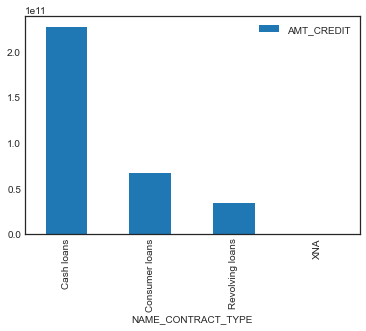

In [28]:
amt_previous = df_previous_application.groupby(['NAME_CONTRACT_TYPE'])['AMT_CREDIT'].sum().reset_index()
amt_previous.plot.bar(x='NAME_CONTRACT_TYPE', y='AMT_CREDIT')

  0%|                                                                                          | 0/316 [00:00<…


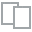
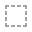
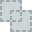
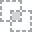
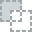
...
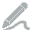
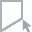
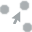
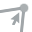
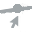

In [29]:
plot(df_previous_application, "AMT_CREDIT", "NAME_CONTRACT_TYPE")

In [30]:
print('XNA:', df_previous_application[df_previous_application['NAME_CONTRACT_TYPE'] == 'XNA'].shape[0])
print('Consumer loans:', df_previous_application[df_previous_application['NAME_CONTRACT_TYPE'] == 'Consumer loans'].shape[0])

XNA: 346
Consumer loans: 729151


New contract types in **previous_application.csv**: **Consumer loans** and **XNA**. **Consumer loans**, in average, are near the amount of **Cash loans** while **XNA** is zero. Therefore, we can consider the **Consumer loans** as part of **Cash loans** and we'll drope **XNA** loans.

In [31]:
df_previous_application = df_previous_application[df_previous_application['NAME_CONTRACT_TYPE'] != 'XNA']
df_previous_application['N_CREDIT_TYPE'] = df_previous_application['NAME_CONTRACT_TYPE'].apply(lambda x: x if x == 'Revolving loans' else 'Cash loans')

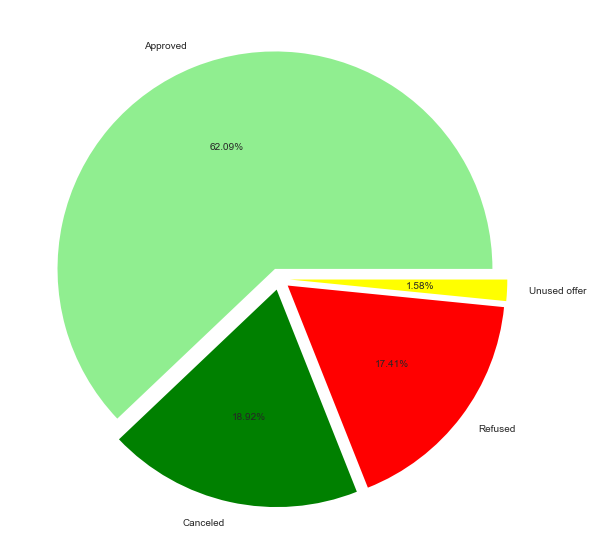

In [32]:
contract_status_previous = pd.DataFrame(df_previous_application['NAME_CONTRACT_STATUS'].value_counts())

plt.figure(figsize=(10, 10))
plt.style.use('seaborn-white')
plt.pie(contract_status_previous['NAME_CONTRACT_STATUS'],
        explode=(0.05, 0.05, 0.05, 0.05),
        colors=('lightgreen', 'green', 'red', 'yellow'),
        labels=contract_status_previous.index,
        autopct='%1.2f%%',)
plt.show()

In [33]:
contract_status_previous

,NAME_CONTRACT_STATUS
Approved,1036781
Canceled,316004
Refused,290647
Unused offer,26436


In [34]:
df_previous_application['N_FLAG_REJECTED'] = df_previous_application['NAME_CONTRACT_STATUS'].apply(lambda x: 1 if x == 'Refused' else 0)

<AxesSubplot:ylabel='Frequency'>

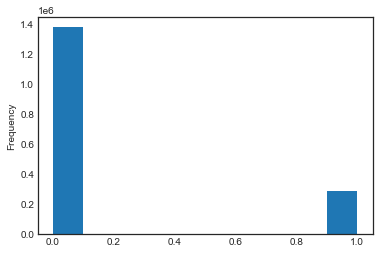

In [35]:
df_previous_application['N_FLAG_REJECTED'].astype(int).plot.hist()

<AxesSubplot:>

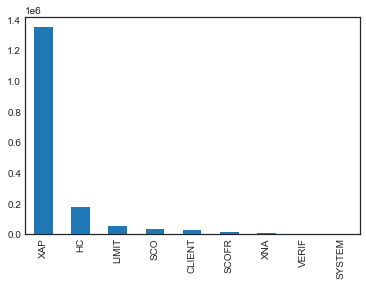

In [36]:
df_previous_application['CODE_REJECT_REASON'].value_counts().plot(kind='bar')

<AxesSubplot:>

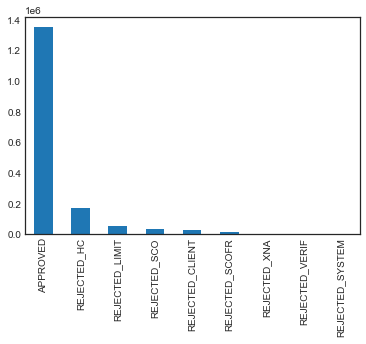

In [37]:
df_previous_application['N_CODE_REJECT_REASON'] = 'REJECTED_' + df_previous_application['CODE_REJECT_REASON'].astype(str)
df_previous_application['N_CONTRACT_STATUS'] = df_previous_application['N_CODE_REJECT_REASON'].apply(lambda x: x if x != 'REJECTED_XAP' else 'APPROVED')
df_previous_application['N_CONTRACT_STATUS'].value_counts().plot(kind='bar')
# plot(df_previous_application, 'N_CONTRACT_STATUS')

In [38]:
previous_status_count = df_previous_application.groupby(['SK_ID_CURR', 'N_CONTRACT_STATUS']).size().unstack(fill_value=0)
previous_status_count.columns = ['N_PREV_' + str(col) for col in previous_status_count.columns]
total_applications = total_applications.merge(previous_status_count, on='SK_ID_CURR', how='left') #add previous loans to total dataset
app_train = app_train.merge(previous_status_count, on='SK_ID_CURR', how='left') #add previous loans to train dataset
app_test = app_test.merge(previous_status_count, on='SK_ID_CURR', how='left') #add previous loans to test dataset

In [39]:
previous_rejected = df_previous_application[df_previous_application['N_FLAG_REJECTED'] == 1] #previous rejected applications
previous_last_loan_rejection = previous_rejected.groupby(['SK_ID_CURR', 'N_FLAG_REJECTED'],
                                                         as_index=False).agg({'DAYS_DECISION': ['max']})
previous_last_loan_rejection.columns = ['SK_ID_CURR',
                                        'N_FLAG_REJECTED',
                                        'N_LAST_REJECTION_RECENCY']

previous_last_loan_rejection = previous_last_loan_rejection.sort_values(by='N_LAST_REJECTION_RECENCY', ascending=False)
previous_last_loan_rejection = previous_last_loan_rejection.drop_duplicates(subset='SK_ID_CURR', keep='first') #keep last reject
previous_last_loan_rejection['N_ADJ_REJECT_RECENCY_INDEX'] = (1-(previous_last_loan_rejection['N_LAST_REJECTION_RECENCY']/previous_rejected['DAYS_DECISION'].min()))*previous_last_loan_rejection['N_FLAG_REJECTED']
previous_last_loan_rejection.drop(columns=['N_LAST_REJECTION_RECENCY'], inplace=True)

total_applications = total_applications.merge(previous_last_loan_rejection, on='SK_ID_CURR', how='left') #add to total dataset
total_applications['N_ADJ_REJECT_RECENCY_INDEX'] = total_applications['N_ADJ_REJECT_RECENCY_INDEX'].fillna(0)
total_applications['N_FLAG_REJECTED'] = total_applications['N_FLAG_REJECTED'].fillna(0)

app_train = app_train.merge(previous_last_loan_rejection, on='SK_ID_CURR', how='left') #add to train dataset
app_train['N_ADJ_REJECT_RECENCY_INDEX'] = app_train['N_ADJ_REJECT_RECENCY_INDEX'].fillna(0)
app_train['N_FLAG_REJECTED'] = app_train['N_FLAG_REJECTED'].fillna(0)

app_test = app_test.merge(previous_last_loan_rejection, on='SK_ID_CURR', how='left') #add to test dataset
app_test['N_ADJ_REJECT_RECENCY_INDEX'] = app_test['N_ADJ_REJECT_RECENCY_INDEX'].fillna(0)
app_test['N_FLAG_REJECTED'] = app_test['N_FLAG_REJECTED'].fillna(0)

previous_last_loan_decision = df_previous_application.groupby(['SK_ID_CURR', 'N_CONTRACT_STATUS'], 
                                                              as_index=False).agg({'DAYS_DECISION': ['max']})
previous_last_loan_decision.columns = ['SK_ID_CURR',
                                       'N_CONTRACT_STATUS',
                                       'N_PREV_LAST_APPLICATION']
previous_last_loan_decision = previous_last_loan_decision.sort_values(by='N_PREV_LAST_APPLICATION', ascending=False)

previous_last_loan_decision = previous_last_loan_decision.drop_duplicates(subset='SK_ID_CURR', keep='first')
previous_last_loan_decision = previous_last_loan_decision.rename(columns={'N_CONTRACT_STATUS': 'N_PREV_LAST_DECISION'})

total_applications = total_applications.merge(previous_last_loan_decision, on='SK_ID_CURR', how='left') #add to total dataset
app_train = app_train.merge(previous_last_loan_decision, on='SK_ID_CURR', how='left') #add to train dataset
app_test = app_test.merge(previous_last_loan_decision, on='SK_ID_CURR', how='left') #add to test dataset

In [40]:
total_applications['N_PREV_LAST_DECISION'] = total_applications['N_PREV_LAST_DECISION'].fillna('NONE')
total_applications['N_PREV_LAST_APPLICATION'] = total_applications['N_PREV_LAST_APPLICATION'].fillna(previous_rejected['DAYS_DECISION'].min())

app_train['N_PREV_LAST_DECISION'] = app_train['N_PREV_LAST_DECISION'].fillna('NONE')
app_train['N_PREV_LAST_APPLICATION'] = app_train['N_PREV_LAST_APPLICATION'].fillna(previous_rejected['DAYS_DECISION'].min())

app_test['N_PREV_LAST_DECISION'] = app_test['N_PREV_LAST_DECISION'].fillna('NONE')
app_test['N_PREV_LAST_APPLICATION'] = app_test['N_PREV_LAST_APPLICATION'].fillna(previous_rejected['DAYS_DECISION'].min())

previous_loan_counts = df_previous_application.groupby('SK_ID_CURR', as_index=False)['SK_ID_PREV'].count().rename(columns={'SK_ID_PREV': 'N_PREV_LOANS'})

total_applications = total_applications.merge(previous_loan_counts, on='SK_ID_CURR', how='left')
app_train = app_train.merge(previous_loan_counts, on='SK_ID_CURR', how='left')
app_test = app_test.merge(previous_loan_counts, on='SK_ID_CURR', how='left')

# plot(total_applications, 'N_PREV_LOANS')

<AxesSubplot:ylabel='Frequency'>

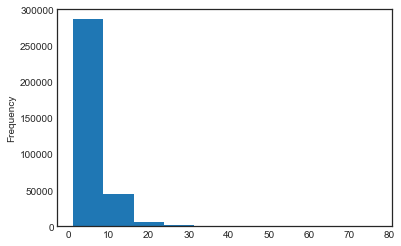

In [41]:
total_applications['N_PREV_LOANS'].plot.hist()

In [42]:
total_applications['N_REJECT_RATIO'] = 1 - (total_applications['N_PREV_APPROVED']) / total_applications['N_PREV_LOANS']
total_applications['N_REJECT_RATE'] = total_applications['N_REJECT_RATIO'].fillna(0)

app_train['N_REJECT_RATIO'] = 1 - (app_train['N_PREV_APPROVED']) / app_train['N_PREV_LOANS']
app_train['N_REJECT_RATE'] = app_train['N_REJECT_RATIO'].fillna(0)

app_test['N_REJECT_RATIO'] = 1 - (app_test['N_PREV_APPROVED']) / app_test['N_PREV_LOANS']
app_test['N_REJECT_RATE'] = app_test['N_REJECT_RATIO'].fillna(0)

# plot(total_applications['N_REJECT_RATIO'])

## Bureau & bureau_balance & credit_card_balance & POS_CASH_balance


In [43]:
df_bureau_balance = pd.read_csv('files/bureau_balance.csv')
head_shape(df_bureau_balance, 'df_bureau_balance')

df_bureau_balance shape: (27299925, 3)


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C


In [44]:
df_credit_card_balance = pd.read_csv('files/credit_card_balance.csv')
head_shape(df_credit_card_balance, 'df_credit_card_balance')

df_credit_card_balance shape: (3840312, 23)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.00,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.08,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0


In [45]:
df_pos_cash_balance = pd.read_csv('files/POS_CASH_balance.csv')
head_shape(df_pos_cash_balance, 'df_pos_cash_balance')

df_pos_cash_balance shape: (10001358, 8)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0


From **HomeCredit_columns_description.csv** we get that the column **STATUS** means:

- C means closed
- X means status unknown
- 0 means no DPD
- 1 means maximal did during month between 1-30
- 2 means DPD 31-60
- 3 means DPD 61-90
- 4 means DPD 91-120
- 5 means DPD 120+ or sold or written off

We also get that **MONTHS_BALANCE** means:
>Month of balance relative to application date (-1 means the freshest balance date),time only relative to the application

<AxesSubplot:>

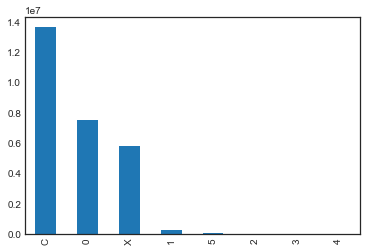

In [46]:
df_bureau_balance['STATUS'].value_counts().plot(kind='bar')

<AxesSubplot:>

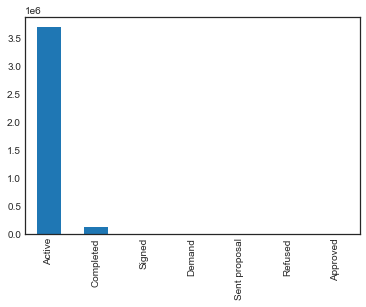

In [47]:
df_credit_card_balance['NAME_CONTRACT_STATUS'].value_counts().plot(kind='bar')

<AxesSubplot:>

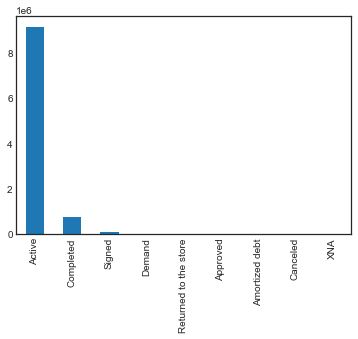

In [48]:
df_pos_cash_balance['NAME_CONTRACT_STATUS'].value_counts().plot(kind='bar')

<AxesSubplot:>

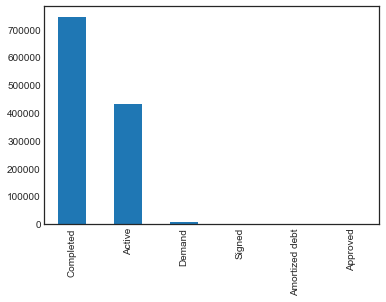

In [49]:
df_pos_cash_balance[df_pos_cash_balance['CNT_INSTALMENT_FUTURE'] == 0]['NAME_CONTRACT_STATUS'].value_counts().plot(kind='bar')

In [50]:
df_bureau = pd.read_csv('files/bureau.csv')
head_shape(df_bureau, 'df_bureau')

df_bureau shape: (1716428, 17)


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN


  0%|                                                                                          | 0/114 [00:00<…


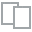
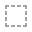
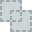
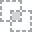
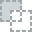
...
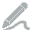
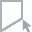
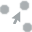
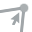
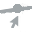

In [51]:
plot(df_bureau, "AMT_CREDIT_SUM", 'CREDIT_TYPE')

**CREDIT_TYPE** brings into the table a lot of new contract types. To keep it simple we need to stick to the fewest contract types as possible.

So, are there any active loans with no future installments? What do we do with them?

In [52]:
bureau_balance_dpd_only = df_bureau_balance[(df_bureau_balance['STATUS'] != '0') & 
                                            (df_bureau_balance['STATUS'] != 'C') & 
                                            (df_bureau_balance['STATUS'] != 'X')]
bureau_balance_dpd_only_agg = bureau_balance_dpd_only.groupby('SK_ID_BUREAU', as_index=False).agg({'MONTHS_BALANCE': ['min']})
bureau_balance_dpd_only_agg.columns = ['SK_ID_BUREAU', 'N_BUREAU_EARLIEST_DPD']

#Get only the Closed (C) lines: Age at time of closing
bureau_balance_closed_only = df_bureau_balance[df_bureau_balance['STATUS'] == 'C']
bureau_balance_closed_only_agg = bureau_balance_closed_only.groupby('SK_ID_BUREAU', as_index=False).agg({'STATUS': ['count']})
bureau_balance_closed_only_agg.columns = ['SK_ID_BUREAU', 'N_BUREAU_AGE_CLOSED']

#Get DPD 0-5 to calculate the durations
bureau_balance_dur = df_bureau_balance[(df_bureau_balance['STATUS'] != 'C') & 
                                       (df_bureau_balance['STATUS'] != 'X')]
bureau_balance_dur_agg = bureau_balance_dur.groupby('SK_ID_BUREAU', as_index=False).agg({'MONTHS_BALANCE': ['min']})
bureau_balance_dur_agg.columns = ['SK_ID_BUREAU', 'N_BUREAU_START']

#Merge
df_bureau = df_bureau.merge(bureau_balance_dpd_only_agg, how='left', on='SK_ID_BUREAU')
df_bureau = df_bureau.merge(bureau_balance_closed_only_agg, how='left', on='SK_ID_BUREAU')
df_bureau = df_bureau.merge(bureau_balance_dur_agg, how='left', on='SK_ID_BUREAU')

del bureau_balance_dpd_only_agg, bureau_balance_closed_only_agg, bureau_balance_dur_agg

df_bureau['N_BUREAU_EARLIEST_DPD_RATIO'] = df_bureau['N_BUREAU_EARLIEST_DPD'] / df_bureau['N_BUREAU_START']
df_bureau.drop(columns=['N_BUREAU_EARLIEST_DPD'], inplace=True)
df_bureau['N_BUREAU_EARLIEST_DPD_RATIO'].fillna(0, inplace=True)
df_bureau['BUREAU_CREDIT_DEBT_RATIO'] = df_bureau['AMT_CREDIT_SUM_DEBT'] / (1 + df_bureau['AMT_CREDIT_SUM'])

In [53]:
#Previous loans count from bureau.csv
df_bureau['CREDIT_TYPE'] = df_bureau['CREDIT_TYPE'].apply(lambda x: x if x == 'Credit card' else 'Cash loans')

bureau_loan_counts = df_bureau.groupby('SK_ID_CURR', as_index=False)['SK_ID_BUREAU'].count().rename(columns={'SK_ID_BUREAU': 'N_BUREAU_LOANS'})

total_applications = total_applications.merge(bureau_loan_counts, on='SK_ID_CURR', how='left')
app_train = app_train.merge(bureau_loan_counts, on='SK_ID_CURR', how='left')
app_test = app_test.merge(bureau_loan_counts, on='SK_ID_CURR', how='left')

# plot(total_applications, 'N_BUREAU_LOANS')

In [54]:
bureau_last_loan_application = df_bureau.groupby(['SK_ID_CURR'], as_index=False).agg({'DAYS_CREDIT': ['max']})
bureau_last_loan_application.columns = ['SK_ID_CURR', 'N_BUREAU_LAST_APPLICATION']
bureau_last_loan_application = bureau_last_loan_application.sort_values(by='N_BUREAU_LAST_APPLICATION', ascending=False)

total_applications = total_applications.merge(bureau_last_loan_application, on='SK_ID_CURR', how='left')
total_applications['N_BUREAU_LAST_APPLICATION'] = total_applications['N_BUREAU_LAST_APPLICATION'].fillna(bureau_last_loan_application['N_BUREAU_LAST_APPLICATION'].min())
total_applications['N_BUREAU_LOANS'] = total_applications['N_BUREAU_LOANS'].fillna(0)
total_applications['N_PREV_LOANS'] = total_applications['N_PREV_LOANS'].fillna(0)
total_applications['N_TOTAL_LOANS'] = total_applications['N_BUREAU_LOANS'] + total_applications['N_PREV_LOANS']

app_train = app_train.merge(bureau_last_loan_application, on='SK_ID_CURR', how='left')
app_train['N_BUREAU_LAST_APPLICATION'] = app_train['N_BUREAU_LAST_APPLICATION'].fillna(bureau_last_loan_application['N_BUREAU_LAST_APPLICATION'].min())
app_train['N_BUREAU_LOANS'] = app_train['N_BUREAU_LOANS'].fillna(0)
app_train['N_PREV_LOANS'] = app_train['N_PREV_LOANS'].fillna(0)
app_train['N_TOTAL_LOANS'] = app_train['N_BUREAU_LOANS'] + app_train['N_PREV_LOANS']

app_test = app_test.merge(bureau_last_loan_application, on='SK_ID_CURR', how='left')
app_test['N_BUREAU_LAST_APPLICATION'] = app_test['N_BUREAU_LAST_APPLICATION'].fillna(bureau_last_loan_application['N_BUREAU_LAST_APPLICATION'].min())
app_test['N_BUREAU_LOANS'] = app_test['N_BUREAU_LOANS'].fillna(0)
app_test['N_PREV_LOANS'] = app_test['N_PREV_LOANS'].fillna(0)
app_test['N_TOTAL_LOANS'] = app_test['N_BUREAU_LOANS'] + app_test['N_PREV_LOANS']

# plot(total_applications['N_TOTAL_LOANS'])

In [55]:
print('Clients with previous loans in general: {}%'.format(str(round(100-100*total_applications[total_applications['N_BUREAU_LOANS'] == 0].shape[0]/total_applications.shape[0], 2))))
print('Clients with previous loans from the company: {}%'.format(str(round(100-100*total_applications[total_applications['N_PREV_LOANS'] == 0].shape[0]/total_applications.shape[0], 2))))
print('')
both_loans = total_applications[(total_applications['N_PREV_LOANS']>0) & (total_applications['N_BUREAU_LOANS']>0)].shape[0]
print('Clients with both types of loans: {}%'.format(str(round(100*both_loans/total_applications.shape[0], 2))))
print('Clients with no previous loans at all: {}%'.format(str(round(100*total_applications[total_applications['N_TOTAL_LOANS'] == 0].shape[0]/total_applications.shape[0], 2))))
print('')
print('Clients with any kind of loans, Test dataset: {}'.format(app_test[app_test['N_TOTAL_LOANS'] == 0].shape[0]))
print('Clients with any kind of loans, Test dataset: {}'.format(app_train[app_train['N_TOTAL_LOANS'] == 0].shape[0]))
print('')
print('Unknown applicants, Test dataset: {}%'.format(str(round(100*app_test[app_test['N_TOTAL_LOANS'] == 0].shape[0] / app_test.shape[0], 2))))
print('Unknown applicants, Train dataset: {}%'.format(str(round(100*app_train[app_train['N_TOTAL_LOANS'] == 0].shape[0] / app_train.shape[0], 2))))

Clients with previous loans in general: 85.84%
Clients with previous loans from the company: 95.12%

Clients with both types of loans: 81.71%
Clients with no previous loans at all: 0.75%

Clients with any kind of loans, Test dataset: 208
Clients with any kind of loans, Test dataset: 2470

Unknown applicants, Test dataset: 0.43%
Unknown applicants, Train dataset: 0.8%


In [56]:
active_no_f_inst = df_pos_cash_balance[df_pos_cash_balance['CNT_INSTALMENT_FUTURE'] == 0]
active_no_f_inst = active_no_f_inst[active_no_f_inst['NAME_CONTRACT_STATUS'] == 'Active']
active_no_f_inst.sample(2)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
3134352,2386718,106255,-73,7.0,0.0,Active,0,0
8284121,1682187,173998,-80,4.0,0.0,Active,0,0


In [57]:
print('Failure ratio : {}%'.format(str(100*round(df_pos_cash_balance[df_pos_cash_balance['SK_DPD_DEF'] > 0].shape[0]/df_pos_cash_balance.shape[0], 2))))

Failure ratio : 1.0%


**SK_DPD_DEF** contains ~1% of monthly failures. According to the documentation **SK_DPD_DEF** applies a tolerance for the low loan amounts (by ignoring them) to the **SK_DPD** feature.

Once again, the **df_pos_cash** dataset seems a bit overly complicated to easly grasp its behavior.

In [58]:
df_pos_cash_balance.dropna(inplace=True)
df_pos_cash_balance = df_pos_cash_balance[df_pos_cash_balance['NAME_CONTRACT_STATUS'] == 'Active'] #Let's only get Active loans
df_pos_cash_balance.drop(columns=['NAME_CONTRACT_STATUS'], inplace=True) #We don't need this column anymore

dpd_count = df_pos_cash_balance[df_pos_cash_balance['SK_DPD'] != 0].shape[0]
dpd_def_count = df_pos_cash_balance[df_pos_cash_balance['SK_DPD_DEF'] != 0].shape[0]
print('Tolerance ratio: {}%'.format(100*round(dpd_def_count/dpd_count,4)))

Tolerance ratio: 39.37%


~40% of overdue loans are tolerated due to their low amount (based on the descriptions of each feature)

In [59]:
df_credit_card_balance = df_credit_card_balance[df_credit_card_balance['NAME_CONTRACT_STATUS'] == 'Active'] #Let's only get Active loans
df_credit_card_balance.drop(columns=['NAME_CONTRACT_STATUS'], inplace=True)
df_credit_card_balance.fillna(0, inplace=True)

dpd_count = df_credit_card_balance[df_credit_card_balance['SK_DPD'] != 0].shape[0]
dpd_def_count = df_credit_card_balance[df_credit_card_balance['SK_DPD_DEF'] != 0].shape[0]
print('Tolerance ratio: {}%'.format(100*round(dpd_def_count/dpd_count,4)))

Tolerance ratio: 57.89%


~58% of overdue loans are tolerated due to their low amount (based on the descriptions of each feature). It's higher value than for POS_CASH_balance.

## Installments_payments

In [60]:
df_installments_payments = pd.read_csv('files/installments_payments.csv')
head_shape(df_installments_payments, 'df_installments_payments')

df_installments_payments shape: (13605401, 8)


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525


In [61]:
df_installments_payments.dropna(inplace=True)
print('Oldest installment is {} years old.'.format(round(-df_installments_payments['DAYS_INSTALMENT'].min()/365))) #since the values are in negative, the min is in reality the max

Oldest installment is 8 years old.


> DAYS_INSTALMENT, When the installment of previous credit was supposed to be paid (relative to application date of current loan), time only relative to the application

> DAYS_ENTRY_PAYMENT, When was the installments of previous credit paid actually (relative to application date of current loan), time only relative to the application

In [62]:
df_installments_payments['AMOUNT_INSTALMENT_OVERDUE'] = df_installments_payments['AMT_INSTALMENT'] - df_installments_payments['AMT_PAYMENT']
df_installments_payments['AMOUNT_INSTALMENT_OVERDUE'] = np.where(df_installments_payments['AMOUNT_INSTALMENT_OVERDUE'] > 0, df_installments_payments['AMOUNT_INSTALMENT_OVERDUE'], 0)

df_installments_payments['AMOUNT_INSTALMENT_PREPAYED'] = df_installments_payments['AMT_PAYMENT'] - df_installments_payments['AMT_INSTALMENT']
df_installments_payments['AMOUNT_INSTALMENT_PREPAYED'] = np.where(df_installments_payments['AMOUNT_INSTALMENT_PREPAYED'] > 0, df_installments_payments['AMOUNT_INSTALMENT_PREPAYED'], 0)

df_installments_payments['OVERDUE_RATIO'] = df_installments_payments['AMOUNT_INSTALMENT_OVERDUE'] / (1 + df_installments_payments['AMT_INSTALMENT'])

df_installments_payments['N_INSTALMENTS_DPD'] = df_installments_payments['DAYS_ENTRY_PAYMENT'] - df_installments_payments['DAYS_INSTALMENT'] #DPD: Days Past Due
df_installments_payments['N_INSTALMENTS_DPD'] = np.where(df_installments_payments['N_INSTALMENTS_DPD'] > 0, df_installments_payments['N_INSTALMENTS_DPD'], 0)

df_installments_payments['N_INSTALMENTS_DBD'] = df_installments_payments['DAYS_INSTALMENT'] - df_installments_payments['DAYS_ENTRY_PAYMENT'] #DBD: Days Before Due
df_installments_payments['N_INSTALMENTS_DBD'] = np.where(df_installments_payments['N_INSTALMENTS_DBD'] > 0, df_installments_payments['N_INSTALMENTS_DBD'], 0)

bins_cond = [(df_installments_payments['N_INSTALMENTS_DPD'] == 0), #0
             (df_installments_payments['N_INSTALMENTS_DPD'] > 0) & (df_installments_payments['N_INSTALMENTS_DPD'] <= 30), #1
             (df_installments_payments['N_INSTALMENTS_DPD'] > 30) & (df_installments_payments['N_INSTALMENTS_DPD'] <= 60), #2
             (df_installments_payments['N_INSTALMENTS_DPD'] > 60) & (df_installments_payments['N_INSTALMENTS_DPD'] <= 90), #3
             (df_installments_payments['N_INSTALMENTS_DPD'] > 90) & (df_installments_payments['N_INSTALMENTS_DPD'] <=120), #4
             (df_installments_payments['N_INSTALMENTS_DPD'] > 120) #5
            ]
bins_tags = ['0', '1', '2', '3', '4', '5']
df_installments_payments['INSTALMENTS_STATUS'] = np.select(bins_cond, bins_tags) #respecting the logic in bureau_balance['STATUS']

df_installments_payments['INSTALMENTS_STATUS'] = df_installments_payments['INSTALMENTS_STATUS'].astype('object')
df_installments_payments['INSTALMENTS_STATUS'].value_counts()

0    12455827
1    1108027 
2    22477   
5    10802   
3    3427    
4    1936    
Name: INSTALMENTS_STATUS, dtype: int64

Clients with with 0 DPD (Days Past Due) installments might have a risk of unpayment but those with any other value than 0 are already in the failure zone.

Let's focus on those clients where the DPD>0 for a while. By finding their earlies overdue we can see the clients with a higher failure risk since the oldest their overdue is the more likely their are to default on the loan. On hte other hand, if a client has no DPD we won't be able to use this metric... So we need something else.

>NUM_INSTALMENT_VERSION, Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some parameter of payment calendar has changed,

>NUM_INSTALMENT_NUMBER, On which installment we observe payment,

>DAYS_INSTALMENT, When the installment of previous credit was supposed to be paid (relative to application date of current loan), time only relative to the application

In [63]:
installments_dpd = df_installments_payments[df_installments_payments['INSTALMENTS_STATUS'] != '0'] #Clients with overdues
installments_dpd_agg = installments_dpd.groupby('SK_ID_PREV', as_index=False).agg({'NUM_INSTALMENT_NUMBER': ['min']}) #Find earlies overdue per client
installments_dpd_agg.columns = ['SK_ID_PREV', 'EARLIEST_OVERDUE']

installments_agg = df_installments_payments.groupby('SK_ID_PREV', as_index=False).agg(
    {'NUM_INSTALMENT_VERSION': ['max'],
     'NUM_INSTALMENT_NUMBER': ['max'],
     'DAYS_INSTALMENT': ['max'],
     'AMOUNT_INSTALMENT_OVERDUE': ['max']})
installments_agg.columns=['SK_ID_PREV', 
                          'TOTAL_INSTALMENT_VERSION', 
                          'TOTAL_INSTALMENT_NUMBER',
                          'LAST_DAY_OVERDUE',
                          'MAX_INSTALMENT_OVERDUE']

installments_agg = installments_agg.merge(installments_dpd_agg, how='left', on='SK_ID_PREV')

installments_agg['EARLIEST_INSTALMENT_RATIO'] = 1 - installments_agg['EARLIEST_OVERDUE'] / installments_agg['TOTAL_INSTALMENT_NUMBER']
installments_agg['EARLIEST_INSTALMENT_RATIO'].fillna(0, inplace=True)
installments_agg['YEARS_OVERDUE'] = - installments_agg['LAST_DAY_OVERDUE'] / 365 #dates are negatives here too

installments_agg.drop(columns=['EARLIEST_OVERDUE'], inplace=True) #pretty empty, already checked beforehand
 
df_installments_payments = installments_agg.merge(df_installments_payments.filter(['SK_ID_CURR', 'SK_ID_PREV']), how='left', on='SK_ID_PREV') #Add SK_ID_CURR from the original dataframe
df_installments_payments.head(2)

,SK_ID_PREV,TOTAL_INSTALMENT_VERSION,TOTAL_INSTALMENT_NUMBER,LAST_DAY_OVERDUE,MAX_INSTALMENT_OVERDUE,EARLIEST_INSTALMENT_RATIO,YEARS_OVERDUE,SK_ID_CURR
0,1000001,2.0,2,-238.0,0.0,0.0,0.652055,158271
1,1000001,2.0,2,-238.0,0.0,0.0,0.652055,158271


## SK_ID_PREV

In [64]:
sk_prev_ids = df_previous_application['SK_ID_PREV'].unique()
print('Clients with previous loans applications: {}'.format(str(len(sk_prev_ids))))
print('')
ins_sk_prev_ids = df_installments_payments['SK_ID_PREV'].unique()
print('Clients with previous loans applications in installments_payments: {}'.format(str(len(ins_sk_prev_ids))))
print('Ratio of previous applications in installments_payments: {}%'.format(round(100*len(set(ins_sk_prev_ids).intersection(set(sk_prev_ids)))/len(sk_prev_ids), 2)))
print('Ratio of installements without previous loans applications reference: {}%'.format(round(100*(len(ins_sk_prev_ids)-len(set(ins_sk_prev_ids).intersection(set(sk_prev_ids))))/len(ins_sk_prev_ids), 2)))
print('')
credit_sk_prev_ids = df_pos_cash_balance['SK_ID_PREV'].unique()
print('Clients with previous loans applications in POS_CASH_balance: {}'.format(str(len(credit_sk_prev_ids))))
print('Ratio of previous applications in POS_CASH_balance: {}%'.format(round(100*len(set(credit_sk_prev_ids).intersection(set(sk_prev_ids)))/len(sk_prev_ids), 2)))
print('Ratio of POS_CASH_balance without previous loans applications reference: {}%'.format(round(100*(len(credit_sk_prev_ids)-len(set(credit_sk_prev_ids).intersection(set(sk_prev_ids))))/len(credit_sk_prev_ids), 2)))
print('')
card_sk_prev_ids = df_credit_card_balance['SK_ID_PREV'].unique()
print('Clients with previous loans applications in credit_card_balance: {}'.format(str(len(card_sk_prev_ids))))
print('Ratio of previous applications in credit_card_balance: {}%'.format(round(100*len(set(card_sk_prev_ids).intersection(set(sk_prev_ids)))/len(sk_prev_ids), 2)))
print('Ratio of credit_card_balance without previous loans applications reference: {}%'.format(round(100*(len(card_sk_prev_ids)-len(set(card_sk_prev_ids).intersection(set(sk_prev_ids))))/len(card_sk_prev_ids), 2)))
print('')
both_balance = list(set(credit_sk_prev_ids).intersection(set(card_sk_prev_ids)))
print('Clients in both POS_CASH_balance and credit_card_balance: {}'.format(len(both_balance)))
print('')
no_balance = len(set(card_sk_prev_ids).intersection(set(sk_prev_ids))) + len(set(credit_sk_prev_ids).intersection(set(sk_prev_ids)))
print('Ratio of clients with previous applications without any x_balance details: {}%'.format(str(round(100*(len(sk_prev_ids)-no_balance)/len(sk_prev_ids), 2))))
print('')
ins_credit_sk_prev_ids = len(list(set(ins_sk_prev_ids).intersection(set(credit_sk_prev_ids))))
print('Amount of installments_payments with POS_CASH_balance: {}'.format(ins_credit_sk_prev_ids))
print('Amount of pos_cash_balance over installements_payments: {}'.format(len(credit_sk_prev_ids)-ins_credit_sk_prev_ids))
print('')
ins_card_sk_prev_ids = len(list(set(ins_sk_prev_ids).intersection(set(card_sk_prev_ids))))
print('Amount of installments_payments with credit_card_balance: {}'.format(ins_card_sk_prev_ids))
print('Amount of credit_card_balance over installements_payments: {}'.format(len(card_sk_prev_ids) - ins_card_sk_prev_ids))

Clients with previous loans applications: 1669868

Clients with previous loans applications in installments_payments: 997674
Ratio of previous applications in installments_payments: 57.42%
Ratio of installements without previous loans applications reference: 3.89%

Clients with previous loans applications in POS_CASH_balance: 932393
Ratio of previous applications in POS_CASH_balance: 53.72%
Ratio of POS_CASH_balance without previous loans applications reference: 3.79%

Clients with previous loans applications in credit_card_balance: 104206
Ratio of previous applications in credit_card_balance: 5.56%
Ratio of credit_card_balance without previous loans applications reference: 10.91%

Clients in both POS_CASH_balance and credit_card_balance: 0

Ratio of clients with previous applications without any x_balance details: 40.72%

Amount of installments_payments with POS_CASH_balance: 923620
Amount of pos_cash_balance over installements_payments: 8773

Amount of installments_payments with cred

Even the **SK_ID_PRED** doesn't behave in a clear way. There are 40.6% of clients with a previous application but without any information in the **x_balance** datasets. The discrepancies are too big to go down throw this rabbit hole.

Apparently ~8% (3.89% + 4%) of clients don't have any previous applications and 11% of entries in card_balance dataset don't present any relation to previous applications.

# Aggregations

Two methods of encoding:
- Label encoding: No new columns, it assings a unique value (int) to each category in arbitrary order. This is problematic when there are more than 2 categories.
- One-hot encoding: Creates a new column for each unique category where each observation is set as 1 in the column for its correspoinding category and 0 if it's not the case.

## Light treatment dataset

In [65]:
bureau_bal = pd.read_csv('files/bureau_balance.csv')
print('Bureau balance shape:', bureau_bal.shape)

#Dummify
bureau_bal = pd.concat([bureau_bal, 
                        pd.get_dummies(bureau_bal.STATUS, 
                                       prefix='bureau_bal_status')], 
                       axis=1).drop('STATUS', axis=1)

#Count bureaus
bureau_counts = bureau_bal[['SK_ID_BUREAU', 'MONTHS_BALANCE']].groupby('SK_ID_BUREAU').count()
bureau_bal['bureau_count'] = bureau_bal['SK_ID_BUREAU'].map(bureau_counts['MONTHS_BALANCE'])

#Get averages by bureau
avg_bureau_bal = bureau_bal.groupby('SK_ID_BUREAU').mean()
avg_bureau_bal.columns = ['avg_bureau_' + f_ for f_ in avg_bureau_bal.columns]
del bureau_bal

print('')
bureau = pd.read_csv('files/bureau.csv')
print('Bureau shape:', bureau.shape)

#Dummify
bureau_credit_active_dum = pd.get_dummies(bureau.CREDIT_ACTIVE, prefix='ca_')
bureau_credit_currency_dum = pd.get_dummies(bureau.CREDIT_CURRENCY, prefix='cu_')
bureau_credit_type_dum = pd.get_dummies(bureau.CREDIT_TYPE, prefix='ty_')
bureau_full = pd.concat([bureau, 
                         bureau_credit_active_dum, 
                         bureau_credit_currency_dum, 
                         bureau_credit_type_dum], 
                        axis=1)

del bureau_credit_active_dum, bureau_credit_currency_dum, bureau_credit_type_dum

#Merge bureau and bureau balance
bureau_full = bureau_full.merge(avg_bureau_bal.reset_index(), 
                                how='left', 
                                on='SK_ID_BUREAU', 
                                suffixes=('', '_bur_bal'))

#Counting bureau by SK_ID_CURR
nb_bureau_per_curr = bureau_full[['SK_ID_CURR', 'SK_ID_BUREAU']].groupby('SK_ID_CURR').count()
bureau_full['SK_ID_BUREAU'] = bureau_full['SK_ID_CURR'].map(nb_bureau_per_curr['SK_ID_BUREAU'])

#Get averages
avg_bureau = bureau_full.groupby('SK_ID_CURR').mean()

del bureau, bureau_full

print('')
prev = pd.read_csv('files/previous_application.csv')
print('Previous application shape:', prev.shape)

#Dummify
prev_cat_features = [f_ for f_ in prev.columns if prev[f_].dtype == 'object']
prev_dum = pd.DataFrame()
for f_ in prev_cat_features:
    prev_dum = pd.concat([prev_dum, 
                          pd.get_dummies(prev[f_], 
                                         prefix=f_).astype(np.uint8)], 
                         axis=1)

prev = pd.concat([prev, prev_dum], axis=1)

del prev_dum

#Counting previous
nb_prev_per_curr = prev[['SK_ID_CURR', 'SK_ID_PREV']].groupby('SK_ID_CURR').count()
prev['SK_ID_PREV'] = prev['SK_ID_CURR'].map(nb_prev_per_curr['SK_ID_PREV'])

#Get averages
avg_prev = prev.groupby('SK_ID_CURR').mean()

del prev

print('')
pos = pd.read_csv('files/POS_CASH_balance.csv')
print('POS_CASH shape:', pos.shape)

#Dummify
pos = pd.concat([pos, 
                 pd.get_dummies(pos['NAME_CONTRACT_STATUS'])], 
                axis=1)

#Previous per SK_ID_CURR
nb_prevs = pos[['SK_ID_CURR', 'SK_ID_PREV']].groupby('SK_ID_CURR').count()
pos['SK_ID_PREV'] = pos['SK_ID_CURR'].map(nb_prevs['SK_ID_PREV'])

#Get averages
avg_pos = pos.groupby('SK_ID_CURR').mean()

del pos, nb_prevs

print('')
cc_bal = pd.read_csv('files/credit_card_balance.csv')
print('Credit card balance shape:', cc_bal.shape)

#Dummify
cc_bal = pd.concat([cc_bal, 
                    pd.get_dummies(cc_bal['NAME_CONTRACT_STATUS'], 
                                   prefix='cc_bal_status_')], 
                   axis=1)

#Count previous loans by SK_ID_CURR
nb_prevs = cc_bal[['SK_ID_CURR', 'SK_ID_PREV']].groupby('SK_ID_CURR').count()
cc_bal['SK_ID_PREV'] = cc_bal['SK_ID_CURR'].map(nb_prevs['SK_ID_PREV'])

#Get averages
avg_cc_bal = cc_bal.groupby('SK_ID_CURR').mean()
avg_cc_bal.columns = ['cc_bal_' + f_ for f_ in avg_cc_bal.columns]

del cc_bal, nb_prevs

print('')
inst = pd.read_csv('files/installments_payments.csv')
print('Installments payments shape:', inst.shape)

#Count previous loans by SK_ID_CURR
nb_prevs = inst[['SK_ID_CURR', 'SK_ID_PREV']].groupby('SK_ID_CURR').count()
inst['SK_ID_PREV'] = inst['SK_ID_CURR'].map(nb_prevs['SK_ID_PREV'])

#Get averages
avg_inst = inst.groupby('SK_ID_CURR').mean()
avg_inst.columns = ['inst_' + f_ for f_ in avg_inst.columns]

print('')
df_data_train = pd.read_csv('files/application_train.csv')
df_data_test = pd.read_csv('files/application_test.csv')
print('Train and Test shapes:', df_data_train.shape, df_data_test.shape)

df_data_train = df_data_train[df_data_train['CODE_GENDER'] != 'XNA']
df_data_test = df_data_test[df_data_test['CODE_GENDER'] != 'XNA']

#Save targets
y = df_data_train['TARGET']
del df_data_train['TARGET']

#Categorical features in train/test dataset
categorical_feats = [f for f in df_data_train.columns if df_data_train[f].dtype == 'object']
for f_ in categorical_feats:
    df_data_train[f_], indexer = pd.factorize(df_data_train[f_])
    df_data_test[f_] = indexer.get_indexer(df_data_test[f_])
    
df_data_train = df_data_train.merge(right=avg_bureau.reset_index(), how='left', on='SK_ID_CURR')
df_data_test = df_data_test.merge(right=avg_bureau.reset_index(), how='left', on='SK_ID_CURR')

df_data_train = df_data_train.merge(right=avg_prev.reset_index(), how='left', on='SK_ID_CURR')
df_data_test = df_data_test.merge(right=avg_prev.reset_index(), how='left', on='SK_ID_CURR')

df_data_train = df_data_train.merge(right=avg_pos.reset_index(), how='left', on='SK_ID_CURR')
df_data_test = df_data_test.merge(right=avg_pos.reset_index(), how='left', on='SK_ID_CURR')

df_data_train = df_data_train.merge(right=avg_cc_bal.reset_index(), how='left', on='SK_ID_CURR')
df_data_test = df_data_test.merge(right=avg_cc_bal.reset_index(), how='left', on='SK_ID_CURR')

df_data_train = df_data_train.merge(right=avg_inst.reset_index(), how='left', on='SK_ID_CURR')
df_data_test = df_data_test.merge(right=avg_inst.reset_index(), how='left', on='SK_ID_CURR')

del avg_bureau, avg_prev

Bureau balance shape: (27299925, 3)

Bureau shape: (1716428, 17)

Previous application shape: (1670214, 37)

POS_CASH shape: (10001358, 8)

Credit card balance shape: (3840312, 23)

Installments payments shape: (13605401, 8)

Train and Test shapes: (307511, 122) (48744, 121)


In [66]:
df_data_train.head(1)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY_y,ca__Active,ca__Bad debt,ca__Closed,ca__Sold,cu__currency 1,cu__currency 2,cu__currency 3,cu__currency 4,ty__Another type of loan,ty__Car loan,ty__Cash loan (non-earmarked),ty__Consumer credit,ty__Credit card,ty__Interbank credit,ty__Loan for business development,ty__Loan for purchase of shares (margin lending),ty__Loan for the purchase of equipment,ty__Loan for working capital replenishment,ty__Microloan,ty__Mobile operator loan,ty__Mortgage,ty__Real estate loan,ty__Unknown type of loan,avg_bureau_MONTHS_BALANCE,avg_bureau_bureau_bal_status_0,avg_bureau_bureau_bal_status_1,avg_bureau_bureau_bal_status_2,avg_bureau_bureau_bal_status_3,avg_bureau_bureau_bal_status_4,avg_bureau_bureau_bal_status_5,avg_bureau_bureau_bal_status_C,avg_bureau_bureau_bal_status_X,avg_bureau_bureau_count,SK_ID_PREV_x,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT_y,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START_y,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Consumer loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_CONTRACT_TYPE_XNA,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,FLAG_LAST_APPL_PER_CONTRACT_N,FLAG_LAST_

In [67]:
#Extraction the EXT_ features without aggregations
df_data_train_ext = df_data_train.filter(['SK_ID_CURR', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'])
df_data_test_ext = df_data_test.filter(['SK_ID_CURR', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'])
#Let's drop all EXT_ related columns, later on after the missing values treatment we will add the EXT_ features
df_data_train.drop(columns=df_data_train.columns[df_data_train.columns.str.contains('EXT_')], axis=1, inplace=True)
df_data_test.drop(columns=df_data_test.columns[df_data_test.columns.str.contains('EXT_')], axis=1, inplace=True)

## Full treatment dataset

In [68]:
app_train_agg, app_test_agg = indexer_categorical_cols(app_train, app_test)

# app_train_cat_agg = agg_categorical_cols(app_train, 'SK_ID_CURR', 'Train')
# app_train_num_agg = app_train.select_dtypes(exclude='object')
# app_train_agg = merge_dfs(app_train_cat_agg, app_train_num_agg, 'SK_ID_CURR')

# app_test_cat_agg = agg_categorical_cols(app_test, 'SK_ID_CURR', 'Test')
# app_test_num_agg = app_test.select_dtypes(exclude='object')
# app_test_agg = merge_dfs(app_test_cat_agg, app_test_num_agg, 'SK_ID_CURR')

# del app_train_cat_agg, app_train_num_agg, app_test_cat_agg, app_test_num_agg

In [69]:
app_train_agg.head(1)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,EMPLOYED_AGE_RATIO,CREDIT_INCOME_RATIO,INCOME_PER_PERSON,ANNUITY_INCOME_RATIO,CREDIT_TERM,OWN_CAR_AGE_CATS,CNT_CHILDREN_CATS,N_PREV_APPROVED,N_PREV_REJECTED_CLIENT,N_PREV_REJECTED_HC,N_PREV_REJECTED_LIMIT,N_PREV_REJECTED_SCO,N_PREV_REJECTED_SCOFR,N_PREV_REJECTED_SYSTEM,N_PREV_REJECTED_VERIF,N_PREV_REJECTED_XNA,N_FLAG_REJECTED,N_ADJ_REJECT_RECENCY_INDEX,N_PREV_LAST_DECISION,N_PREV_LAST_APPLICATION,N_PREV_LOANS,N_REJECT_RATIO,N_REJECT_RATE,N_BUREAU_LOANS,N_BUREAU_LAST_APPLICATION,N_TOTAL_LOANS
0,100002,1,0,0,0,0,0,202500.0,406597.5,24700.5,351000.0,0,0,0,0,0,0.018801,NaN,1,1,0,1,1,0,0,1.0,2,2,0,10,0,0,0,0,0,0,0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.0,0.069,0.0833,0.125,0.0369,0.0202,0.019,0.0,0.0,0.0252,0.0383,0.9722,0.6341,0.0144,0.0,0.069,0.0833,0.125,0.0377,0.022,0.0198,0.0,0.0,0.025,0.0369,0.9722,0.6243,0.0144,0.0,0.069,0.0833,0.125,0.0375,0.0205,0.0193,0.0,0.0,0,0,0.0149,0,0,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,25.920548,1.745205,9.994521,5.808219,0.067329,2.007889,202500.0,0.121978,0.060749,-1,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,-606.0,1.0,0.0,0.0,8.0,-103.0,9.0


In [70]:
app_test_agg.head(1)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,EMPLOYED_AGE_RATIO,CREDIT_INCOME_RATIO,INCOME_PER_PERSON,ANNUITY_INCOME_RATIO,CREDIT_TERM,OWN_CAR_AGE_CATS,CNT_CHILDREN_CATS,N_PREV_APPROVED,N_PREV_REJECTED_CLIENT,N_PREV_REJECTED_HC,N_PREV_REJECTED_LIMIT,N_PREV_REJECTED_SCO,N_PREV_REJECTED_SCOFR,N_PREV_REJECTED_SYSTEM,N_PREV_REJECTED_VERIF,N_PREV_REJECTED_XNA,N_FLAG_REJECTED,N_ADJ_REJECT_RECENCY_INDEX,N_PREV_LAST_DECISION,N_PREV_LAST_APPLICATION,N_PREV_LOANS,N_REJECT_RATIO,N_REJECT_RATE,N_BUREAU_LOANS,N_BUREAU_LAST_APPLICATION,N_TOTAL_LOANS
0,100001,0,1,0,0,0,135000.0,568800.0,20560.5,450000.0,0,0,1,1,0,0.01885,NaN,1,1,0,1,0,1,12,2.0,2,2,6,18,0,0,0,0,0,0,13,0.752614,0.789654,0.15952,0.066,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,-1,0,0.0392,0,0,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.715068,6.380822,14.164384,2.224658,0.121044,4.213333,67500.0,0.1523,0.036147,-1,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,-1740.0,1.0,0.0,0.0,7.0,-49.0,8.0


In [71]:
df_bureau_cat_agg = agg_categorical_cols(df_bureau, 'SK_ID_CURR', 'B')
df_bureau_num_agg = agg_numerical_cols(df_bureau, 'SK_ID_CURR', 'B')

df_bureau_agg = merge_dfs(df_bureau_cat_agg, df_bureau_num_agg, 'SK_ID_CURR')
df_bureau_agg = merge_dfs(df_bureau_agg, previous_loan_counts, 'SK_ID_CURR')

del df_bureau_cat_agg, df_bureau_num_agg

df_bureau_agg.head(1)

Aggregated categorical shape: (305811, 20)
Aggregated numerical shape: (305811, 81)
Merged shape: (305811, 101)
Merged shape: (305811, 102)


,SK_ID_CURR,CREDIT_ACTIVE_Active_sum_B,CREDIT_ACTIVE_Active_mean_B,CREDIT_ACTIVE_Bad debt_sum_B,CREDIT_ACTIVE_Bad debt_mean_B,CREDIT_ACTIVE_Closed_sum_B,CREDIT_ACTIVE_Closed_mean_B,CREDIT_ACTIVE_Sold_sum_B,CREDIT_ACTIVE_Sold_mean_B,CREDIT_CURRENCY_currency 1_sum_B,CREDIT_CURRENCY_currency 1_mean_B,CREDIT_CURRENCY_currency 2_sum_B,CREDIT_CURRENCY_currency 2_mean_B,CREDIT_CURRENCY_currency 3_sum_B,CREDIT_CURRENCY_currency 3_mean_B,CREDIT_CURRENCY_currency 4_sum_B,CREDIT_CURRENCY_currency 4_mean_B,CREDIT_TYPE_Cash loans_sum_B,CREDIT_TYPE_Cash loans_mean_B,CREDIT_TYPE_Credit card_sum_B,CREDIT_TYPE_Credit card_mean_B,DAYS_CREDIT_min_B,DAYS_CREDIT_max_B,DAYS_CREDIT_mean_B,DAYS_CREDIT_sum_B,DAYS_CREDIT_var_B,CREDIT_DAY_OVERDUE_min_B,CREDIT_DAY_OVERDUE_max_B,CREDIT_DAY_OVERDUE_mean_B,CREDIT_DAY_OVERDUE_sum_B,CREDIT_DAY_OVERDUE_var_B,DAYS_CREDIT_ENDDATE_min_B,DAYS_CREDIT_ENDDATE_max_B,DAYS_CREDIT_ENDDATE_mean_B,DAYS_CREDIT_ENDDATE_sum_B,DAYS_CREDIT_ENDDATE_var_B,DAYS_ENDDATE_FACT_min_B,DAYS_ENDDATE_FACT_max_B,DAYS_ENDDATE_FACT_mean_B,DAYS_ENDDATE_FACT_sum_B,DAYS_ENDDATE_FACT_var_B,AMT_CREDIT_MAX_OVERDUE_min_B,AMT_CREDIT_MAX_OVERDUE_max_B,AMT_CREDIT_MAX_OVERDUE_mean_B,AMT_CREDIT_MAX_OVERDUE_sum_B,AMT_CREDIT_MAX_OVERDUE_var_B,CNT_CREDIT_PROLONG_min_B,CNT_CREDIT_PROLONG_max_B,CNT_CREDIT_PROLONG_mean_B,CNT_CREDIT_PROLONG_sum_B,CNT_CREDIT_PROLONG_var_B,AMT_CREDIT_SUM_min_B,AMT_CREDIT_SUM_max_B,AMT_CREDIT_SUM_mean_B,AMT_CREDIT_SUM_sum_B,AMT_CREDIT_SUM_var_B,AMT_CREDIT_SUM_DEBT_min_B,AMT_CREDIT_SUM_DEBT_max_B,AMT_CREDIT_SUM_DEBT_mean_B,AMT_CREDIT_SUM_DEBT_sum_B,AMT_CREDIT_SUM_DEBT_var_B,AMT_CREDIT_SUM_LIMIT_min_B,AMT_CREDIT_SUM_LIMIT_max_B,AMT_CREDIT_SUM_LIMIT_mean_B,AMT_CREDIT_SUM_LIMIT_sum_B,AMT_CREDIT_SUM_LIMIT_var_B,AMT_CREDIT_SUM_OVERDUE_min_B,AMT_CREDIT_SUM_OVERDUE_max_B,AMT_CREDIT_SUM_OVERDUE_mean_B,AMT_CREDIT_SUM_OVERDUE_sum_B,AMT_CREDIT_SUM_OVERDUE_var_B,DAYS_CREDIT_UPDATE_min_B,DAYS_CREDIT_UPDATE_max_B,DAYS_CREDIT_UPDATE_mean_B,DAYS_CREDIT_UPDATE_sum_B,DAYS_CREDIT_UPDATE_var_B,AMT_ANNUITY_min_B,AMT_ANNUITY_max_B,AMT_ANNUITY_mean_B,AMT_ANNUITY_sum_B,AMT_ANNUITY_var_B,N_BUREAU_AGE_CLOSED_min_B,N_BUREAU_AGE_CLOSED_max_B,N_BUREAU_AGE_CLOSED_mean_B,N_BUREAU_AGE_CLOSED_sum_B,N_BUREAU_AGE_CLOSED_var_B,N_BUREAU_START_min_B,N_BUREAU_START_max_B,N_BUREAU_START_mean_B,N_BUREAU_START_sum_B,N_BUREAU_START_var_B,N_BUREAU_EARLIEST_DPD_RATIO_min_B,N_BUREAU_EARLIEST_DPD_RATIO_max_B,N_BUREAU_EARLIEST_DPD_RATIO_mean_B,N_BUREAU_EARLIEST_DPD_RATIO_sum_B,N_BUREAU_EARLIEST_DPD_RATIO_var_B,BUREAU_CREDIT_DEBT_RATIO_min_B,BUREAU_CREDIT_DEBT_RATIO_max_B,BUREAU_CREDIT_DEBT_RATIO_mean_B,BUREAU_CREDIT_DEBT_RATIO_sum_B,BUREAU_CREDIT_DEBT_RATIO_var_B,N_PREV_LOANS
0,100001,3,0.428571,0,0.0,4,0.571429,0,0.0,7,1.0,0,0.0,0,0.0,0,0.0,7,1.0,0,0.0,-1572,-49,-735.0,-5145,240043.666667,0,0,0.0,0,0.0,-1329.0,1778.0,82.428571,577.0,1.066798e+06,-1328.0,-544.0,-825.5,-3302.0,136219.0,NaN,NaN,NaN,0.0,NaN,0,0,0.0,0,0.0,85500.0,378000.0,207623.571429,1453365.0,1.501717e+10,0.0,373239.0,85240.928571,596686.5,1.890230e+10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-155,-6,-93.142857,-652,5960.47619,0.0,10822.5,3545.357143,24817.5,2.304583e+07,18.0,44.0,27.5,110.0,145.666667,-46.0,0.0,-21.571429,-151.0,212.952381,0.0,0.0,0.0,0.0,0.0,0.0,0.987402,0.282517,1.977617,0.159617,1.0


In [72]:
df_bureau_balance_cat_agg = agg_categorical_cols(df_bureau_balance, 'SK_ID_BUREAU', 'BB')
df_bureau_balance_num_agg = agg_numerical_cols(df_bureau_balance, 'SK_ID_BUREAU', 'BB')

df_bureau_balance_agg = merge_dfs(df_bureau_balance_cat_agg, df_bureau_balance_num_agg, 'SK_ID_BUREAU')

del df_bureau_balance_cat_agg, df_bureau_balance_num_agg

df_bureau_balance_agg.head(1)

Aggregated categorical shape: (817395, 16)
Aggregated numerical shape: (817395, 6)
Merged shape: (817395, 22)


,SK_ID_BUREAU,STATUS_0_sum_BB,STATUS_0_mean_BB,STATUS_1_sum_BB,STATUS_1_mean_BB,STATUS_2_sum_BB,STATUS_2_mean_BB,STATUS_3_sum_BB,STATUS_3_mean_BB,STATUS_4_sum_BB,STATUS_4_mean_BB,STATUS_5_sum_BB,STATUS_5_mean_BB,STATUS_C_sum_BB,STATUS_C_mean_BB,STATUS_X_sum_BB,STATUS_X_mean_BB,MONTHS_BALANCE_min_BB,MONTHS_BALANCE_max_BB,MONTHS_BALANCE_mean_BB,MONTHS_BALANCE_sum_BB,MONTHS_BALANCE_var_BB
0,5001709,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,86,0.886598,11,0.113402,-96,0,-48.0,-4656,792.166667


In [73]:
df_credit_card_balance_agg = agg_numerical_cols(df_credit_card_balance, 'SK_ID_CURR', 'CC')

df_credit_card_balance_agg.head(1)

Aggregated numerical shape: (103468, 101)


,SK_ID_CURR,MONTHS_BALANCE_min_CC,MONTHS_BALANCE_max_CC,MONTHS_BALANCE_mean_CC,MONTHS_BALANCE_sum_CC,MONTHS_BALANCE_var_CC,AMT_BALANCE_min_CC,AMT_BALANCE_max_CC,AMT_BALANCE_mean_CC,AMT_BALANCE_sum_CC,AMT_BALANCE_var_CC,AMT_CREDIT_LIMIT_ACTUAL_min_CC,AMT_CREDIT_LIMIT_ACTUAL_max_CC,AMT_CREDIT_LIMIT_ACTUAL_mean_CC,AMT_CREDIT_LIMIT_ACTUAL_sum_CC,AMT_CREDIT_LIMIT_ACTUAL_var_CC,AMT_DRAWINGS_ATM_CURRENT_min_CC,AMT_DRAWINGS_ATM_CURRENT_max_CC,AMT_DRAWINGS_ATM_CURRENT_mean_CC,AMT_DRAWINGS_ATM_CURRENT_sum_CC,AMT_DRAWINGS_ATM_CURRENT_var_CC,AMT_DRAWINGS_CURRENT_min_CC,AMT_DRAWINGS_CURRENT_max_CC,AMT_DRAWINGS_CURRENT_mean_CC,AMT_DRAWINGS_CURRENT_sum_CC,AMT_DRAWINGS_CURRENT_var_CC,AMT_DRAWINGS_OTHER_CURRENT_min_CC,AMT_DRAWINGS_OTHER_CURRENT_max_CC,AMT_DRAWINGS_OTHER_CURRENT_mean_CC,AMT_DRAWINGS_OTHER_CURRENT_sum_CC,AMT_DRAWINGS_OTHER_CURRENT_var_CC,AMT_DRAWINGS_POS_CURRENT_min_CC,AMT_DRAWINGS_POS_CURRENT_max_CC,AMT_DRAWINGS_POS_CURRENT_mean_CC,AMT_DRAWINGS_POS_CURRENT_sum_CC,AMT_DRAWINGS_POS_CURRENT_var_CC,AMT_INST_MIN_REGULARITY_min_CC,AMT_INST_MIN_REGULARITY_max_CC,AMT_INST_MIN_REGULARITY_mean_CC,AMT_INST_MIN_REGULARITY_sum_CC,AMT_INST_MIN_REGULARITY_var_CC,AMT_PAYMENT_CURRENT_min_CC,AMT_PAYMENT_CURRENT_max_CC,AMT_PAYMENT_CURRENT_mean_CC,AMT_PAYMENT_CURRENT_sum_CC,AMT_PAYMENT_CURRENT_var_CC,AMT_PAYMENT_TOTAL_CURRENT_min_CC,AMT_PAYMENT_TOTAL_CURRENT_max_CC,AMT_PAYMENT_TOTAL_CURRENT_mean_CC,AMT_PAYMENT_TOTAL_CURRENT_sum_CC,AMT_PAYMENT_TOTAL_CURRENT_var_CC,AMT_RECEIVABLE_PRINCIPAL_min_CC,AMT_RECEIVABLE_PRINCIPAL_max_CC,AMT_RECEIVABLE_PRINCIPAL_mean_CC,AMT_RECEIVABLE_PRINCIPAL_sum_CC,AMT_RECEIVABLE_PRINCIPAL_var_CC,AMT_RECIVABLE_min_CC,AMT_RECIVABLE_max_CC,AMT_RECIVABLE_mean_CC,AMT_RECIVABLE_sum_CC,AMT_RECIVABLE_var_CC,AMT_TOTAL_RECEIVABLE_min_CC,AMT_TOTAL_RECEIVABLE_max_CC,AMT_TOTAL_RECEIVABLE_mean_CC,AMT_TOTAL_RECEIVABLE_sum_CC,AMT_TOTAL_RECEIVABLE_var_CC,CNT_DRAWINGS_ATM_CURRENT_min_CC,CNT_DRAWINGS_ATM_CURRENT_max_CC,CNT_DRAWINGS_ATM_CURRENT_mean_CC,CNT_DRAWINGS_ATM_CURRENT_sum_CC,CNT_DRAWINGS_ATM_CURRENT_var_CC,CNT_DRAWINGS_CURRENT_min_CC,CNT_DRAWINGS_CURRENT_max_CC,CNT_DRAWINGS_CURRENT_mean_CC,CNT_DRAWINGS_CURRENT_sum_CC,CNT_DRAWINGS_CURRENT_var_CC,CNT_DRAWINGS_OTHER_CURRENT_min_CC,CNT_DRAWINGS_OTHER_CURRENT_max_CC,CNT_DRAWINGS_OTHER_CURRENT_mean_CC,CNT_DRAWINGS_OTHER_CURRENT_sum_CC,CNT_DRAWINGS_OTHER_CURRENT_var_CC,CNT_DRAWINGS_POS_CURRENT_min_CC,CNT_DRAWINGS_POS_CURRENT_max_CC,CNT_DRAWINGS_POS_CURRENT_mean_CC,CNT_DRAWINGS_POS_CURRENT_sum_CC,CNT_DRAWINGS_POS_CURRENT_var_CC,CNT_INSTALMENT_MATURE_CUM_min_CC,CNT_INSTALMENT_MATURE_CUM_max_CC,CNT_INSTALMENT_MATURE_CUM_mean_CC,CNT_INSTALMENT_MATURE_CUM_sum_CC,CNT_INSTALMENT_MATURE_CUM_var_CC,SK_DPD_min_CC,SK_DPD_max_CC,SK_DPD_mean_CC,SK_DPD_sum_CC,SK_DPD_var_CC,SK_DPD_DEF_min_CC,SK_DPD_DEF_max_CC,SK_DPD_DEF_mean_CC,SK_DPD_DEF_sum_CC,SK_DPD_DEF_var_CC
0,100006,-6,-1,-3.5,-21,3.5,0.0,0.0,0.0,0.0,0.0,270000,270000,270000.0,1620000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0,0.0,0,0,0.0,0,0.0


In [74]:
df_installments_payments_agg = agg_numerical_cols(df_installments_payments, 'SK_ID_CURR', 'INST')

df_installments_payments_agg.head(1)

Aggregated numerical shape: (339578, 31)


,SK_ID_CURR,TOTAL_INSTALMENT_VERSION_min_INST,TOTAL_INSTALMENT_VERSION_max_INST,TOTAL_INSTALMENT_VERSION_mean_INST,TOTAL_INSTALMENT_VERSION_sum_INST,TOTAL_INSTALMENT_VERSION_var_INST,TOTAL_INSTALMENT_NUMBER_min_INST,TOTAL_INSTALMENT_NUMBER_max_INST,TOTAL_INSTALMENT_NUMBER_mean_INST,TOTAL_INSTALMENT_NUMBER_sum_INST,TOTAL_INSTALMENT_NUMBER_var_INST,LAST_DAY_OVERDUE_min_INST,LAST_DAY_OVERDUE_max_INST,LAST_DAY_OVERDUE_mean_INST,LAST_DAY_OVERDUE_sum_INST,LAST_DAY_OVERDUE_var_INST,MAX_INSTALMENT_OVERDUE_min_INST,MAX_INSTALMENT_OVERDUE_max_INST,MAX_INSTALMENT_OVERDUE_mean_INST,MAX_INSTALMENT_OVERDUE_sum_INST,MAX_INSTALMENT_OVERDUE_var_INST,EARLIEST_INSTALMENT_RATIO_min_INST,EARLIEST_INSTALMENT_RATIO_max_INST,EARLIEST_INSTALMENT_RATIO_mean_INST,EARLIEST_INSTALMENT_RATIO_sum_INST,EARLIEST_INSTALMENT_RATIO_var_INST,YEARS_OVERDUE_min_INST,YEARS_OVERDUE_max_INST,YEARS_OVERDUE_mean_INST,YEARS_OVERDUE_sum_INST,YEARS_OVERDUE_var_INST
0,100001,1.0,2.0,1.571429,11.0,0.285714,4,4,4.0,28,0.0,-2856.0,-1619.0,-2149.142857,-15044.0,437191.142857,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.107143,0.75,0.017857,4.435616,7.824658,5.888063,41.216438,3.2816


In [75]:
df_pos_cash_balance_agg = agg_numerical_cols(df_pos_cash_balance, 'SK_ID_CURR', 'PCB')

df_pos_cash_balance_agg.head(1)

Aggregated numerical shape: (337034, 26)


,SK_ID_CURR,MONTHS_BALANCE_min_PCB,MONTHS_BALANCE_max_PCB,MONTHS_BALANCE_mean_PCB,MONTHS_BALANCE_sum_PCB,MONTHS_BALANCE_var_PCB,CNT_INSTALMENT_min_PCB,CNT_INSTALMENT_max_PCB,CNT_INSTALMENT_mean_PCB,CNT_INSTALMENT_sum_PCB,CNT_INSTALMENT_var_PCB,CNT_INSTALMENT_FUTURE_min_PCB,CNT_INSTALMENT_FUTURE_max_PCB,CNT_INSTALMENT_FUTURE_mean_PCB,CNT_INSTALMENT_FUTURE_sum_PCB,CNT_INSTALMENT_FUTURE_var_PCB,SK_DPD_min_PCB,SK_DPD_max_PCB,SK_DPD_mean_PCB,SK_DPD_sum_PCB,SK_DPD_var_PCB,SK_DPD_DEF_min_PCB,SK_DPD_DEF_max_PCB,SK_DPD_DEF_mean_PCB,SK_DPD_DEF_sum_PCB,SK_DPD_DEF_var_PCB
0,100001,-96,-54,-72.428571,-507,446.952381,4.0,4.0,4.0,28.0,0.0,0.0,4.0,1.857143,13.0,1.809524,0,7,1.0,7,7.0,0,7,1.0,7,7.0


In [76]:
df_previous_application_cat_agg = agg_categorical_cols(df_previous_application, 'SK_ID_CURR', 'PA')
df_previous_application_num_agg = agg_numerical_cols(df_previous_application, 'SK_ID_CURR', 'PA')

df_previous_application_agg = merge_dfs(df_previous_application_cat_agg, df_previous_application_num_agg, 'SK_ID_CURR')

del df_previous_application_cat_agg, df_previous_application_num_agg, agg_categorical_cols, agg_numerical_cols

df_previous_application_agg.head(1)

Aggregated categorical shape: (338857, 324)
Aggregated numerical shape: (338857, 101)
Merged shape: (338857, 425)


,SK_ID_CURR,NAME_CONTRACT_TYPE_Cash loans_sum_PA,NAME_CONTRACT_TYPE_Cash loans_mean_PA,NAME_CONTRACT_TYPE_Consumer loans_sum_PA,NAME_CONTRACT_TYPE_Consumer loans_mean_PA,NAME_CONTRACT_TYPE_Revolving loans_sum_PA,NAME_CONTRACT_TYPE_Revolving loans_mean_PA,WEEKDAY_APPR_PROCESS_START_FRIDAY_sum_PA,WEEKDAY_APPR_PROCESS_START_FRIDAY_mean_PA,WEEKDAY_APPR_PROCESS_START_MONDAY_sum_PA,WEEKDAY_APPR_PROCESS_START_MONDAY_mean_PA,WEEKDAY_APPR_PROCESS_START_SATURDAY_sum_PA,WEEKDAY_APPR_PROCESS_START_SATURDAY_mean_PA,WEEKDAY_APPR_PROCESS_START_SUNDAY_sum_PA,WEEKDAY_APPR_PROCESS_START_SUNDAY_mean_PA,WEEKDAY_APPR_PROCESS_START_THURSDAY_sum_PA,WEEKDAY_APPR_PROCESS_START_THURSDAY_mean_PA,WEEKDAY_APPR_PROCESS_START_TUESDAY_sum_PA,WEEKDAY_APPR_PROCESS_START_TUESDAY_mean_PA,WEEKDAY_APPR_PROCESS_START_WEDNESDAY_sum_PA,WEEKDAY_APPR_PROCESS_START_WEDNESDAY_mean_PA,FLAG_LAST_APPL_PER_CONTRACT_N_sum_PA,FLAG_LAST_APPL_PER_CONTRACT_N_mean_PA,FLAG_LAST_APPL_PER_CONTRACT_Y_sum_PA,FLAG_LAST_APPL_PER_CONTRACT_Y_mean_PA,NAME_CASH_LOAN_PURPOSE_Building a house or an annex_sum_PA,NAME_CASH_LOAN_PURPOSE_Building a house or an annex_mean_PA,NAME_CASH_LOAN_PURPOSE_Business development_sum_PA,NAME_CASH_LOAN_PURPOSE_Business development_mean_PA,NAME_CASH_LOAN_PURPOSE_Buying a garage_sum_PA,NAME_CASH_LOAN_PURPOSE_Buying a garage_mean_PA,NAME_CASH_LOAN_PURPOSE_Buying a holiday home / land_sum_PA,NAME_CASH_LOAN_PURPOSE_Buying a holiday home / land_mean_PA,NAME_CASH_LOAN_PURPOSE_Buying a home_sum_PA,NAME_CASH_LOAN_PURPOSE_Buying a home_mean_PA,NAME_CASH_LOAN_PURPOSE_Buying a new car_sum_PA,NAME_CASH_LOAN_PURPOSE_Buying a new car_mean_PA,NAME_CASH_LOAN_PURPOSE_Buying a used car_sum_PA,NAME_CASH_LOAN_PURPOSE_Buying a used car_mean_PA,NAME_CASH_LOAN_PURPOSE_Car repairs_sum_PA,NAME_CASH_LOAN_PURPOSE_Car repairs_mean_PA,NAME_CASH_LOAN_PURPOSE_Education_sum_PA,NAME_CASH_LOAN_PURPOSE_Education_mean_PA,NAME_CASH_LOAN_PURPOSE_Everyday expenses_sum_PA,NAME_CASH_LOAN_PURPOSE_Everyday expenses_mean_PA,NAME_CASH_LOAN_PURPOSE_Furniture_sum_PA,NAME_CASH_LOAN_PURPOSE_Furniture_mean_PA,NAME_CASH_LOAN_PURPOSE_Gasification / water supply_sum_PA,NAME_CASH_LOAN_PURPOSE_Gasification / water supply_mean_PA,NAME_CASH_LOAN_PURPOSE_Hobby_sum_PA,NAME_CASH_LOAN_PURPOSE_Hobby_mean_PA,NAME_CASH_LOAN_PURPOSE_Journey_sum_PA,NAME_CASH_LOAN_PURPOSE_Journey_mean_PA,NAME_CASH_LOAN_PURPOSE_Medicine_sum_PA,NAME_CASH_LOAN_PURPOSE_Medicine_mean_PA,NAME_CASH_LOAN_PURPOSE_Money for a third person_sum_PA,NAME_CASH_LOAN_PURPOSE_Money for a third person_mean_PA,NAME_CASH_LOAN_PURPOSE_Other_sum_PA,NAME_CASH_LOAN_PURPOSE_Other_mean_PA,NAME_CASH_LOAN_PURPOSE_Payments on other loans_sum_PA,NAME_CASH_LOAN_PURPOSE_Payments on other loans_mean_PA,NAME_CASH_LOAN_PURPOSE_Purchase of electronic equipment_sum_PA,NAME_CASH_LOAN_PURPOSE_Purchase of electronic equipment_mean_PA,NAME_CASH_LOAN_PURPOSE_Refusal to name the goal_sum_PA,NAME_CASH_LOAN_PURPOSE_Refusal to name the goal_mean_PA,NAME_CASH_LOAN_PURPOSE_Repairs_sum_PA,NAME_CASH_LOAN_PURPOSE_Repairs_mean_PA,NAME_CASH_LOAN_PURPOSE_Urgent needs_sum_PA,NAME_CASH_LOAN_PURPOSE_Urgent needs_mean_PA,NAME_CASH_LOAN_PURPOSE_Wedding / gift / holiday_sum_PA,NAME_CASH_LOAN_PURPOSE_Wedding / gift / holiday_mean_PA,NAME_CASH_LOAN_PURPOSE_XAP_sum_PA,NAME_CASH_LOAN_PURPOSE_XAP_mean_PA,NAME_CASH_LOAN_PURPOSE_XNA_sum_PA,NAME_CASH_LOAN_PURPOSE_XNA_mean_PA,NAME_CONTRACT_STATUS_Approved_sum_PA,NAME_CONTRACT_STATUS_Approved_mean_PA,NAME_CONTRACT_STATUS_Canceled_sum_PA,NAME_CONTRACT_STATUS_Canceled_mean_PA,NAME_CONTRACT_STATUS_Refused_sum_PA,NAME_CONTRACT_STATUS_Refused_mean_PA,NAME_CONTRACT_STATUS_Unused offer_sum_PA,NAME_CONTRACT_STATUS_Unused offer_mean_PA,NAME_PAYMENT_TYPE_Cash through the bank_sum_PA,NAME_PAYMENT_TYPE_Cash through the bank_mean_PA,NAME_PAYMENT_TYPE_Cashless from the account of the employer_sum_PA,NAME_PAYMENT_TYPE_Cashless from the account of the employer_mean_PA,NAME_PAYMENT_TYPE_Non-cash from your account_sum_PA,NAME_PAYMENT_TYPE_Non-cash from your account_mean_PA,NAME_PAY

### Merging _agg dataframes

In [77]:
df_train_0 = pd.merge(app_train_agg, df_bureau_agg, on='SK_ID_CURR', how='left')
df_train_1 = df_train_0.merge(df_credit_card_balance_agg, on='SK_ID_CURR', how='left')
df_train_2 = df_train_1.merge(df_installments_payments_agg, on='SK_ID_CURR', how='left')
df_train_3 = df_train_2.merge(df_pos_cash_balance_agg, on='SK_ID_CURR', how='left')
df_app_train = df_train_3.merge(df_previous_application_agg, on='SK_ID_CURR', how='left')
print('Original shape: {}'.format(app_train.shape))
print('{} shape: {}'.format('df_app_train', df_app_train.shape))

Original shape: (307507, 148)
df_app_train shape: (307507, 828)


In [78]:
df_test_0 = pd.merge(app_test_agg, df_bureau_agg, on='SK_ID_CURR', how='left')
df_test_1 = df_test_0.merge(df_credit_card_balance_agg, on='SK_ID_CURR', how='left')
df_test_2 = df_test_1.merge(df_installments_payments_agg, on='SK_ID_CURR', how='left')
df_test_3 = df_test_2.merge(df_pos_cash_balance_agg, on='SK_ID_CURR', how='left')
df_app_test = df_test_3.merge(df_previous_application_agg, on='SK_ID_CURR', how='left')
print('Original shape: {}'.format(app_test.shape))
print('{} shape: {}'.format('df_app_test', df_app_test.shape))

Original shape: (48744, 147)
df_app_test shape: (48744, 827)


In [79]:
df_app_train['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(0, inplace=True)
df_app_train['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(0, inplace=True)
df_app_train['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(0, inplace=True)
df_app_train['AMT_REQ_CREDIT_BUREAU_MON'].fillna(0, inplace=True)
df_app_train['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(0, inplace=True)
df_app_train['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(0, inplace=True)

df_app_test['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(0, inplace=True)
df_app_test['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(0, inplace=True)
df_app_test['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(0, inplace=True)
df_app_test['AMT_REQ_CREDIT_BUREAU_MON'].fillna(0, inplace=True)
df_app_test['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(0, inplace=True)
df_app_test['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(0, inplace=True)

In [80]:
#Extraction the EXT_ features without aggregations
df_ext_train = df_app_train.filter(['SK_ID_CURR', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'])
df_ext_test = df_app_test.filter(['SK_ID_CURR', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'])
#Let's drop all EXT_ related columns, later on after the missing values treatment we will add the EXT_ features
df_app_train.drop(columns=df_app_train.columns[df_app_train.columns.str.contains('EXT_')], axis=1, inplace=True)
df_app_test.drop(columns=df_app_test.columns[df_app_test.columns.str.contains('EXT_')], axis=1, inplace=True)

In [81]:
#Extraction the EXT_ features without aggregations
df_train_0_ext = df_train_0.filter(['SK_ID_CURR', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'])
df_test_0_ext = df_test_0.filter(['SK_ID_CURR', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'])
#Let's drop all EXT_ related columns, later on after the missing values treatment we will add the EXT_ features
df_train_0.drop(columns=df_train_0.columns[df_train_0.columns.str.contains('EXT_')], axis=1, inplace=True)
df_test_0.drop(columns=df_test_0.columns[df_test_0.columns.str.contains('EXT_')], axis=1, inplace=True)

In [82]:
del df_train_1, df_train_2, df_train_3, df_test_1, df_test_2, df_test_3, app_train_agg, app_test_agg
del df_bureau, df_bureau_balance, df_credit_card_balance, df_installments_payments, df_pos_cash_balance, df_previous_application
del df_bureau_agg, df_bureau_balance_agg, df_credit_card_balance_agg, df_installments_payments_agg, df_pos_cash_balance_agg, df_previous_application_agg
del total_applications

# Missing values

The missing values have an impact on the model performance and its ability to correct the class imbalance problem with **TARGET** (we'll later address the imbalance issue) therefore we need to decide which features to keep and how the best imputation method for the remaining columns.

First, we will drop the columns that have more than 20% of missing values.

Second, we will use the SimpleImputer method with the 'median' strategy since most of the distributions are fairly skewed.

In [83]:
print('df_app_train')
nan_app_train = nan_table(df_app_train)
nan_app_train.tail(10)

df_app_train
Columns without missing values: 78
Columns with missing values: 747


,Present values,Missing values,% of completeness
AMT_ANNUITY_var_B,62559.0,244948.0,20.3439
N_BUREAU_AGE_CLOSED_var_B,54434.0,253073.0,17.7017
RATE_INTEREST_PRIVILEGED_mean_PA,4609.0,302898.0,1.4988
RATE_INTEREST_PRIVILEGED_max_PA,4609.0,302898.0,1.4988
RATE_INTEREST_PRIVILEGED_min_PA,4609.0,302898.0,1.4988
RATE_INTEREST_PRIMARY_mean_PA,4609.0,302898.0,1.4988
RATE_INTEREST_PRIMARY_max_PA,4609.0,302898.0,1.4988
RATE_INTEREST_PRIMARY_min_PA,4609.0,302898.0,1.4988
RATE_INTEREST_PRIVILEGED_var_PA,174.0,307333.0,0.0566
RATE_INTEREST_PRIMARY_var_PA,174.0,307333.0,0.0566


In [84]:
print('df_data_train')
nan_data_train = nan_table(df_data_train)
nan_data_train.tail(10)

df_data_train
Columns without missing values: 60
Columns with missing values: 317


,Present values,Missing values,% of completeness
AMT_ANNUITY_y,80009.0,227498.0,26.0186
cc_bal_CNT_DRAWINGS_POS_CURRENT,61140.0,246367.0,19.8825
cc_bal_CNT_DRAWINGS_OTHER_CURRENT,61140.0,246367.0,19.8825
cc_bal_CNT_DRAWINGS_ATM_CURRENT,61140.0,246367.0,19.8825
cc_bal_AMT_DRAWINGS_POS_CURRENT,61140.0,246367.0,19.8825
cc_bal_AMT_DRAWINGS_OTHER_CURRENT,61140.0,246367.0,19.8825
cc_bal_AMT_DRAWINGS_ATM_CURRENT,61140.0,246367.0,19.8825
cc_bal_AMT_PAYMENT_CURRENT,61060.0,246447.0,19.8565
RATE_INTEREST_PRIMARY,4609.0,302898.0,1.4988
RATE_INTEREST_PRIVILEGED,4609.0,302898.0,1.4988


In [85]:
print('df_app_test')
nan_app_test = nan_table(df_app_test)

df_app_test
Columns without missing values: 81
Columns with missing values: 743


In [86]:
print('df_data_test')
nan_data_test = nan_table(df_data_test)

df_data_test
Columns without missing values: 63
Columns with missing values: 314


In [87]:
del nan_app_train, nan_app_test, nan_data_train, nan_data_test

In [88]:
print('df_app_train')
df_app_train = delete_nan(df_app_train, 0.80)
print('')
print('df_app_test')
df_app_test = delete_nan(df_app_test, 0.80)
print('')
print('df_train_0')
df_train_0 = delete_nan(df_train_0, 0.80)
print('')
print('df_test_0')
df_test_0 = delete_nan(df_test_0, 0.80)
print('df_data_train')
df_data_train = delete_nan(df_data_train, 0.80)
print('')
print('df_data_test')
df_data_test = delete_nan(df_data_test, 0.80)

df_app_train
Original shape: (307507, 825)
Deleted columns: 204
Final shape: (307507, 621)

df_app_test
Original shape: (48744, 824)
Deleted columns: 194
Final shape: (48744, 630)

df_train_0
Original shape: (307507, 246)
Deleted columns: 78
Final shape: (307507, 168)

df_test_0
Original shape: (48744, 245)
Deleted columns: 75
Final shape: (48744, 170)
df_data_train
Original shape: (307507, 377)
Deleted columns: 88
Final shape: (307507, 289)

df_data_test
Original shape: (48744, 377)
Deleted columns: 78
Final shape: (48744, 299)


## Dataframes

In [89]:
df_app_train = df_app_train.merge(df_ext_train, how='left', on='SK_ID_CURR')
df_app_test = df_app_test.merge(df_ext_test, how='left', on='SK_ID_CURR')

df_train_0 = df_train_0.merge(df_train_0_ext, how='left', on='SK_ID_CURR')
df_test_0 = df_test_0.merge(df_test_0_ext, how='left', on='SK_ID_CURR')

df_data_train = df_data_train.merge(df_data_train_ext, how='left', on='SK_ID_CURR')
df_data_test = df_data_test.merge(df_data_test_ext, how='left', on='SK_ID_CURR')

del df_ext_train, df_ext_test, df_train_0_ext, df_test_0_ext, df_data_train_ext, df_data_test_ext

In [90]:
app_train_control = pd.read_csv('files/application_train.csv')
app_test_control = pd.read_csv('files/application_test.csv')

app_train_control.set_index('SK_ID_CURR', inplace=True)
app_train_control.index.name = None
app_train_control.fillna(app_train_control.median(), inplace=True)

app_test_control.set_index('SK_ID_CURR', inplace=True)
app_test_control.index.name = None
app_test_control.fillna(app_test_control.median(), inplace=True)

df_train_0.set_index('SK_ID_CURR', inplace=True)
df_train_0.index.name = None
df_train_0.fillna(df_train_0.median(), inplace=True)

df_test_0.set_index('SK_ID_CURR', inplace=True)
df_test_0.index.name = None
df_test_0.fillna(df_test_0.median(), inplace=True)

df_app_train.set_index('SK_ID_CURR', inplace=True)
df_app_train.index.name = None
df_app_train.fillna(df_app_train.median(), inplace=True)

df_app_test.set_index('SK_ID_CURR', inplace=True)
df_app_test.index.name = None
df_app_test.fillna(df_app_test.median(), inplace=True)

df_data_train.set_index('SK_ID_CURR', inplace=True)
df_data_train.index.name = None
df_data_train.fillna(df_data_train.median(), inplace=True)

df_data_test.set_index('SK_ID_CURR', inplace=True)
df_data_test.index.name = None
df_data_test.fillna(df_data_test.median(), inplace=True)

In [91]:
app_train_control = reduce_mem_usage(app_train_control)
app_test_control = reduce_mem_usage(app_test_control)
df_train_0 = reduce_mem_usage(df_train_0)
df_test_0 = reduce_mem_usage(df_test_0)
df_app_train = reduce_mem_usage(df_app_train)
df_app_test = reduce_mem_usage(df_app_test)
df_data_train = reduce_mem_usage(df_data_train)
df_data_test = reduce_mem_usage(df_data_test)

df_train_0_align, df_test_0_align = df_train_0.align(df_test_0, join='inner', axis=1)
df_app_train_align, df_app_test_align = df_app_train.align(df_app_test, join='inner', axis=1)
df_data_train_align, df_data_test_align = df_data_train.align(df_data_test, join='inner', axis=1)

df_list_align = [(app_train_control, app_test_control, 'Control'),
                 (df_train_0_align, df_test_0_align, 'app_train + bureau'),
                 (df_app_train_align, df_app_test_align, 'complete traeatment'),
                 (df_data_train_align, df_data_test_align, 'light traeatment')]

del df_train_0, df_test_0, df_app_test, df_app_train, df_data_train, df_data_test

Memory usage of dataframe is 286.23 MB
Memory usage after optimization is: 60.71 MB
Decreased by 78.8%
Memory usage of dataframe is 45.00 MB
Memory usage after optimization is: 9.58 MB
Decreased by 78.7%
Memory usage of dataframe is 401.18 MB
Memory usage after optimization is: 102.06 MB
Decreased by 74.6%
Memory usage of dataframe is 64.34 MB
Memory usage after optimization is: 16.13 MB
Decreased by 74.9%
Memory usage of dataframe is 1463.96 MB
Memory usage after optimization is: 400.60 MB
Decreased by 72.6%
Memory usage of dataframe is 235.40 MB
Memory usage after optimization is: 64.48 MB
Decreased by 72.6%
Memory usage of dataframe is 685.06 MB
Memory usage after optimization is: 170.09 MB
Decreased by 75.2%
Memory usage of dataframe is 112.31 MB
Memory usage after optimization is: 27.89 MB
Decreased by 75.2%


# Correlations

Le coefficient R de Pearson peut être interprété (en valeurs absolues) comme suit :

| Rang | Correlation |
| --- | --- |
| 1~0.9 | corrélation très élevée |
| 0.9~0.7 | corrélation élevée |
| 0.7~0.5 | corrélation modérée |
| 0.5~0.3 | faible corrélation |
| 0.3~0 | corrélation négligeable |

Le plus proche de 1 (-1) le coefficient R d'une variable est, le plus un changement dans cette variable va à affecter la valeur de la variable cible.

La valuer R donne une première approximation pour savoir si une variable sera utile ou pas lors d'un modèle de machine learning.

In [92]:
df_temp = df_app_train_align.copy()
df_temp['TARGET'] = app_train['TARGET']
df_app_train_corr_target = get_corr_to(df_temp, 'TARGET')
df_app_train_corr_target.head(20)

,variable,Correlation
0,LIVE_CITY_NOT_WORK_CITY,0.006167
1,REG_CITY_NOT_WORK_CITY,0.005842
2,NAME_CLIENT_TYPE_Repeater_mean_PA,0.005819
3,PRODUCT_COMBINATION_POS other with interest_sum_PA,0.005616
4,HOUR_APPR_PROCESS_START_min_PA,0.005495
5,NAME_CLIENT_TYPE_New_mean_PA,0.005285
6,NAME_CASH_LOAN_PURPOSE_Buying a new car_mean_PA,0.005255
7,NAME_CASH_LOAN_PURPOSE_Education_mean_PA,0.005092
8,NAME_CONTRACT_STATUS_Approved_mean_PA,0.005008
9,SK_DPD_DEF_max_PCB,0.004992


Highly correlated features?

In [93]:
df_app_train_align_drop = drop_high_corr(df_temp)

Using 10000 rows, 228 columns out of 623 where dropped since their correlation is over 0.8


In [94]:
df_temp = df_train_0_align.copy()
df_temp['TARGET'] = app_train['TARGET']
df_app_train_corr_target = get_corr_to(df_temp, 'TARGET')
df_app_train_corr_target.head(20)

df_train_0_align_drop = drop_high_corr(df_temp)

Using 10000 rows, 38 columns out of 170 where dropped since their correlation is over 0.8


In [95]:
df_temp = df_data_train_align.copy()
df_temp['TARGET'] = app_train['TARGET']
df_app_train_corr_target = get_corr_to(df_temp, 'TARGET')
df_app_train_corr_target.head(20)

df_data_train_align_drop = drop_high_corr(df_temp)

Using 10000 rows, 46 columns out of 292 where dropped since their correlation is over 0.8


In [96]:
del df_temp

df_train_0_align_drop, df_test_0_align_drop = df_train_0_align_drop.align(df_test_0_align, join='inner', axis=1)
df_app_train_align_drop, df_app_test_align_drop = df_app_train_align_drop.align(df_app_test_align, join='inner', axis=1)
df_data_train_align_drop, df_data_test_align_drop = df_data_train_align_drop.align(df_data_test_align, join='inner', axis=1)

df_list_align = [(app_train_control, app_test_control, 'Control'),
                 (df_train_0_align_drop, df_test_0_align_drop, 'app_train + bureau'),
                 (df_app_train_align_drop, df_app_test_align_drop, 'complete traeatment'),
                 (df_data_train_align_drop, df_data_test_align_drop, 'light traeatment')]

# Baseline

For comparison, we need to stablish a probability of not repaying the loan. We can start with the naïve idea of 50% probability, giving us an area under the receiver operating characteristic curve (AUC ROC) of 0.5 but this metric isn't an actual baseline.

In [97]:
import time

def elapsed_time(start, end, dataset, method):
    hours, rem = divmod(end-start, 3600)
    minutes, seconds = divmod(rem, 60)
    tt = time.strftime("%H:%M:%S", time.gmtime(end-start))
    print("Elapsed Time for {} with {}: {}"
                .format(dataset, method, tt))
    return tt

## Logistic Regression Baseline

But first we need to do imputation (missing values) and normalization of the features range (feature scaling).

In [98]:
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
################################################################################################
def lr_preprocess(df_train, df_test, printShape='YES'): #df_train must not include TARGET
    feat_names = df_train.columns.tolist()
    
    imputer = SimpleImputer(strategy='median') #Median imputation method
    scaler = MinMaxScaler(feature_range=(0, 1)) #Scale 0 to 1
    
    imputer.fit(df_train)
    df_train = imputer.transform(df_train)
    df_test = imputer.transform(df_test)
    
    scaler.fit(df_train)
    df_train = scaler.transform(df_train)
    df_test = scaler.transform(df_test)
    
    if printShape == 'YES':
        print('Train dataset shape:', df_train.shape)
        print('Test dataset shape:', df_test.shape)
    
    return df_train, df_test
################################################################################################
def lr_model(df_X_train, df_X_test, df_y_train, df_y_test, C): #
    #Create model with a given C
    lr = LogisticRegression(C=C,
                            n_jobs=-1,
                           ) 
    lr.fit(df_X_train, df_y_train) #Train LR
    
    y_pred = lr.predict(df_X_test)
    accuracy = accuracy_score(df_y_test, y_pred)
    print('Accuracy: {}%'.format(accuracy*100.0))
    
    lr_pred = lr.predict_proba(df_X_test)[:, 1]
    
    return lr_pred
################################################################################################
def sampling(df_X, df_y, test_size): #df_X = df_train & df_y = ['TARGET']
    X = df_X.copy()
    y = df_y.copy()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=0)
    return X_train, X_test, y_train, y_test
################################################################################################
def force_prob(df, floor):
    return (df >= floor).astype('int')
################################################################################################
def lr_loop(df_list, train_labels=app_train['TARGET'], test_size=0.2, C=0.0001, floor=0.5):
    results_collection = {}
    time_collection = {}

    if df_list[0][2] == 'Control':
        df_list.pop(0)
    
    print('Train size: {}%'.format((1-test_size)*100))
    print('Test size: {}%'.format(test_size*100))
    print('')
        
    for e, df_tuple in enumerate(df_list):
        print('Logistic Regression for the dataset {}'.format(df_tuple[2]))
        
        timer_start = time.time()
        
        train, test = lr_preprocess(df_tuple[0], df_tuple[1]) #train, test
        X_train, X_test, y_train, y_test = sampling(train, train_labels, test_size)
        
        lr_pred = lr_model(X_train, X_test, y_train, y_test, C)
        
        timer_end = time.time()
        time_elapsed = elapsed_time(timer_start, timer_end, df_tuple[2], 'Logistic Regression')
        
        df_result = pd.DataFrame(y_test.values, columns=['y_true'], index=y_test.index)
        df_lr_pred = pd.DataFrame(lr_pred, columns=['y_lr_pred'], index=y_test.index)
        df_result = pd.concat([df_result, df_lr_pred], sort=False, axis=1)
        df_result['y_lr_pred_bin'] = force_prob(df_result['y_lr_pred'], floor)
        results_collection[e] = df_result
        time_collection[e] = time_elapsed
        print('')
        
    return results_collection, time_collection

In [99]:
results_collection, time_collection = lr_loop(df_list_align, app_train['TARGET'], test_size=0.2, C=0.0001, floor=0.5)

Train size: 80.0%
Test size: 20.0%

Logistic Regression for the dataset app_train + bureau
Train dataset shape: (307507, 131)
Test dataset shape: (48744, 131)
Accuracy: 91.99375630060811%
Elapsed Time for app_train + bureau with Logistic Regression: 00:00:19

Logistic Regression for the dataset complete traeatment
Train dataset shape: (307507, 394)
Test dataset shape: (48744, 394)
Accuracy: 91.99375630060811%
Elapsed Time for complete traeatment with Logistic Regression: 00:01:03

Logistic Regression for the dataset light traeatment
Train dataset shape: (307507, 245)
Test dataset shape: (48744, 245)
Accuracy: 91.99375630060811%
Elapsed Time for light traeatment with Logistic Regression: 00:00:37



## Confusion Matrix

|  | Positive Prediction | Negative Prediction |
| --- | --- | --- |
| Positive Class | True Positive (TP)  | False Negative (FN) |
| Negative Class | False Positive (FP) | True Negative (TN) |


- Positive (P): Observation is positive (eg. is a cat).
- Negative (N): Observation is not positive (eg. is not a cat).
- True Positive (TP): Outcome where the model correctly predicts the positive class.
- True Negative (TN): Outcome where the model correctly predicts the negative class.
- False Positive (FP): Type 1 error, is an outcome where the model incorrectly predicts the positive class when it is actually negative.
- False Negative (FN): Type 2 error, is an outcome where the model incorrectly predicts the negative class when it is actually positive.

In [100]:
from sklearn.metrics import confusion_matrix
################################################################################################
def graph_conf_matrix(df_true, df_pred):
    
    mat = confusion_matrix(df_true, df_pred)
    
    print('Confusion Matrix:\n', mat)
    
    labels = ['Payed: 0', 'Unpayed: 1']
    
    sns.heatmap(mat, 
                square=True,
                annot=True,
                fmt='d',
                cbar=False,
                xticklabels=labels,
                yticklabels=labels,
               )
    
    plt.xlabel('Predicted (true label)')
    plt.ylabel('Expected (predicted label)')
    plt.show()   
################################################################################################

TARGET 1 predicted: 0
Confusion Matrix:
 [[56578     0]
 [ 4924     0]]


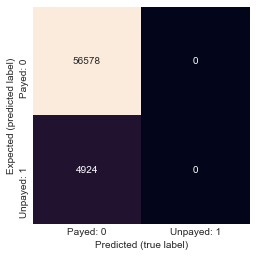


TARGET 1 predicted: 0
Confusion Matrix:
 [[56578     0]
 [ 4924     0]]


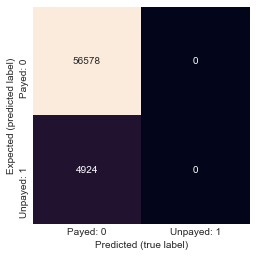


TARGET 1 predicted: 0
Confusion Matrix:
 [[56578     0]
 [ 4924     0]]


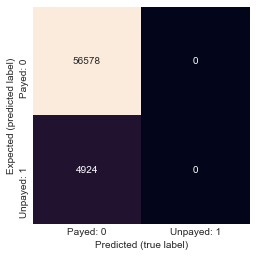

In [101]:
for key in results_collection:
    print('TARGET 1 predicted:', len(results_collection[0].where(results_collection[0]['y_lr_pred_bin'] == 1).dropna()))
    graph_conf_matrix(results_collection[key]['y_true'], results_collection[key]['y_lr_pred_bin'])
    print('')

Le jeu de données est fortement déséqulibré. Aucun TARGET=1 était trouvé.

- Accuracy: This metric is simply equal to the proportion of predictions that the model classified correctly.
> Correct predictions / Total predictions = (TP + TN) / (TP + TN + FP + FN)

- Precision: Is the positive predictive value, it quantifies the number of positive class predictions that actually belong to the positive class. What proportion of postive identifications was actually correct?
> TP / (TP + FP)

- Recall: Also known as Sensitivity, Hit Rate or True Positive Rate (TPR). It quantifies the number of positive class predictions made out of all positive examples in the dataset. What proportion of actual positives was identifies correctly?
> TP / (TP + FN)

- F1-Score: It's a measure of a test's accuracy, it's the harmonic mean of Precision and Recall providing a single score that balances both the concerns of Precision and Recall in one number with a maximum score of 1 (perfect Precision and Recall) and 0. Overall, it's a measure of the preciseness and robustness of the model.
> 2 * (precision * recall) / (precision + recall) = 2 * TP / (2 * TP + FP + FN)

In [102]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

df_metric_base = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'Time'],
                              index=['app_train + bureau',
                                     'complete traeatment',
                                     'light traeatment'])

for key in results_collection:
    df_metric_base['Accuracy'][key] = round(accuracy_score(results_collection[key]['y_true'], results_collection[key].iloc[:, 2]), 2)
    df_metric_base['Precision'][key] = round(precision_score(results_collection[key]['y_true'], results_collection[key].iloc[:, 2]), 2)
    df_metric_base['Recall'][key] = round(recall_score(results_collection[key]['y_true'], results_collection[key].iloc[:, 2]), 2)
    df_metric_base['F1'][key] = round(f1_score(results_collection[key]['y_true'], results_collection[key].iloc[:, 2]), 2)
    df_metric_base['Time'][key] = time_collection[key]
    
df_metric_base

,Accuracy,Precision,Recall,F1,Time
app_train + bureau,0.92,0.0,0.0,0.0,00:00:19
complete traeatment,0.92,0.0,0.0,0.0,00:01:03
light traeatment,0.92,0.0,0.0,0.0,00:00:37


Since the target is heavily unbalanced we can't see any effects of the feature engineering. A resampling of the data is needed to correct this inbalance.

## Resample

Our model is great for predicting TARGET=0 but fairly useless predicting TARGET=1.

We can correct this situation via resampling:
- undersampling: pop elements of the heaviest class. Tomek links method from the imblearn library
- oversampling: add elements in the minor class. SMOTE method from the imblearn library

**Tomel links** :
This method removes the heaviest class by picking pairs of opposite classes that are very close together.

**SMOTE** :
The Synthetic Minority Oversampling Technique (SMOTE) consists of synthesizing elements for the minority class based on those already existing by randomly picking a point from the minority class and calculating the k-nearest neighbors for that point. The synthetic points are added between the picked point and its neighbors.

<AxesSubplot:ylabel='Frequency'>

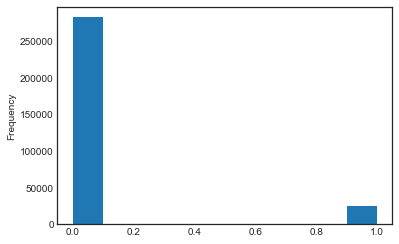

In [103]:
app_train_control['TARGET'].astype(int).plot.hist()

In [104]:
import imblearn #https://github.com/scikit-learn-contrib/imbalanced-learn
from imblearn.under_sampling  import RandomUnderSampler
from collections import Counter

def resampler(df_list, train_labels=app_train['TARGET'], test_size=0.2, C=0.0001, floor=0.5, printShape='NO', force='NO'):
    resampler_collection = {}
    time_collection = {}
    
    if force == 'NO':
        if df_list[0][2] == 'Control':
            df_list.pop(0)

        for e, df_tuple in enumerate(df_list):
            print('Resampling process for {} in Logistic Regression'.format(df_tuple[2]))
            
            timer_start = time.time()
            
            train, test = lr_preprocess(df_tuple[0], df_tuple[1], printShape) #train, test
            rus = RandomUnderSampler()
            X_rus, y_rus = rus.fit_resample(train, train_labels)
            print('Original shape:', Counter(train_labels))
            print('Resampled shape:', Counter(y_rus))
            
            X_train, X_test, y_train, y_test = sampling(train, train_labels, test_size)

            print(X_rus.shape, y_rus.shape, y_test.shape, X_test.shape)
            
            lr_pred = lr_model(X_rus, X_test, y_rus, y_test, C)
            
            timer_end = time.time()
            time_elapsed = elapsed_time(timer_start, timer_end, df_tuple[2], 'Logistic Regression')

            df_result = pd.DataFrame(y_test.values, columns=['y_true'], index=y_test.index)
            df_lr_pred = pd.DataFrame(lr_pred, columns=['y_lr_pred'], index=y_test.index)
            df_result = pd.concat([df_result, df_lr_pred], sort=False, axis=1)
            df_result['y_lr_pred_bin'] = force_prob(df_result['y_lr_pred'], floor)
            resampler_collection[e] = df_result
            time_collection[e] = time_elapsed
            
            print('')
        
    elif force == 'YES': #Force only one dataset
        print('Resampling process for {} in Logistic Regression'.format(df_list[2]))

        timer_start = time.time()
        
        train, test = lr_preprocess(df_tuple[0], df_tuple[1], printShape) #train, test
        rus = RandomUnderSampler()
        X_rus, y_rus = rus.fit_resample(train, train_labels)
        print('Original shape:', Counter(train_labels))
        print('Resampled shape:', Counter(y_rus))

        X_train, X_test, y_train, y_test = sampling(train, train_labels, test_size)

        print(X_rus.shape, y_rus.shape, y_test.shape, X_test.shape)
        
        lr_pred = lr_model(X_rus, X_test, y_rus, y_test, C)

        timer_end = time.time()
        time_elapsed = elapsed_time(timer_start, timer_end, df_tuple[2], 'Logistic Regression')
        
        df_result = pd.DataFrame(y_test.values, columns=['y_true'], index=y_test.index)
        df_lr_pred = pd.DataFrame(lr_pred, columns=['y_lr_pred'], index=y_test.index)
        df_result = pd.concat([df_result, df_lr_pred], sort=False, axis=1)
        df_result['y_lr_pred_bin'] = force_prob(df_result['y_lr_pred'], floor)
        resampler_collection = df_result
        time_collection = time_elapsed
        
    return resampler_collection, time_collection

In [105]:
resampler_collection, time_collection = resampler(df_list_align)

Resampling process for app_train + bureau in Logistic Regression
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0: 24825, 1: 24825})
(49650, 131) (49650,) (61502,) (61502, 131)
Accuracy: 65.40762902019446%
Elapsed Time for app_train + bureau with Logistic Regression: 00:00:06

Resampling process for complete traeatment in Logistic Regression
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0: 24825, 1: 24825})
(49650, 394) (49650,) (61502,) (61502, 394)
Accuracy: 66.72303339728789%
Elapsed Time for complete traeatment with Logistic Regression: 00:00:14

Resampling process for light traeatment in Logistic Regression
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0: 24825, 1: 24825})
(49650, 245) (49650,) (61502,) (61502, 245)
Accuracy: 66.16695392019771%
Elapsed Time for light traeatment with Logistic Regression: 00:00:12



TARGET 1 predicted: 22939
Confusion Matrix:
 [[36933 19645]
 [ 1630  3294]]


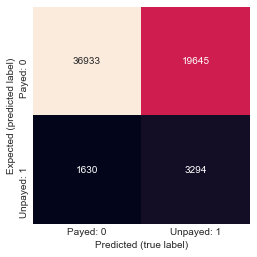


TARGET 1 predicted: 22939
Confusion Matrix:
 [[37745 18833]
 [ 1633  3291]]


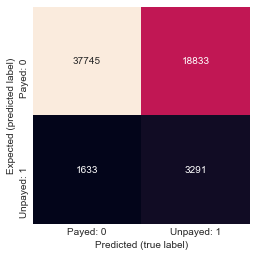


TARGET 1 predicted: 22939
Confusion Matrix:
 [[37363 19215]
 [ 1593  3331]]


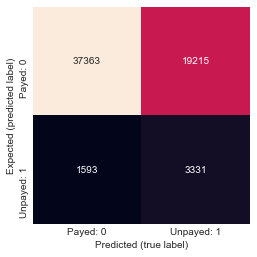

In [106]:
for key in resampler_collection:
    print('TARGET 1 predicted:', len(resampler_collection[0].where(resampler_collection[0]['y_lr_pred_bin'] == 1).dropna()))
    graph_conf_matrix(resampler_collection[key]['y_true'], resampler_collection[key]['y_lr_pred_bin'])
    print('')

## Metrics

In [107]:
df_resampler_metric_base = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'Time'],
                                        index=['app_train + bureau',
                                               'complete traeatment',
                                               'light traeatment'])

for key in resampler_collection:
    df_resampler_metric_base['Accuracy'][key] = round(accuracy_score(resampler_collection[key]['y_true'], resampler_collection[key].iloc[:, 2]), 2)
    df_resampler_metric_base['Precision'][key] = round(precision_score(resampler_collection[key]['y_true'], resampler_collection[key].iloc[:, 2]), 2)
    df_resampler_metric_base['Recall'][key] = round(recall_score(resampler_collection[key]['y_true'], resampler_collection[key].iloc[:, 2]), 2)
    df_resampler_metric_base['F1'][key] = round(f1_score(resampler_collection[key]['y_true'], resampler_collection[key].iloc[:, 2]), 2)
    df_resampler_metric_base['Time'][key] = time_collection[key]
    
df_resampler_metric_base

,Accuracy,Precision,Recall,F1,Time
app_train + bureau,0.65,0.14,0.67,0.24,00:00:06
complete traeatment,0.67,0.15,0.67,0.24,00:00:14
light traeatment,0.66,0.15,0.68,0.24,00:00:12


Metrics aren't that good...

# Other methods

In [108]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score

import lightgbm as lgb #LightGBM for gradient boosting machine
import xgboost as xgb
###############################################################################################
def resampler_method(df_list, method, method_code, train_labels=app_train['TARGET'], test_size=0.2, floor=0.5, printShape='NO'):
    print('Method:', method_code)
    
    y_pred_tag = 'y_pred_' + method_code
    y_pred_bin_tag = 'y_pred_bin_' + method_code
    
    train, test = lr_preprocess(df_list[0], df_list[1], printShape) #train, test
    rus = RandomUnderSampler()
    X_rus, y_rus = rus.fit_resample(train, train_labels)
    print('Original shape:', Counter(train_labels))
    print('Resampled shape:', Counter(y_rus))

    #X_train, X_test, y_train, y_test = sampling(train, train_labels, test_size)
    X_train, X_test, y_train, y_test = sampling(X_rus, y_rus, test_size)

    #print(X_rus.shape, y_rus.shape, y_test.shape, X_test.shape)

    method.fit(X_rus, y_rus)
    y_pred = method.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print('Accuracy: {}%'.format(accuracy*100.0))
    method_pred = method.predict_proba(X_test)[:, 1]
        
    df_result = pd.DataFrame(y_test.values, columns=['y_true'], index=y_test.index)
    df_method_pred = pd.DataFrame(method_pred, columns=[y_pred_tag], index=y_test.index)
    df_result = pd.concat([df_result, df_method_pred], sort=False, axis=1)
    df_result[y_pred_bin_tag] = force_prob(df_result[y_pred_tag], floor)

    return df_result, y_test, method
###############################################################################################
def loop_methods(df_list):
    lr_c = {}
    rfc_c = {}
    xgb_c = {}
    lgb_c = {}
    
    y_test_lr_c = {}
    y_test_rfc_c = {}
    y_test_xgb_c = {}
    y_test_lgb_c = {}
    
    lr_m_c = {}
    rfc_m_c = {}
    xgb_m_c = {}
    lgb_m_c = {}
    
    time_lr_c = {}
    time_rfc_c = {}
    time_xgb_c = {}
    time_lgb_c = {}
    
    for e, df_tuple in enumerate(df_list):
        print('Resampling process for {}...'.format(df_tuple[2]), end='\n\n')
        
        timer_start = time.time()
        lr = LogisticRegression(C=10,
                                n_jobs=-1,
                                )
        lr_collection, y_test_lr, lr = resampler_method(df_tuple, lr, 'lr')
        timer_end = time.time()
        lr_time = elapsed_time(timer_start, timer_end, df_tuple[2], 'LR')
        print('')

        timer_start = time.time()
        rfc = RandomForestClassifier(max_features='log2', 
                                     min_samples_leaf=1,
                                     n_estimators=1000,
                                     n_jobs=-1,
                                    )
        rfc_collection, y_test_rfc, rfc = resampler_method(df_tuple, rfc, 'rfc')
        timer_end = time.time()
        rfc_time = elapsed_time(timer_start, timer_end, df_tuple[2], 'RFC')
        print('')

        timer_start = time.time()
        xgbC = xgb.XGBClassifier(objective='binary:logistic',
                                 random_state=42,
                                 n_jobs=-1,
                                )
        xgb_collection, y_test_xgb, xgbC = resampler_method(df_tuple, xgbC, 'xgb')
        timer_end = time.time()
        xgb_time = elapsed_time(timer_start, timer_end, df_tuple[2], 'XGB')
        print('')

        timer_start = time.time()
        lgbC = lgb.LGBMClassifier(n_estimators=1000,
                                  objective='binary',
                                  class_weight='balanced',
                                  learning_rate=0.05,
                                  reg_alpha=0.1,
                                  reg_lambda=0.1,
                                  subsample=0.8,
                                  random_state=42,
                                  n_jobs=-1,
                                 )
        lgb_collection, y_test_lgb, lgbC = resampler_method(df_tuple, lgbC, 'lgb')
        timer_end = time.time()
        lgb_time = elapsed_time(timer_start, timer_end, df_tuple[2], 'LGB')
        print('')

        lr_c[e] = lr_collection
        rfc_c[e] = rfc_collection
        xgb_c[e] = xgb_collection
        lgb_c[e] = lgb_collection
        y_test_lr_c[e] = y_test_lr
        y_test_rfc_c[e] = y_test_rfc
        y_test_xgb_c[e] = y_test_xgb
        y_test_lgb_c[e] = y_test_lgb
        lr_m_c[e] = lr
        rfc_m_c[e] = rfc
        xgb_m_c[e] = xgbC
        lgb_m_c[e] = lgbC
        time_lr_c[e] = lr_time
        time_rfc_c[e] = rfc_time
        time_xgb_c[e] = xgb_time
        time_lgb_c[e] = lgb_time
        
        print('Done {}'.format(df_tuple[2]), end='\n\n')
    
    print('Done')
    
    return (lr_c, rfc_c, xgb_c, lgb_c, 
            y_test_lr_c, y_test_rfc_c, y_test_xgb_c, y_test_lgb_c, 
            lr_m_c, rfc_m_c, xgb_m_c, lgb_m_c, 
            time_lr_c, time_rfc_c, time_xgb_c, time_lgb_c)
###############################################################################################

In [109]:
lr_c, rfc_c, xgb_c, lgb_c, y_test_lr_c, y_test_rfc_c, y_test_xgb_c, y_test_lgb_c, lr_m_c, rfc_m_c, xgb_m_c, lgb_m_c, time_lr_c, time_rfc_c, time_xgb_c, time_lgb_c = loop_methods(df_list_align)

Resampling process for app_train + bureau...

Method: lr
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0: 24825, 1: 24825})
Accuracy: 68.32829808660624%
Elapsed Time for app_train + bureau with LR: 00:00:14

Method: rfc
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0: 24825, 1: 24825})
Accuracy: 100.0%
Elapsed Time for app_train + bureau with RFC: 00:00:24

Method: xgb
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0: 24825, 1: 24825})
[21:20:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy: 81.6515609264854%
Elapsed Time for app_train + bureau with XGB: 00:00:10

Method: lgb
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0

## Confusion Matrix

In [110]:
###############################################################################################
def conf_mat_methods(df_list_align, datasets, lr_c=False, rfc_c=False, xgb_c=False, lgb_c=False):
    for key in range(datasets):
        print('Confusion Matrix for {}...'.format(df_list_align[key][2]), end='\n\n')
        
        if lr_c != False:
            print('Logistic Regression')
            print('TARGET 1 predicted:', len(lr_c[key].where(lr_c[key]['y_pred_bin_lr'] == 1).dropna()))
            graph_conf_matrix(lr_c[key]['y_true'], lr_c[key]['y_pred_bin_lr'])

        if rfc_c != False:
            print('RandomForestClassifier')
            print('TARGET 1 predicted:', len(rfc_c[key].where(rfc_c[key]['y_pred_bin_rfc'] == 1).dropna()))
            graph_conf_matrix(rfc_c[key]['y_true'], rfc_c[key]['y_pred_bin_rfc'])

        if xgb_c != False:
            print('XGBClassifier')
            print('TARGET 1 predicted:', len(xgb_c[key].where(xgb_c[key]['y_pred_bin_xgb'] == 1).dropna()))
            graph_conf_matrix(xgb_c[key]['y_true'], xgb_c[key]['y_pred_bin_xgb'])

        if lgb_c != False:
            print('LGBMClassifier')
            print('TARGET 1 predicted:', len(lgb_c[key].where(lgb_c[key]['y_pred_bin_lgb'] == 1).dropna()))
            graph_conf_matrix(lgb_c[key]['y_true'], lgb_c[key]['y_pred_bin_lgb'])
            print('')
###############################################################################################

Confusion Matrix for app_train + bureau...

Logistic Regression
TARGET 1 predicted: 4919
Confusion Matrix:
 [[3415 1549]
 [1596 3370]]


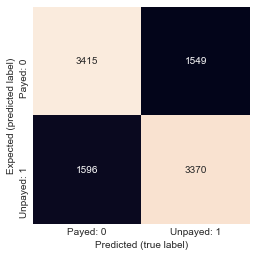

RandomForestClassifier
TARGET 1 predicted: 4966
Confusion Matrix:
 [[4964    0]
 [   0 4966]]


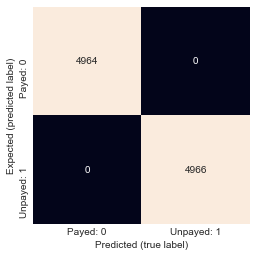

XGBClassifier
TARGET 1 predicted: 4902
Confusion Matrix:
 [[4085  879]
 [ 943 4023]]


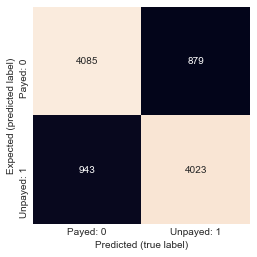

LGBMClassifier
TARGET 1 predicted: 4989
Confusion Matrix:
 [[4292  672]
 [ 649 4317]]


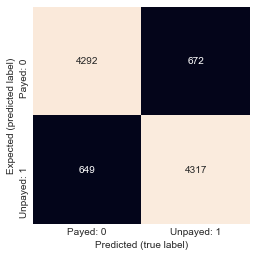


Confusion Matrix for complete traeatment...

Logistic Regression
TARGET 1 predicted: 4964
Confusion Matrix:
 [[3513 1451]
 [1453 3513]]


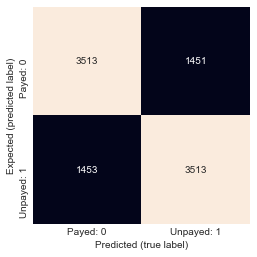

RandomForestClassifier
TARGET 1 predicted: 4966
Confusion Matrix:
 [[4964    0]
 [   0 4966]]


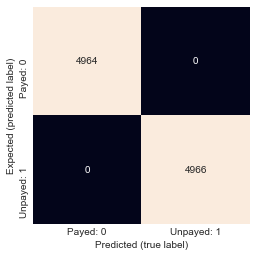

XGBClassifier
TARGET 1 predicted: 4933
Confusion Matrix:
 [[4218  746]
 [ 779 4187]]


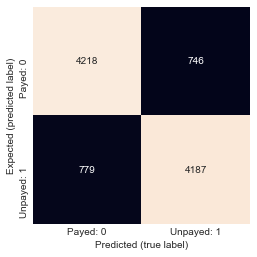

LGBMClassifier
TARGET 1 predicted: 4970
Confusion Matrix:
 [[4445  519]
 [ 515 4451]]


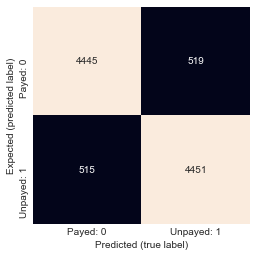


Confusion Matrix for light traeatment...

Logistic Regression
TARGET 1 predicted: 4926
Confusion Matrix:
 [[3472 1492]
 [1532 3434]]


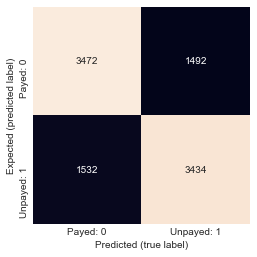

RandomForestClassifier
TARGET 1 predicted: 4966
Confusion Matrix:
 [[4964    0]
 [   0 4966]]


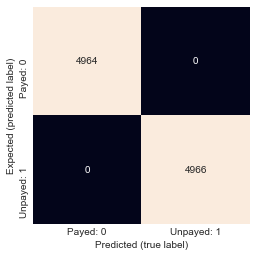

XGBClassifier
TARGET 1 predicted: 5002
Confusion Matrix:
 [[4107  857]
 [ 821 4145]]


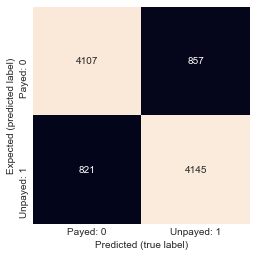

LGBMClassifier
TARGET 1 predicted: 4949
Confusion Matrix:
 [[4370  594]
 [ 611 4355]]


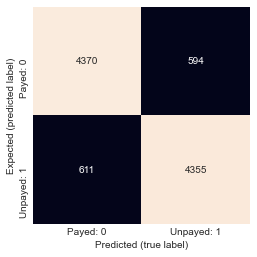

In [111]:
conf_mat_methods(df_list_align, 3, lr_c, rfc_c, xgb_c, lgb_c)

## Metrics

In [112]:
###############################################################################################
def metrics_methods(datasets, lr_c, rfc_c, xgb_c, lgb_c, time_lr_c, time_rfc_c, time_xgb_c, time_lgb_c):
    methods_collection = {}
    time_collection = {}
    df_metrics_collection = {}

    for e in range(datasets):
        temp = pd.DataFrame(columns=['y_true', 
                                     'y_pred_bin_lr',
                                     'y_pred_bin_rfc',
                                     'y_pred_bin_xgb',
                                     'y_pred_bin_lgb'], 
                            index=lr_c[e].index)

        temp['y_true'] = lr_c[e]['y_true']
        temp['y_pred_bin_lr'] = lr_c[e]['y_pred_bin_lr']
        temp['y_pred_bin_rfc'] = rfc_c[e]['y_pred_bin_rfc']
        temp['y_pred_bin_xgb'] = xgb_c[e]['y_pred_bin_xgb']
        temp['y_pred_bin_lgb'] = lgb_c[e]['y_pred_bin_lgb']

        methods_collection[e] = temp

    time_collection = pd.DataFrame.from_dict([time_lr_c, time_rfc_c, time_xgb_c, time_lgb_c]).T
    time_collection.rename(columns={0: 'Time_LR', 1: 'Time_RFC', 2: 'Time_XGB', 3: 'Time_LGB'}, inplace=True)

    for e in range(len(lr_c)):
        temp_metrics = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'Time'],
                                    index=['Logistic Regression',
                                           'RandomForestClassifier',
                                           'XGBClassifier',
                                           'LGBMClassifier'])
        j = 1

        for key in range(0, 4):
            temp_metrics['Accuracy'][key] = round(accuracy_score(methods_collection[e]['y_true'], methods_collection[e].iloc[:, j]), 2)
            temp_metrics['Precision'][key] = round(precision_score(methods_collection[e]['y_true'], methods_collection[e].iloc[:, j]), 2)
            temp_metrics['Recall'][key] = round(recall_score(methods_collection[e]['y_true'], methods_collection[e].iloc[:, j]), 2)
            temp_metrics['F1'][key] = round(f1_score(methods_collection[e]['y_true'], methods_collection[e].iloc[:, j]), 2)
            temp_metrics['Time'][key] = time_collection.iloc[e][key]

            j += 1

        df_metrics_collection[e] = temp_metrics

    del temp, temp_metrics
    return df_metrics_collection
    # 'app_train + bureau'
    # 'complete traeatment'
###############################################################################################  
def ypred_y_test_methods(y_test_lr_c, y_test_rfc_c, y_test_xgb_c, y_test_lgb_c, lr_c, rfc_c, xgb_c, lgb_c, best_ds=1):
    dataset = best_ds #based on stability of scores and simpleness of features

    y_test_collection = pd.DataFrame(columns=['y_test_lr',
                                              'y_test_rfc',
                                              'y_test_xgb',
                                              'y_test_lgb'], 
                                     index=y_test_lr_c[dataset].index)

    y_test_collection['y_test_lr'] = y_test_lr_c[dataset]
    y_test_collection['y_test_rfc'] = y_test_rfc_c[dataset]
    y_test_collection['y_test_xgb'] = y_test_xgb_c[dataset]
    y_test_collection['y_test_lgb'] = y_test_lgb_c[dataset]

    y_pred_collection = pd.DataFrame(columns=['y_pred_lr',
                                              'y_pred_rfc',
                                              'y_pred_xgb',
                                              'y_pred_lgb'], 
                                     index=lr_c[dataset].index)

    y_pred_collection['y_pred_lr'] = lr_c[dataset]['y_pred_lr']
    y_pred_collection['y_pred_rfc'] = rfc_c[dataset]['y_pred_rfc']
    y_pred_collection['y_pred_xgb'] = xgb_c[dataset]['y_pred_xgb']
    y_pred_collection['y_pred_lgb'] = lgb_c[dataset]['y_pred_lgb']

    return y_test_collection, y_pred_collection
###############################################################################################

In [113]:
df_metrics_collection = metrics_methods(3, lr_c, rfc_c, xgb_c, lgb_c, time_lr_c, time_rfc_c, time_xgb_c, time_lgb_c)
df_metrics_collection

{0:                        Accuracy Precision Recall    F1      Time
 Logistic Regression     0.68     0.69      0.68   0.68  00:00:14
 RandomForestClassifier  1.0      1.0       1.0    1.0   00:00:24
 XGBClassifier           0.82     0.82      0.81   0.82  00:00:10
 LGBMClassifier          0.87     0.87      0.87   0.87  00:00:13,
 1:                        Accuracy Precision Recall    F1      Time
 Logistic Regression     0.71     0.71      0.71   0.71  00:00:19
 RandomForestClassifier  1.0      1.0       1.0    1.0   00:00:40
 XGBClassifier           0.85     0.85      0.84   0.85  00:00:27
 LGBMClassifier          0.9      0.9       0.9    0.9   00:00:30,
 2:                        Accuracy Precision Recall    F1      Time
 Logistic Regression     0.7      0.7       0.69   0.69  00:00:31
 RandomForestClassifier  1.0      1.0       1.0    1.0   00:00:32
 XGBClassifier           0.83     0.83      0.83   0.83  00:00:20
 LGBMClassifier          0.88     0.88      0.88   0.88  00:00:21

In [114]:
y_test_collection_0, y_pred_collection_0 = ypred_y_test_methods(y_test_lr_c, y_test_rfc_c, y_test_xgb_c, y_test_lgb_c, lr_c, rfc_c, xgb_c, lgb_c, 0)
y_test_collection_1, y_pred_collection_1 = ypred_y_test_methods(y_test_lr_c, y_test_rfc_c, y_test_xgb_c, y_test_lgb_c, lr_c, rfc_c, xgb_c, lgb_c, 1)
y_test_collection_2, y_pred_collection_2 = ypred_y_test_methods(y_test_lr_c, y_test_rfc_c, y_test_xgb_c, y_test_lgb_c, lr_c, rfc_c, xgb_c, lgb_c, 2)

## ROC AUC

The Receiver Operating Characteristic (ROC) Curve is usually used with binary classifiers. This method crosses the True Positive (TP) with the False Positive (FP) rates. The true-positive rate is also known as sensitivity, recall or probability of detection in machine learning. The false-positive rate is also known as probability of false alarm and can be calculated as (1 − specificity).

The better the ROC curve, more shifted to the left it will be with the perfect random classifier as a 45° straight line.

The Area Under the Curve (AUC) is used to compare classifiers. A perfect classifier will have an area under the ROC curve equal to 1, meanwhile, a perfectly random classifier will have an AUC of 0.5.

In [115]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
###############################################################################################
def methods_roc_auc(y_pred_collection, y_test_collection):
    
    df_roc_auc = pd.DataFrame(columns=['FP', 'TP', 'Threshold', 'AUC_Score'],
                              index=['Logistic Regression',
                                     'RandomForestClassifier',
                                     'XGBClassifier',
                                     'LGBMClassifier'])
    
    for e, col in enumerate(y_test_collection):
        fp, tp, threshold = roc_curve(y_test_collection[col], y_pred_collection.iloc[:, e])
        auc_score = roc_auc_score(y_test_collection[col], y_pred_collection.iloc[:, e])

        df_roc_auc['FP'][e] = fp
        df_roc_auc['TP'][e] = tp
        df_roc_auc['Threshold'][e] = threshold
        df_roc_auc['AUC_Score'][e] = auc_score
        
        print(df_roc_auc.index[e],'AUC Score:', auc_score)
    
    return df_roc_auc
###############################################################################################
def plot_roc_auc(df_roc_auc):
    
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    
    for e, col in enumerate(df_roc_auc):
        plt.plot(df_roc_auc['FP'][e], 
                 df_roc_auc['TP'][e], 
                 label=df_roc_auc.index[e])
    
    plt.legend(loc='lower right')
    plt.plot([0, 1], [0, 1], 'r--')
    plt.xlim([0, 1.01])
    plt.ylim([0, 1.1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    
    plt.subplot(1, 2, 2)
    plt.bar(df_roc_auc.index,
            df_roc_auc['AUC_Score'],
           )
    plt.ylabel('score')
    plt.xlabel('Method')
    plt.xticks(rotation=45)
    plt.show
###############################################################################################

In [116]:
print('Scores for first dataset (app_train + bureau)')
df_roc_auc_0 = methods_roc_auc(y_pred_collection_0, y_test_collection_0)
print('')
print('Scores for second dataset (complete traeatment)')
df_roc_auc_1 = methods_roc_auc(y_pred_collection_1, y_test_collection_1)
print('')
print('Scores for third dataset (light traeatment)')
df_roc_auc_2 = methods_roc_auc(y_pred_collection_2, y_test_collection_2)

Scores for first dataset (app_train + bureau)
Logistic Regression AUC Score: 0.7522505576193701
RandomForestClassifier AUC Score: 1.0
XGBClassifier AUC Score: 0.9050771069217497
LGBMClassifier AUC Score: 0.9433562812134602

Scores for second dataset (complete traeatment)
Logistic Regression AUC Score: 0.7773565726391518
RandomForestClassifier AUC Score: 1.0
XGBClassifier AUC Score: 0.9280718880328213
LGBMClassifier AUC Score: 0.9631260094833426

Scores for third dataset (light traeatment)
Logistic Regression AUC Score: 0.7627764446909412
RandomForestClassifier AUC Score: 1.0
XGBClassifier AUC Score: 0.91213728373082
LGBMClassifier AUC Score: 0.954576332599144


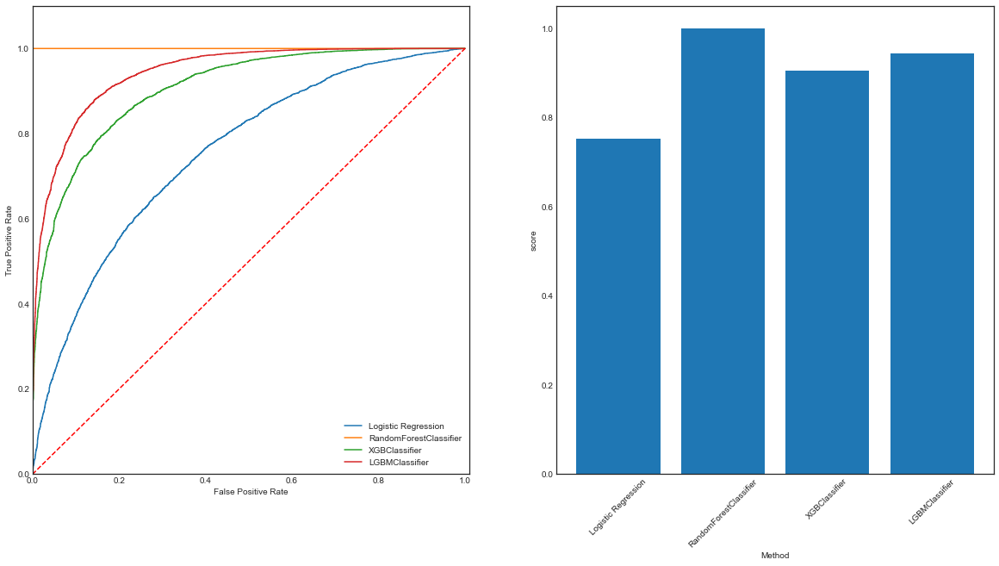

In [117]:
plot_roc_auc(df_roc_auc_0) #app_train + bureau

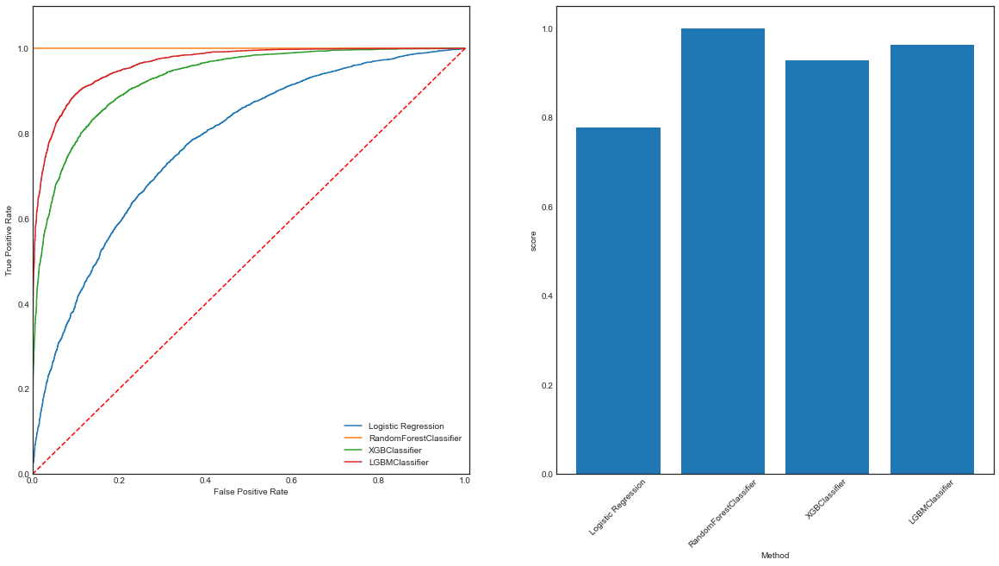

In [118]:
plot_roc_auc(df_roc_auc_1) #complete treatment

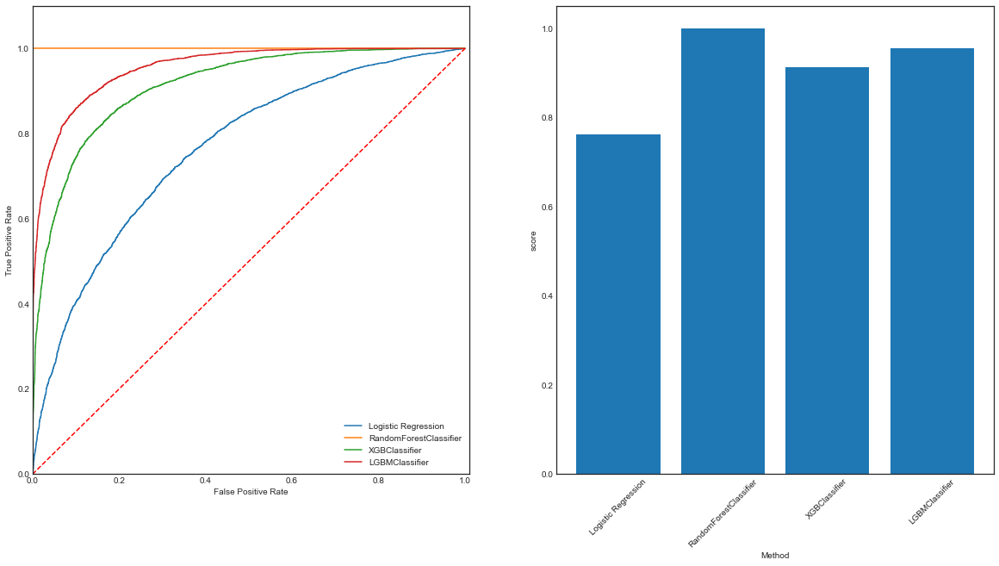

In [119]:
plot_roc_auc(df_roc_auc_2) #light treatment

**RandomForestClassifier** overfitting issues.

## Feature importance

In [120]:
###############################################################################################
def plot_feature_importances(df, top=30):
    
    df = df.sort_values('importance', ascending=False).reset_index(drop=True)
    df['importance_normalized'] = df['importance'] / df['importance'].sum()

    plt.figure(figsize=(15, 15))
    ax = plt.subplot()
    
    ax.barh(list(reversed(list(df.index[:top]))), 
            df['importance_normalized'].head(top), 
            align='center',
            edgecolor = 'k',
           )
    
    ax.set_yticks(list(reversed(list(df.index[:top]))))
    ax.set_yticklabels(df['feature'].head(top))
    
    plt.xlabel('Normalized Importance')
    plt.title('Feature Importances')
    plt.show()
    
    return df
###############################################################################################

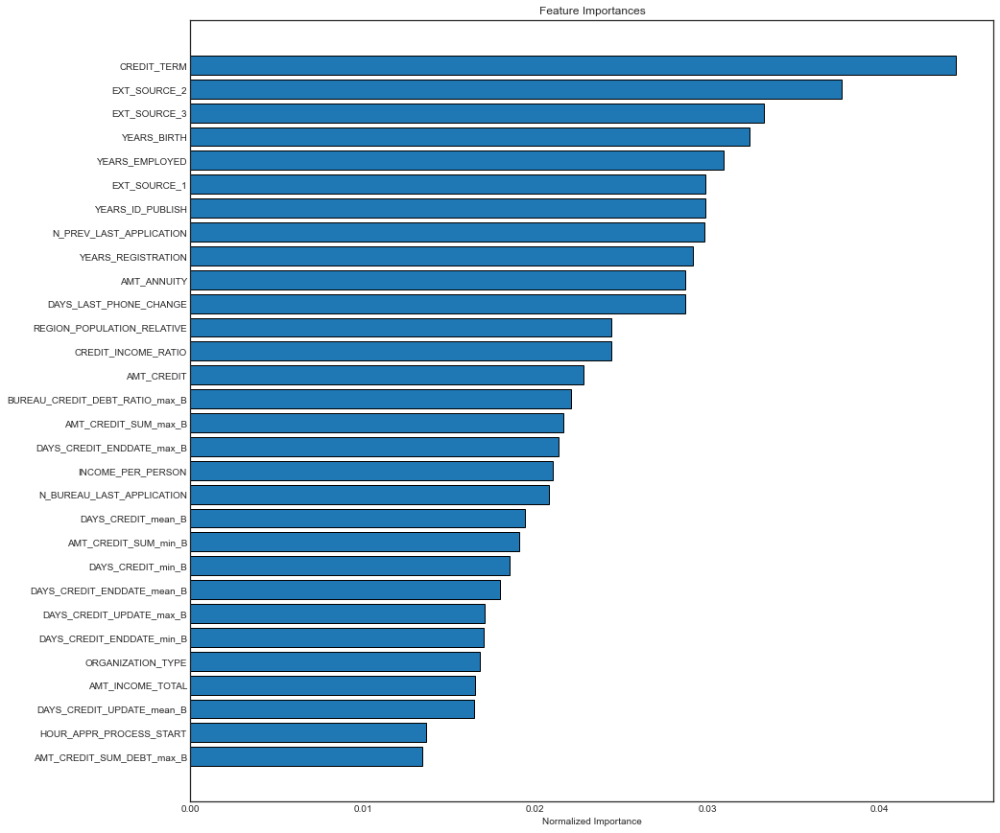

In [121]:
#app_train + bureau
df_feat_importances_0 = pd.DataFrame({'feature': df_list_align[0][1].columns, 
                                    'importance': lgb_m_c[0].feature_importances_})
df_feat_importances_sorted_0 = plot_feature_importances(df_feat_importances_0)

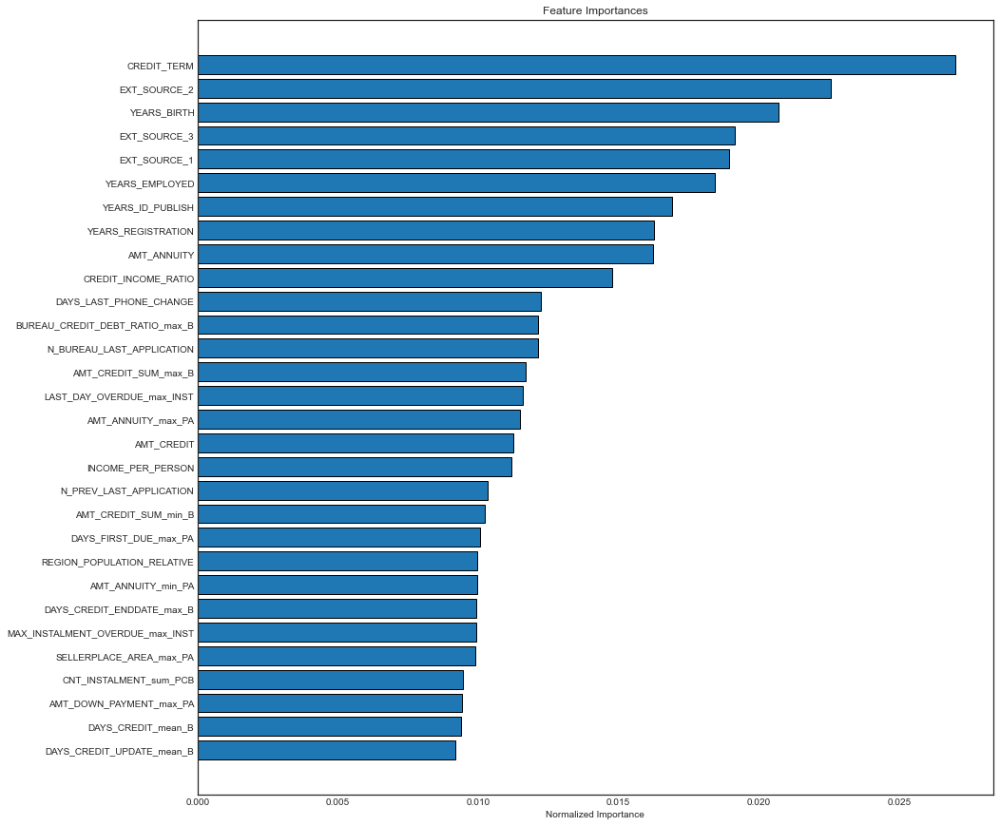

In [122]:
#complete treatment
df_feat_importances_1 = pd.DataFrame({'feature': df_list_align[1][1].columns, 
                                    'importance': lgb_m_c[1].feature_importances_})
df_feat_importances_sorted_1 = plot_feature_importances(df_feat_importances_1)

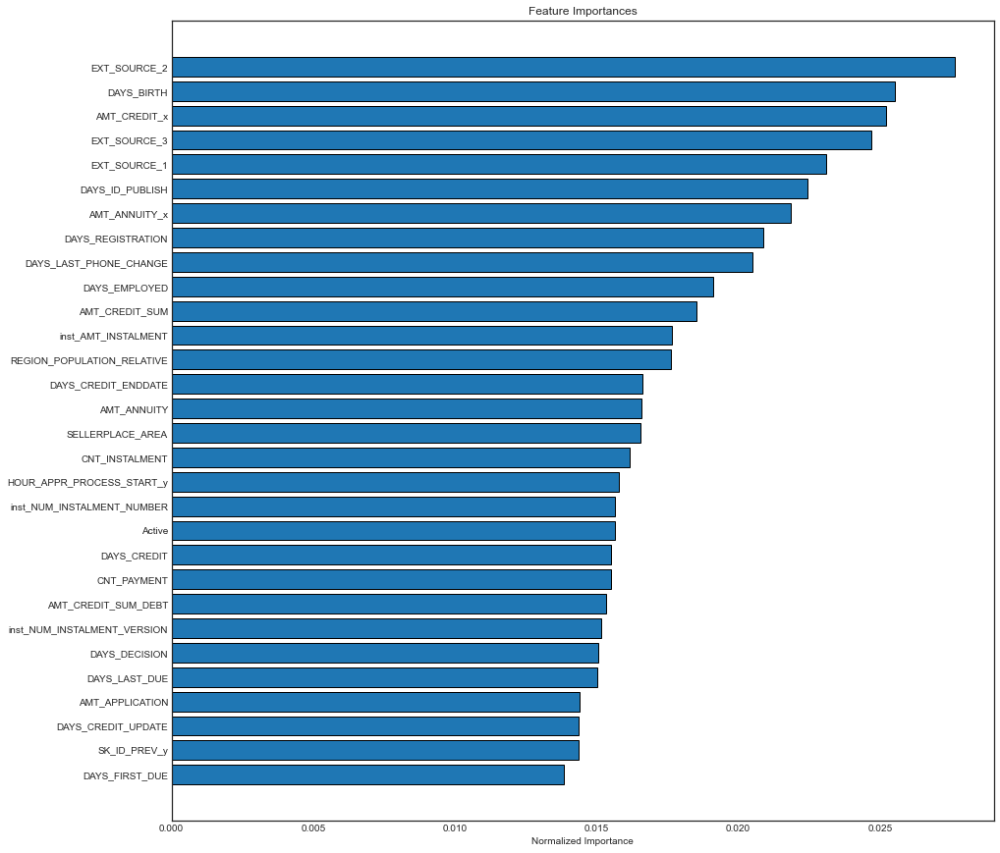

In [123]:
#light treatment
df_feat_importances_2 = pd.DataFrame({'feature': df_list_align[2][1].columns, 
                                    'importance': lgb_m_c[2].feature_importances_})
df_feat_importances_sorted_2 = plot_feature_importances(df_feat_importances_2)

In [124]:
print(lgb_m_c[0].get_params) #app_train + bureau
print('')
print(lgb_m_c[1].get_params) #complete treatment
print('')
print(lgb_m_c[2].get_params) #light treatment

<bound method LGBMModel.get_params of LGBMClassifier(class_weight='balanced', learning_rate=0.05, n_estimators=1000,
               objective='binary', random_state=42, reg_alpha=0.1,
               reg_lambda=0.1, subsample=0.8)>

<bound method LGBMModel.get_params of LGBMClassifier(class_weight='balanced', learning_rate=0.05, n_estimators=1000,
               objective='binary', random_state=42, reg_alpha=0.1,
               reg_lambda=0.1, subsample=0.8)>

<bound method LGBMModel.get_params of LGBMClassifier(class_weight='balanced', learning_rate=0.05, n_estimators=1000,
               objective='binary', random_state=42, reg_alpha=0.1,
               reg_lambda=0.1, subsample=0.8)>


### Model reduction and memory optimization for export

All models contain more than 200 features (in two cases more than 400) but this situation isn't optimal at all for deploying a usable dashboard in a real life situation. Therefore, we need to reduce the amount of features and since this isn't a Kaggle competition so we can tolerate some accuracy loss.

<AxesSubplot:title={'center':'app_train + bureau'}>

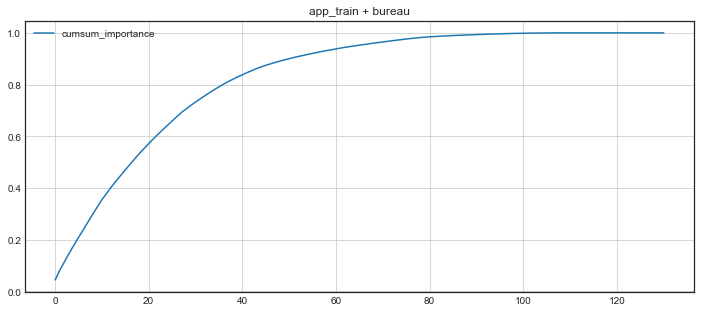

In [125]:
df_feat_importances_sorted_0['cumsum_importance'] = df_feat_importances_sorted_0['importance_normalized'].cumsum()
df_feat_importances_sorted_0.plot(y=['cumsum_importance'], 
                                  grid=True, 
                                  figsize=(12, 5), 
                                  title='app_train + bureau',
                                 )

<AxesSubplot:title={'center':'complete treatment'}>

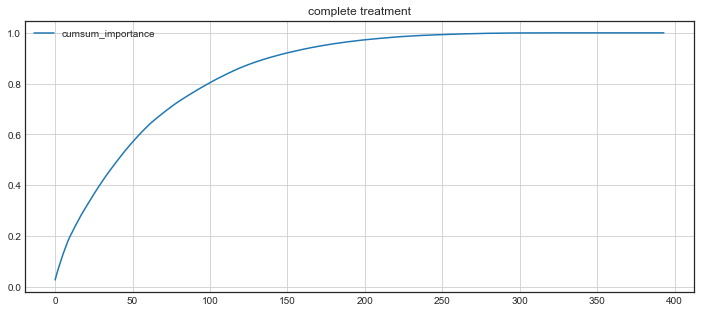

In [126]:
df_feat_importances_sorted_1['cumsum_importance'] = df_feat_importances_sorted_1['importance_normalized'].cumsum()
df_feat_importances_sorted_1.plot(y=['cumsum_importance'], 
                                  grid=True, 
                                  figsize=(12, 5),
                                  title='complete treatment',
                                 )

<AxesSubplot:title={'center':'light treatment'}>

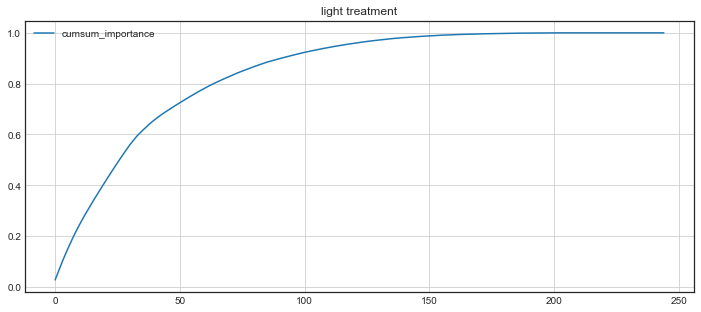

In [127]:
df_feat_importances_sorted_2['cumsum_importance'] = df_feat_importances_sorted_2['importance_normalized'].cumsum()
df_feat_importances_sorted_2.plot(y=['cumsum_importance'], 
                                  grid=True, 
                                  figsize=(12, 5),
                                  title='light treatment',
                                 )

As we can see in the cumsum graphics, most of features don't bring any important information into the mix and therefore can be dropped without heavily disturbing any model.

Based on the models results, we will pick 40 features from the the second model.

In [129]:
selected_features = ['CREDIT_TERM',
                     'EXT_SOURCE_2',
                     'YEARS_BIRTH',
                     'EXT_SOURCE_3',
                     'YEARS_EMPLOYED',
                     'EXT_SOURCE_1',
                     'YEARS_REGISTRATION',
                     'AMT_ANNUITY',
                     'YEARS_ID_PUBLISH',
                     'CREDIT_INCOME_RATIO',
                     'AMT_ANNUITY_min_PA',
                     'DAYS_LAST_PHONE_CHANGE',
                     'AMT_CREDIT_SUM_max_B',
                     'N_BUREAU_LAST_APPLICATION',
                     'REGION_POPULATION_RELATIVE',
                     'SELLERPLACE_AREA_max_PA',
                     'BUREAU_CREDIT_DEBT_RATIO_max_B',
                     'DAYS_CREDIT_ENDDATE_max_B',
                     'AMT_ANNUITY_max_PA',
                     'AMT_CREDIT',
                     'INCOME_PER_PERSON',
                     'AMT_CREDIT_SUM_min_B',
                     'N_PREV_LAST_APPLICATION',
                     'ORGANIZATION_TYPE',
                     'AMT_INCOME_TOTAL',
                     'HOUR_APPR_PROCESS_START',
                     'OCCUPATION_TYPE',
                     'N_REJECT_RATIO',
                     'OBS_30_CNT_SOCIAL_CIRCLE',
                     'CODE_GENDER',
                     'N_TOTAL_LOANS',
                     'NAME_FAMILY_STATUS',
                     'N_BUREAU_LOANS',
                     'NAME_EDUCATION_TYPE',
                     'NAME_HOUSING_TYPE',
                     'WALLSMATERIAL_MODE',
                     'FLAG_OWN_CAR',
                     'N_PREV_APPROVED',
                     'NAME_CONTRACT_TYPE',
                     'CNT_CHILDREN']

Features with 17.64% cumsum: 40


<AxesSubplot:>

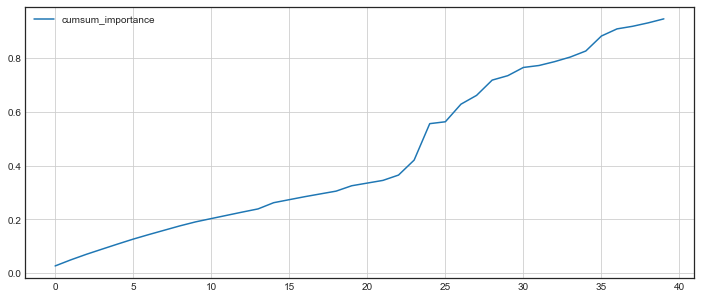

In [130]:
df_selected_features = df_feat_importances_sorted_1[df_feat_importances_sorted_1['feature'].isin(selected_features)]
df_selected_features.reset_index(drop=True, inplace=True)
print('Features with {}% cumsum: {}'.format(round(df_selected_features['cumsum_importance'].sum(), 2), 
                                            len(df_selected_features.feature.tolist())))
df_selected_features.plot(y=['cumsum_importance'], grid=True, figsize=(12, 5))

In [131]:
df_app_test_align = df_list_align[1][1][df_list_align[1][1].columns.intersection(df_selected_features['feature'])]
df_app_train_align = df_list_align[1][0][df_list_align[1][0].columns.intersection(df_selected_features['feature'])]
df_list_align = [(df_app_train_align, df_app_test_align, 'reduced set')]

In [132]:
lr_c, rfc_c, xgb_c, lgb_c, y_test_lr_c, y_test_rfc_c, y_test_xgb_c, y_test_lgb_c, lr_m_c, rfc_m_c, xgb_m_c, lgb_m_c, time_lr_c, time_rfc_c, time_xgb_c, time_lgb_c = loop_methods(df_list_align)

Resampling process for reduced set...

Method: lr
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0: 24825, 1: 24825})
Accuracy: 67.98590130916415%
Elapsed Time for reduced set with LR: 00:00:05

Method: rfc
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0: 24825, 1: 24825})
Accuracy: 100.0%
Elapsed Time for reduced set with RFC: 00:00:28

Method: xgb
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0: 24825, 1: 24825})
[21:25:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy: 81.97381671701913%
Elapsed Time for reduced set with XGB: 00:00:05

Method: lgb
Original shape: Counter({0: 282682, 1: 24825})
Resampled shape: Counter({0: 24825, 1: 24825})
Accurac

Confusion Matrix for reduced set...

LGBMClassifier
TARGET 1 predicted: 4947
Confusion Matrix:
 [[4288  676]
 [ 695 4271]]


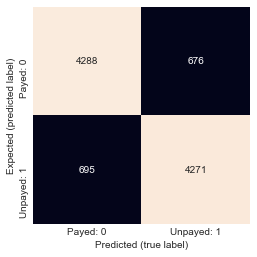

In [133]:
conf_mat_methods(df_list_align, 1, lgb_c=lgb_c)

In [134]:
df_metrics_collection = metrics_methods(1, lr_c, rfc_c, xgb_c, lgb_c, time_lr_c, time_rfc_c, time_xgb_c, time_lgb_c)
df_metrics_collection

{0:                        Accuracy Precision Recall    F1      Time
 Logistic Regression     0.68     0.68      0.67   0.68  00:00:05
 RandomForestClassifier  1.0      1.0       1.0    1.0   00:00:28
 XGBClassifier           0.82     0.82      0.82   0.82  00:00:05
 LGBMClassifier          0.86     0.86      0.86   0.86  00:00:06}

In [135]:
y_test_collection, y_pred_collection = ypred_y_test_methods(y_test_lr_c, y_test_rfc_c, y_test_xgb_c, y_test_lgb_c, lr_c, rfc_c, xgb_c, lgb_c, 0)

In [136]:
df_roc_auc = methods_roc_auc(y_pred_collection, y_test_collection)

Logistic Regression AUC Score: 0.7459157808959102
RandomForestClassifier AUC Score: 1.0
XGBClassifier AUC Score: 0.9017131765952068
LGBMClassifier AUC Score: 0.9423653365041833


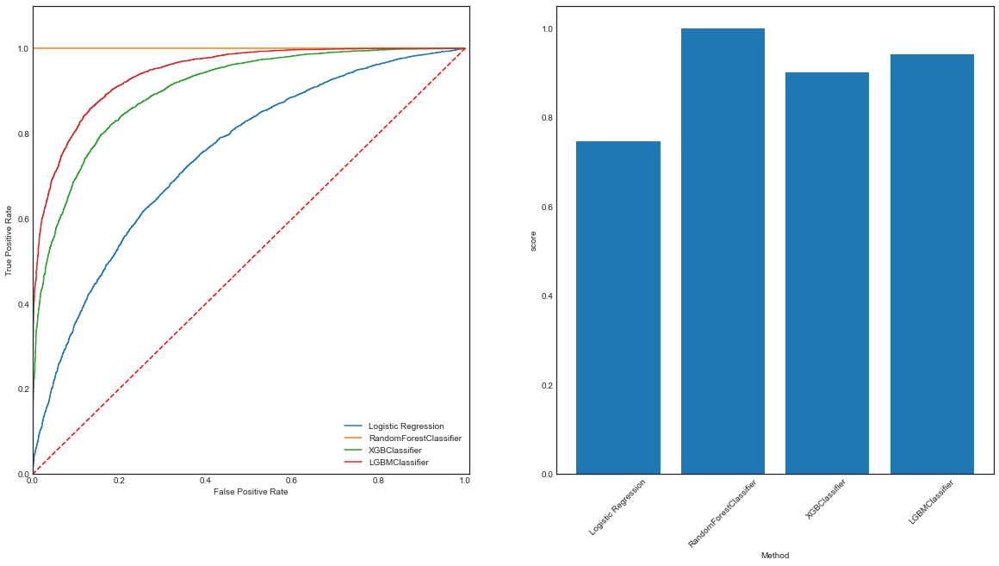

In [137]:
plot_roc_auc(df_roc_auc)

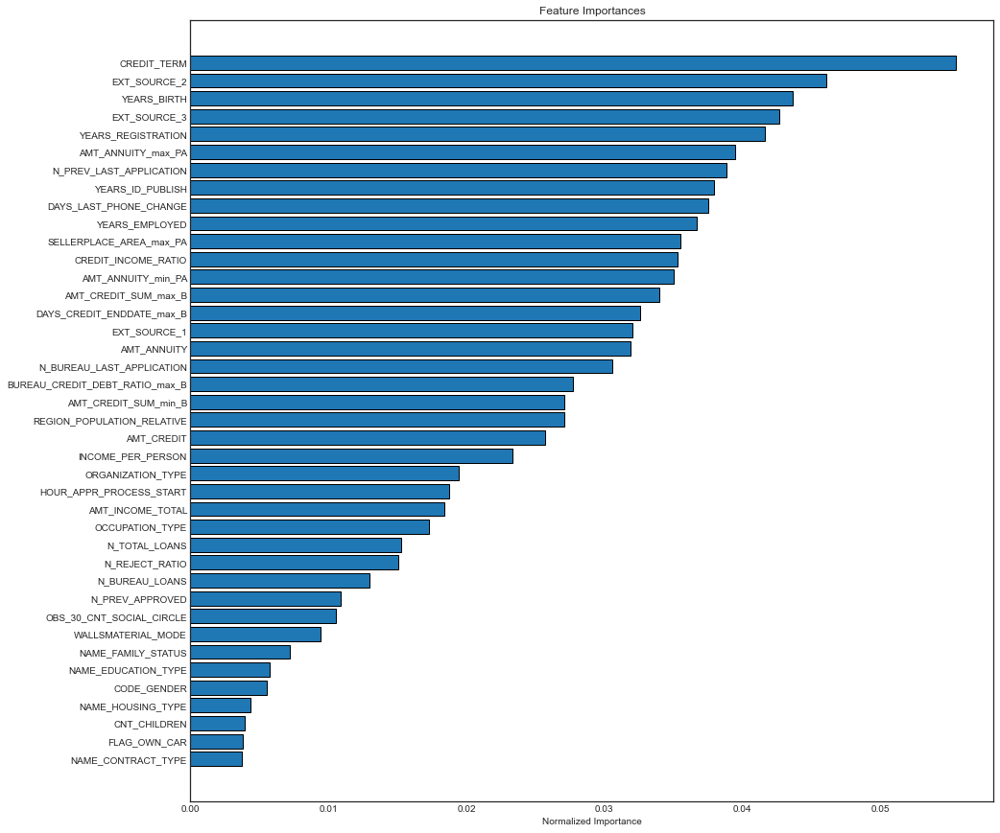

In [138]:
df_feat_importances = pd.DataFrame({'feature': df_list_align[0][1].columns, 
                                    'importance': lgb_m_c[0].feature_importances_})
df_feat_importances_sorted = plot_feature_importances(df_feat_importances, top=40)

# Conclusion

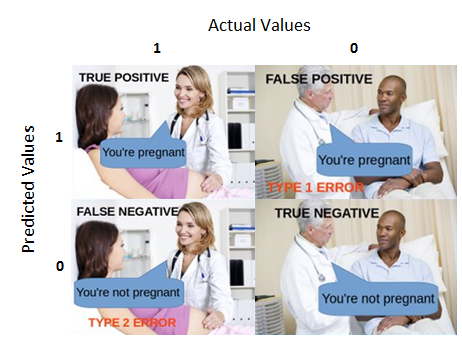

In [139]:
display.Image('matrix.png',
              #retina=True,
             )

The **LGBMClassifier** method gives a great AUC Score. On the other hand, the method predicts a lot of False Positive (Type I error), hence clients predicted not to repay the loan in reality would have repayed it resulting in an extrict model where we  may lose clients.

# Export

In [140]:
app_train.set_index('SK_ID_CURR', inplace=True)
app_train.index.name = None

In [141]:
pred_prob_df_test = lgb_m_c[0].predict_proba(df_list_align[0][1])[:, 1]
pred_df_test = force_prob(pred_prob_df_test, 0.5)
predictions = pd.DataFrame({'RISK_PROBA': pred_prob_df_test, 'TARGET': pred_df_test},
                           columns=['RISK_PROBA', 'TARGET'],
                           index=df_list_align[0][1].index,
                          )
print('TARGET 0 predicted:', len(predictions.where(predictions['TARGET'] == 0).dropna()))
print('TARGET 1 predicted:', len(predictions.where(predictions['TARGET'] == 1).dropna()))

df_test_export = df_list_align[0][1].join(predictions, how='left')
df_train_export = df_list_align[0][0].join(app_train['TARGET'], how='left')

final_export = df_train_export.append(df_test_export)
final_export['RISK_PROBA'].fillna(final_export['TARGET'], inplace=True)
final_export['TARGET'].fillna(final_export['RISK_PROBA'], inplace=True)
final_export.fillna(0, inplace=True)
final_export.sort_index(ascending=True, inplace=True)

TARGET 0 predicted: 2904
TARGET 1 predicted: 45840


In [142]:
dict = {'features':['CREDIT_TERM', 'EXT_SOURCE_2', 'YEARS_BIRTH', 'EXT_SOURCE_3', 'YEARS_EMPLOYED', 'EXT_SOURCE_1', 
                    'YEARS_REGISTRATION', 'AMT_ANNUITY', 'YEARS_ID_PUBLISH', 'CREDIT_INCOME_RATIO', 'AMT_ANNUITY_min_PA', 
                    'DAYS_LAST_PHONE_CHANGE', 'AMT_CREDIT_SUM_max_B', 'N_BUREAU_LAST_APPLICATION', 
                    'REGION_POPULATION_RELATIVE', 'SELLERPLACE_AREA_max_PA', 'BUREAU_CREDIT_DEBT_RATIO_max_B', 
                    'DAYS_CREDIT_ENDDATE_max_B', 'AMT_ANNUITY_max_PA', 'AMT_CREDIT', 'INCOME_PER_PERSON', 
                    'AMT_CREDIT_SUM_min_B', 'N_PREV_LAST_APPLICATION', 'ORGANIZATION_TYPE', 'AMT_INCOME_TOTAL', 
                    'HOUR_APPR_PROCESS_START', 'OCCUPATION_TYPE', 'N_REJECT_RATIO', 'OBS_30_CNT_SOCIAL_CIRCLE', 
                    'CODE_GENDER', 'N_TOTAL_LOANS', 'NAME_FAMILY_STATUS', 'N_BUREAU_LOANS', 'NAME_EDUCATION_TYPE', 
                    'NAME_HOUSING_TYPE', 'WALLSMATERIAL_MODE', 'FLAG_OWN_CAR', 'N_PREV_APPROVED', 'NAME_CONTRACT_TYPE', 
                    'CNT_CHILDREN'],
        'definitions':['Ratio annuity over credit amount', 'Normalized score from external data source', "Client's age (years)",
                       'Normalized score from external data source', 'Relative to application, years since the client has been working for his actual employer',
                       'Normalized score from external data source', 'Relative to application, years since registration change',
                       'Loan annuity', 'Relative to application, years since ID renewal', 'Income to credit amount ratio',
                       'Previous applications minimum annuity amount', 'How many days before application did client change phone',
                       'Maximum credit amount for the Credit Bureau credit', 'Maximum days before current application did client apply for Credit Bureau credit',
                       'Normalized population of region where client lives (if higher, then more populated)', 
                       'Selling area of seller place of the previous application', 'Ratio current debt on Credit Bureau over credit amount for the Credit Bureau',
                       'Maximium remaining duration of Credit Bureau credit (in days) at the time of application in Home Credit', 
                       'Maximum annuity of previous applications', 'Credit amount of loan', 'Household income per capita',
                       'Minimum current credit amount for the Credit Bureau credit', 'Maximum time past since the decision of the previous application was made',
                       "Client's employer type", "Client's income", 'Hour when the client applied to the loan', "Client's occupation", 'Rejected loans ratio',
                       "How many observation of client's social surroundings defaulted on 30 DPD (days past due)", "Client's gender (M/F)",
                       'Number of loans already taken by the client', "Client's civil status", 'Number of loans the client has with the entity', 
                       'Level of highest education the client achieved', "Client's housing situation (renting, living with parents, …)", 
                       'Normalized information about building where the client lives', 'Does the client owns a car?', 
                       'Number of previous loans that where approved by the entity', 'Loan type identification', 'Number of children the client has']}
descriptions = pd.DataFrame(dict)

In [143]:
df_test_export = reduce_mem_usage(df_test_export)
df_train_export = reduce_mem_usage(df_train_export)
final_export = reduce_mem_usage(final_export)

Memory usage of dataframe is 6.07 MB
Memory usage after optimization is: 5.66 MB
Decreased by 6.9%
Memory usage of dataframe is 38.85 MB
Memory usage after optimization is: 36.80 MB
Decreased by 5.3%
Memory usage of dataframe is 38.39 MB
Memory usage after optimization is: 33.97 MB
Decreased by 11.5%


In [144]:
# path_data = '../P7_bunader_agustin/joblib/'

pickle.dump(lgb_m_c[0], open('model_file.sav', 'wb'))
pickle.dump(df_test_export, open('final_file.pkl', 'wb'))
pickle.dump(df_train_export, open('final_train.pkl', 'wb'))
pickle.dump(final_export, open('complete.pkl', 'wb'))
pickle.dump(descriptions, open('descriptions.pkl', 'wb'))